In [15]:
# データの取り込み
import pandas as pd
import numpy as np
import datetime as dt
df = pd.read_csv("edited_data/aando.csv")
tmp = df["time:timestamp"].str.split('+').to_numpy()
time = []
t = []
# timeに時間を入れていく
for i in tmp:
    time.append(i[0])
# print(time[0])
event = df["concept:name"].to_numpy()
case = df["case:concept:name"]
for i in range(len(tmp)):
    t.append([dt.datetime.fromisoformat(time[i].replace(' ','T')), event[i],case[i]])

#t.sort(key=lambda x: x[0])
t.sort()

for i in t:
    if i[1][0] == 'A':
        i.append(i[2]+'_A')
    else:
        i.append(i[2]+'_O')
bo = 0
tmp = {}
for i in t:
    if i[2] in tmp:
        if i[3][-1] not in tmp[i[2]]:
            tmp[i[2]].add(i[3][-1])
            bo += 1
    else:
        tmp[i[2]] = {i[3][-1]}

In [16]:
bo

31509

In [17]:
# ケース対応づけカウントをstep1に持ち込む方
def case_cor(t,cor,inter,c_pattern, T_threshold,n1_threshold,v1_threshold,n2_threshold):
    # 指標1.1
    # T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
    T = T_threshold
    # 結合パターン
    pattern = {}
    ans1 = set()
    t1 =t[0][0]
    l = len(t)
    for i in range(1,l):
        t2 = t[i][0]
        if t2 - t1 < T:
            if (t[i-1][1],t[i][1]) in pattern:
                pattern [(t[i-1][1],t[i][1])] += 1
                if (pattern [(t[i-1][1],t[i][1])] > n1_threshold and t[i-1][1][0] != t[i][1][0]):
                    ans1.add((t[i-1][1],t[i][1]))
            else:
                pattern [(t[i-1][1],t[i][1])] = 1
        t1 = t2

    case1 = t[0][3]
    task1 = t[0][1]
    l = len(t)
    for i in range(1,l):
        case2 = t[i][3]
        task2 = t[i][1]
        # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
        # A->B，B->Aは出ないようになっている
        # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
        if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
            if (case1,case2) not in c_pattern:
                if (case2,case1) not in c_pattern:
                    c_pattern[(case1,case2)] = 1
                else:
                    c_pattern[(case2,case1)] += 1
            else:
                c_pattern[(case1,case2)] += 1
        case1 = case2
        task1 = task2


    # あるケースが複数ケースと結びつく場合を排除する工程(指標1.1の整理)
    # もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
    # つまり3回以上同じかも判定されたものの中で，
    # 同じかも判定された数の多い順に対応づけする．
    # liは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
    import copy
    import datetime
    for_sort = []
    
    #　指標1.1の整理
    import matplotlib.pyplot as plt
    m = 40
    plt.xlim(0,m)
    li = list(c_pattern.values())
    plt.hist(li, bins=100,range=(0,m))
    
    for k, v in c_pattern.items():
        if v > v1_threshold:
            # A -> Oの順番にする
            if k[0][-1] == 'O':
                for_sort.append([k[1],k[0],v])
            else:
                for_sort.append([k[0],k[1],v])
    for_sort.sort()

    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
                li.append(tmp)
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j
    for_sort = copy.deepcopy(li)
    for_sort.sort(key=lambda x: x[1])
    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][1] != for_sort[i+j][1]:
                li.append([tmp[0],tmp[1]])
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j

    for i in li:
        cor[i[0]] = i[1]
        cor[i[1]] = i[0]

    nt = []
    for i in range(len(t)):
        if t[i][3] not in cor:
            nt.append(t[i])

            

    # 評価
    # 全ケース数
    num = set()
    for i in t:
        num.add(i[2])
    a = len(num)
    #print("残っているデータの全ケース数",a)

    # 対応づけられたケース数と誤って対応づけられたケース数
    correct_num = 0
    miss = 0
    for k, v in cor.items():
        if k[:-2] != v[:-2]:
            miss+=1
        else:
            correct_num+=1
    #print("対応づけられたケース数は",correct_num+miss)
    #print("誤って対応づけられたケース数は",miss)
    # 対応づけた中でのケースの正解率
    #if correct_num+miss != 0:
    #    print("適合率(Precision)は",correct_num/(correct_num+miss))
    #    print("再現率(Recall)は",correct_num/(31509*2))
    #print("\n")

    
    # 組織間を跨ぐ移動をしている部分のタスクのペアと時間差を抽出し，それをまだケースが対応づけられていない部分に適用してみる
    # dicはケース名がkey，（タスク,時刻)の流れがvalueの辞書
    dic = {}
    for i in t:
        if i[3] in cor:
            # もしケース名がdicに入っていなかったら
            if i[3] not in dic:
                if cor[i[3]] not in dic:
                    dic[i[3]] = [(i[1],i[0])]
                else:
                    dic[cor[i[3]]].append((i[1],i[0]))
            else:
                dic[i[3]].append((i[1],i[0]))
    
    # interはタスクのペアをkey,[時間差の配列, カウント]をvalueとした辞書
    for v in dic.values():
        pre = v[0]
        for i in range(1,len(v)):
            # もし異なる組織だったら(taskの名前の頭文字で判別)
            if pre[0][0] != v[i][0][0]:
                if (pre[0],v[i][0]) not in inter:
                    inter[(pre[0],v[i][0])] = [[v[i][1] - pre[1]],1]
                else:
                    inter[(pre[0],v[i][0])][0].append(v[i][1] - pre[1])
                    inter[(pre[0],v[i][0])][1] += 1
            pre = v[i]
    
    #print("検出されたタスクペア数は",len(inter))
    f_inter = {}
    for k, v in inter.items():
        if v[1] > n2_threshold:
            f_inter[k] = v[0]
    #print("閾値nによって絞られた後のタスクペア数は",len(f_inter))
    
    import statistics
    from scipy import stats
    task_time = {}
    for k, v in f_inter.items():
        li = [i.total_seconds() for i in v]
        if len(li) < 10:
            continue
        c = 0
        for diff in li:
            if diff <= T.total_seconds():
                c += 1
        if c/len(li) > 0.95:
        # if statistics.variance(li) < 10*5:
        # if statistics.variance(li) < 10**50:
            #t_dist = stats.t(loc=statistics.mean(li),scale=np.sqrt(statistics.variance(li)/10),df=len(li)-1)
            #alphaが求めたい区間に含まれる確率#alphaも閾値
            # 値を小さくすると条件が厳しくなる
            #bottom, up = t_dist.interval(alpha=0.95)
            bottom, up = np.percentile(li,q=[2.5,97.5])
            #print(bottom,up)
            task_time[k] = [statistics.mean(li),statistics.median(li),bottom,up]
            #print(k)
            
    import bisect
    # bisectのために時間のみの配列を作る(始めてから何秒経ったか)
    for_bisect = []
    # 記録が取られ始めた時間
    start = datetime.datetime(2016, 1, 1, 9, 51, 15)
    for row in nt:
        for_bisect.append((row[0]-start).total_seconds())
    
    
    # ntの長さはO(10^5)くらい
    for i in range(len(nt)):
        # task_timeの長さはO(10^2)くらい
        for tasks, time in task_time.items():
            if nt[i][1] == tasks[0]:
                # time[2](時間差の中央値)後にtasks[1]が存在するかを調べる．計算量的にO(100)くらいの探索しかできない(全てでO(10^10~10^11)となる．)
                # (現在の時間+時間差)にあたる時間が何行目になるかを検索しなくてはならない．二分探索をするとO(log100000) = O(17)
                # 統計的に決定する．
                #index = bisect.bisect_left(for_bisect,(for_bisect[i]+time[1]-margin))
                index = bisect.bisect_left(for_bisect,(for_bisect[i]+max(0,time[2])))
                j = 1
                #while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[1]+margin:
                while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[3]:
                    if nt[i][3] == nt[index+j][3]:
                        break
                    if tasks[1] == nt[index+j][1]:
                        if (nt[i][3],nt[index+j][3]) not in c_pattern:
                            if (nt[index+j][3],nt[i][3]) not in c_pattern:
                                c_pattern[(nt[i][3],nt[index+j][3])] = 1
                            else:
                                c_pattern[(nt[index+j][3],nt[i][3])] += 1
                        else:
                            c_pattern[(nt[i][3],nt[index+j][3])] += 1
                    j += 1


    

    t = copy.deepcopy(nt)
    nt = []
    for i in range(len(t)):
        if t[i][3] not in cor:
            nt.append(t[i])
    return nt, cor, inter, c_pattern

1 0 1 0:00:01
適合率(Precision)は 0.9900089663122839
再現率(Recall)は 0.9811799803230823


1 0 1 0:00:10
適合率(Precision)は 0.9879799239154758
再現率(Recall)は 0.9808308737186201


1 0 1 0:01:40
適合率(Precision)は 0.9863394082538062
再現率(Recall)は 0.9807673997905361


1 0 1 0:16:40
適合率(Precision)は 0.9842361708225853
再現率(Recall)は 0.9808626106826621


1 0 4 0:00:01
適合率(Precision)は 0.9900089663122839
再現率(Recall)は 0.9811799803230823


1 0 4 0:00:10
適合率(Precision)は 0.9879799239154758
再現率(Recall)は 0.9808308737186201


1 0 4 0:01:40
適合率(Precision)は 0.9863394082538062
再現率(Recall)は 0.9807673997905361


1 0 4 0:16:40
適合率(Precision)は 0.9842361708225853
再現率(Recall)は 0.9808626106826621


1 0 16 0:00:01
適合率(Precision)は 0.9900089663122839
再現率(Recall)は 0.9811799803230823


1 0 16 0:00:10
適合率(Precision)は 0.9879799239154758
再現率(Recall)は 0.9808308737186201


1 0 16 0:01:40
適合率(Precision)は 0.9863394082538062
再現率(Recall)は 0.9807673997905361


1 0 16 0:16:40
適合率(Precision)は 0.9842361708225853
再現率(Recall)は 0.9808626106826621




1 3 1 0:00:10
適合率(Precision)は 0.9894269469111352
再現率(Recall)は 0.9830524612015614


1 3 1 0:01:40
適合率(Precision)は 0.9774347172947231
再現率(Recall)は 0.9705480973690057


1 3 1 0:16:40
適合率(Precision)は 0.9932221727232228
再現率(Recall)は 0.9906058586435622


1 3 4 0:00:01
適合率(Precision)は 0.9905971151693479
再現率(Recall)は 0.9829889872734774


1 3 4 0:00:10
適合率(Precision)は 0.9894269469111352
再現率(Recall)は 0.9830524612015614


1 3 4 0:01:40
適合率(Precision)は 0.9774347172947231
再現率(Recall)は 0.9705480973690057


1 3 4 0:16:40
適合率(Precision)は 0.9932221727232228
再現率(Recall)は 0.9906058586435622


1 3 16 0:00:01
適合率(Precision)は 0.9905971151693479
再現率(Recall)は 0.9829889872734774


1 3 16 0:00:10
適合率(Precision)は 0.9894269469111352
再現率(Recall)は 0.9830524612015614


1 3 16 0:01:40
適合率(Precision)は 0.9886073525657391
再現率(Recall)は 0.9831794090577295


1 3 16 0:16:40
適合率(Precision)は 0.9951013137385882
再現率(Recall)は 0.9928274461265035


1 3 64 0:00:01
適合率(Precision)は 0.9905971151693479
再現率(Recall)は 0.9829889872734774



1 8 1 0:01:40
適合率(Precision)は 0.9832619945058455
再現率(Recall)は 0.9769272271414516


1 8 1 0:16:40
適合率(Precision)は 0.9934738316566917
再現率(Recall)は 0.99041543685931


1 8 4 0:00:01
適合率(Precision)は 0.9898569737305218
再現率(Recall)は 0.9818147196039226


1 8 4 0:00:10
適合率(Precision)は 0.9888696987142583
再現率(Recall)は 0.9812434542511663


1 8 4 0:01:40
適合率(Precision)は 0.9832619945058455
再現率(Recall)は 0.9769272271414516


1 8 4 0:16:40
適合率(Precision)は 0.9934738316566917
再現率(Recall)は 0.99041543685931


1 8 16 0:00:01
適合率(Precision)は 0.98976
再現率(Recall)は 0.9816242978196705


1 8 16 0:00:10
適合率(Precision)は 0.9889976332117956
再現率(Recall)は 0.9813704021073344


1 8 16 0:01:40
適合率(Precision)は 0.9837034670075092
再現率(Recall)は 0.9770224380335777


1 8 16 0:16:40
適合率(Precision)は 0.9933456444218034
再現率(Recall)は 0.9901615411469739


1 8 64 0:00:01
適合率(Precision)は 0.98976
再現率(Recall)は 0.9816242978196705


1 8 64 0:00:10
適合率(Precision)は 0.9889976332117956
再現率(Recall)は 0.9813704021073344


1 8 64 0:01:40
適合率(Preci

4 2 4 0:00:01
適合率(Precision)は 0.9911354326676908
再現率(Recall)は 0.9829255133453934


4 2 4 0:00:10
適合率(Precision)は 0.9887065297373389
再現率(Recall)は 0.9807991367545781


4 2 4 0:01:40
適合率(Precision)は 0.983523163552598
再現率(Recall)は 0.9756260116157288


4 2 4 0:16:40
適合率(Precision)は 0.9877243886107834
再現率(Recall)は 0.9831476720936875


4 2 16 0:00:01
適合率(Precision)は 0.9911354326676908
再現率(Recall)は 0.9829255133453934


4 2 16 0:00:10
適合率(Precision)は 0.9889638847125811
再現率(Recall)は 0.9811799803230823


4 2 16 0:01:40
適合率(Precision)は 0.983814215341309
再現率(Recall)は 0.9761020660763592


4 2 16 0:16:40
適合率(Precision)は 0.987531887755102
再現率(Recall)は 0.9828620394173093


4 2 64 0:00:01
適合率(Precision)は 0.9911354326676908
再現率(Recall)は 0.9829255133453934


4 2 64 0:00:10
適合率(Precision)は 0.9889638847125811
再現率(Recall)は 0.9811799803230823


4 2 64 0:01:40
適合率(Precision)は 0.983814215341309
再現率(Recall)は 0.9761020660763592


4 2 64 0:16:40
適合率(Precision)は 0.9882668027037368
再現率(Recall)は 0.9837189374464439




4 6 4 0:00:10
適合率(Precision)は 0.9893838135132542
再現率(Recall)は 0.9819734044241328


4 6 4 0:01:40
適合率(Precision)は 0.9815319503671166
再現率(Recall)は 0.9715636802183503


4 6 4 0:16:40
適合率(Precision)は 0.9926765586193721
再現率(Recall)は 0.9894315909740075


4 6 16 0:00:01
適合率(Precision)は 0.9923554247697032
再現率(Recall)は 0.9846393094036624


4 6 16 0:00:10
適合率(Precision)は 0.9895763389288569
再現率(Recall)は 0.982227300136469


4 6 16 0:01:40
適合率(Precision)は 0.9868559915571332
再現率(Recall)は 0.9793392364086452


4 6 16 0:16:40
適合率(Precision)は 0.9944937776504663
再現率(Recall)は 0.9916531784569488


4 6 64 0:00:01
適合率(Precision)は 0.9923554247697032
再現率(Recall)は 0.9846393094036624


4 6 64 0:00:10
適合率(Precision)は 0.9895763389288569
再現率(Recall)は 0.982227300136469


4 6 64 0:01:40
適合率(Precision)は 0.9868875527696047
再現率(Recall)は 0.9793392364086452


4 6 64 0:16:40
適合率(Precision)は 0.9948430636022155
再現率(Recall)は 0.9918436002412009


4 6 256 0:00:01
適合率(Precision)は 0.9917397707626304
再現率(Recall)は 0.983084198165603

16 1 4 0:01:40
適合率(Precision)は 0.9900416266410502
再現率(Recall)は 0.9812751912152083


16 1 4 0:16:40
適合率(Precision)は 0.9874828367979053
再現率(Recall)は 0.9814656129994604


16 1 16 0:00:01
適合率(Precision)は 0.9919959019017737
再現率(Recall)は 0.9833380938779397


16 1 16 0:00:10
適合率(Precision)は 0.9907742576160425
再現率(Recall)は 0.9815925608556285


16 1 16 0:01:40
適合率(Precision)は 0.9900416266410502
再現率(Recall)は 0.9812751912152083


16 1 16 0:16:40
適合率(Precision)は 0.9874828367979053
再現率(Recall)は 0.9814656129994604


16 1 64 0:00:01
適合率(Precision)は 0.9919959019017737
再現率(Recall)は 0.9833380938779397


16 1 64 0:00:10
適合率(Precision)は 0.9907742576160425
再現率(Recall)は 0.9815925608556285


16 1 64 0:01:40
適合率(Precision)は 0.9900416266410502
再現率(Recall)は 0.9812751912152083


16 1 64 0:16:40
適合率(Precision)は 0.987546699875467
再現率(Recall)は 0.9815290869275445


16 1 256 0:00:01
適合率(Precision)は 0.9919959019017737
再現率(Recall)は 0.9833380938779397


16 1 256 0:00:10
適合率(Precision)は 0.9907742576160425
再現率(Recall)は 0.

16 4 4 0:01:40
適合率(Precision)は 0.9865501008742434
再現率(Recall)は 0.9777206512425022


16 4 4 0:16:40
適合率(Precision)は 0.9952232341889051
再現率(Recall)は 0.9918436002412009


16 4 16 0:00:01
適合率(Precision)は 0.9934143222506394
再現率(Recall)は 0.9861944206417214


16 4 16 0:00:10
適合率(Precision)は 0.9913530824659728
再現率(Recall)は 0.9824177219207211


16 4 16 0:01:40
適合率(Precision)は 0.9865488086087625
再現率(Recall)は 0.9776254403503761


16 4 16 0:16:40
適合率(Precision)は 0.9950305810397554
再現率(Recall)は 0.9913358088165286


16 4 64 0:00:01
適合率(Precision)は 0.9934143222506394
再現率(Recall)は 0.9861944206417214


16 4 64 0:00:10
適合率(Precision)は 0.9913530824659728
再現率(Recall)は 0.9824177219207211


16 4 64 0:01:40
適合率(Precision)は 0.9865488086087625
再現率(Recall)は 0.9776254403503761


16 4 64 0:16:40
適合率(Precision)は 0.995697074010327
再現率(Recall)は 0.9914310197086547


16 4 256 0:00:01
適合率(Precision)は 0.9934143222506394
再現率(Recall)は 0.9861944206417214


16 4 256 0:00:10
適合率(Precision)は 0.9913530824659728
再現率(Recall)は 0.

64 0 4 0:01:40
適合率(Precision)は 0.9916154633896569
再現率(Recall)は 0.9834015678060237


64 0 4 0:16:40
適合率(Precision)は 0.9893362280897801
再現率(Recall)は 0.9834333047700657


64 0 16 0:00:01
適合率(Precision)は 0.9973882023187667
再現率(Recall)は 0.9938112920118062


64 0 16 0:00:10
適合率(Precision)は 0.9921584944309307
再現率(Recall)は 0.98381414833857


64 0 16 0:01:40
適合率(Precision)は 0.9916154633896569
再現率(Recall)は 0.9834015678060237


64 0 16 0:16:40
適合率(Precision)は 0.9893362280897801
再現率(Recall)は 0.9834333047700657


64 0 64 0:00:01
適合率(Precision)は 0.9973882023187667
再現率(Recall)は 0.9938112920118062


64 0 64 0:00:10
適合率(Precision)は 0.9921584944309307
再現率(Recall)は 0.98381414833857


64 0 64 0:01:40
適合率(Precision)は 0.9916154633896569
再現率(Recall)は 0.9834015678060237


64 0 64 0:16:40
適合率(Precision)は 0.9907588015220797
再現率(Recall)は 0.9833380938779397


64 0 256 0:00:01
適合率(Precision)は 0.9973882023187667
再現率(Recall)は 0.9938112920118062


64 0 256 0:00:10
適合率(Precision)は 0.9921584944309307
再現率(Recall)は 0.983

64 3 4 0:01:40
適合率(Precision)は 0.9896877409406323
再現率(Recall)は 0.9777206512425022


64 3 4 0:16:40
適合率(Precision)は 0.995575221238938
再現率(Recall)は 0.9925735504141674


64 3 16 0:00:01
適合率(Precision)は 0.9980891719745223
再現率(Recall)は 0.9946364530768986


64 3 16 0:00:10
適合率(Precision)は 0.9939888089528377
再現率(Recall)は 0.9866070011742677


64 3 16 0:01:40
適合率(Precision)は 0.9934705374003777
再現率(Recall)は 0.9850836269002508


64 3 16 0:16:40
適合率(Precision)は 0.9966246338046109
再現率(Recall)は 0.9933035005871338


64 3 64 0:00:01
適合率(Precision)は 0.9980891719745223
再現率(Recall)は 0.9946364530768986


64 3 64 0:00:10
適合率(Precision)は 0.9939888089528377
再現率(Recall)は 0.9866070011742677


64 3 64 0:01:40
適合率(Precision)は 0.9934705374003777
再現率(Recall)は 0.9850836269002508


64 3 64 0:16:40
適合率(Precision)は 0.9974519047012358
再現率(Recall)は 0.9938747659398902


64 3 256 0:00:01
適合率(Precision)は 0.997801917747125
再現率(Recall)は 0.9940651877241423


64 3 256 0:00:10
適合率(Precision)は 0.9929911028611662
再現率(Recall)は 0.9

64 8 4 0:01:40
適合率(Precision)は 0.9900086741414207
再現率(Recall)は 0.9780062839188803


64 8 4 0:16:40
適合率(Precision)は 0.9958213716108453
再現率(Recall)は 0.9907962804278143


64 8 16 0:00:01
適合率(Precision)は 0.9983763649676864
再現率(Recall)は 0.9952711923577391


64 8 16 0:00:10
適合率(Precision)は 0.9930983564458141
再現率(Recall)は 0.9818464565679647


64 8 16 0:01:40
適合率(Precision)は 0.9902351278427342
再現率(Recall)は 0.9783871274873845


64 8 16 0:16:40
適合率(Precision)は 0.9952172942639416
再現率(Recall)は 0.9906058586435622


64 8 64 0:00:01
適合率(Precision)は 0.9983763649676864
再現率(Recall)は 0.9952711923577391


64 8 64 0:00:10
適合率(Precision)は 0.9930983564458141
再現率(Recall)は 0.9818464565679647


64 8 64 0:01:40
適合率(Precision)は 0.9902351278427342
再現率(Recall)は 0.9783871274873845


64 8 64 0:16:40
適合率(Precision)は 0.9961709052618144
再現率(Recall)は 0.9907962804278143


64 8 256 0:00:01
適合率(Precision)は 0.9983763649676864
再現率(Recall)は 0.9952711923577391


64 8 256 0:00:10
適合率(Precision)は 0.9930983564458141
再現率(Recall)は 0

適合率(Precision)は 0.9910167153261253
再現率(Recall)は 0.9803230822939477


256 2 4 0:16:40
適合率(Precision)は 0.9914702581369248
再現率(Recall)は 0.9812751912152083


256 2 16 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.9885112190167888


256 2 16 0:00:10
適合率(Precision)は 0.9952176145846707
再現率(Recall)は 0.9840680440509061


256 2 16 0:01:40
適合率(Precision)は 0.9910167153261253
再現率(Recall)は 0.9803230822939477


256 2 16 0:16:40
適合率(Precision)は 0.9914702581369248
再現率(Recall)は 0.9812751912152083


256 2 64 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.9885112190167888


256 2 64 0:00:10
適合率(Precision)は 0.9952176145846707
再現率(Recall)は 0.9840680440509061


256 2 64 0:01:40
適合率(Precision)は 0.9911791121375417
再現率(Recall)は 0.980703925862452


256 2 64 0:16:40
適合率(Precision)は 0.9938005910317358
再現率(Recall)は 0.9819099304960488


256 2 256 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.9885112190167888


256 2 256 0:00:10
適合率(Precision)は 0.9952176145846707
再現率(Recall)は 0.9840680440509061


256 2 256 0:01:40
適合率(Precisio

256 6 16 0:16:40
適合率(Precision)は 0.9965141194153955
再現率(Recall)は 0.9889237995493351


256 6 64 0:00:01
256 6 64 0:00:10
適合率(Precision)は 0.9953659007530411
再現率(Recall)は 0.9816242978196705


256 6 64 0:01:40
適合率(Precision)は 0.9936570287848542
再現率(Recall)は 0.9794344473007712


256 6 64 0:16:40
適合率(Precision)は 0.9975674551099446
再現率(Recall)は 0.9891459582976293


256 6 256 0:00:01
256 6 256 0:00:10
適合率(Precision)は 0.9948808757244044
再現率(Recall)は 0.980703925862452


256 6 256 0:01:40
適合率(Precision)は 0.9939848172928462
再現率(Recall)は 0.980703925862452


256 6 256 0:16:40
適合率(Precision)は 0.9969571762595689
再現率(Recall)は 0.9878447427719065


256 6 1000 0:00:01
256 6 1000 0:00:10
適合率(Precision)は 0.9947836166924265
再現率(Recall)は 0.9804817671141579


256 6 1000 0:01:40
適合率(Precision)は 0.9938545688545689
再現率(Recall)は 0.9803230822939477


256 6 1000 0:16:40
適合率(Precision)は 0.9967966172277926
再現率(Recall)は 0.9875591100955282


256 6 4000 0:00:01
256 6 4000 0:00:10
適合率(Precision)は 0.9947183665582429
再現率(Re

適合率(Precision)は 0.9999675472187967
再現率(Recall)は 0.9779110730267543


1000 1 1000 0:00:10
適合率(Precision)は 0.9996770025839793
再現率(Recall)は 0.982259037100511


1000 1 1000 0:01:40
適合率(Precision)は 0.993283606186832
再現率(Recall)は 0.9762607508965693


1000 1 1000 0:16:40
適合率(Precision)は 0.9927596591273147
再現率(Recall)は 0.9834650417341078


1000 1 4000 0:00:01
適合率(Precision)は 0.9999675261414561
再現率(Recall)は 0.9772763337459138


1000 1 4000 0:00:10
適合率(Precision)は 0.9996769086620788
再現率(Recall)は 0.9819734044241328


1000 1 4000 0:01:40
適合率(Precision)は 0.9932823046862385
再現率(Recall)は 0.9760703291123172


1000 1 4000 0:16:40
適合率(Precision)は 0.9927591951813405
再現率(Recall)は 0.9834015678060237


1000 1 16000 0:00:01
適合率(Precision)は 0.9999674669789836
再現率(Recall)は 0.9754990637595607


1000 1 16000 0:00:10
適合率(Precision)は 0.999676364930904
再現率(Recall)は 0.9803230822939477


1000 1 16000 0:01:40
適合率(Precision)は 0.9932401837117537
再現率(Recall)は 0.9746104287663843


1000 1 16000 0:16:40
適合率(Precision)は 0.99

適合率(Precision)は 0.999935591910344
再現率(Recall)は 0.9854327335047129


1000 4 1000 0:01:40
適合率(Precision)は 0.9952084952084952
再現率(Recall)は 0.9755942746516868


1000 4 1000 0:16:40
適合率(Precision)は 0.995230883253311
再現率(Recall)は 0.9801961344377796


1000 4 4000 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.9773080707099558


1000 4 4000 0:00:10
適合率(Precision)は 0.999935577387663
再現率(Recall)は 0.9852105747564188


1000 4 4000 0:01:40
適合率(Precision)は 0.9951423297386573
再現率(Recall)は 0.9752451680472246


1000 4 4000 0:16:40
適合率(Precision)は 0.9952304221720916
再現率(Recall)は 0.9801009235456536


1000 4 16000 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.9752451680472246


1000 4 16000 0:00:10
適合率(Precision)は 0.9999354776268671
再現率(Recall)は 0.9836872004824019


1000 4 16000 0:01:40
適合率(Precision)は 0.9951342934994161
再現率(Recall)は 0.9736265828810816


1000 4 16000 0:16:40
適合率(Precision)は 0.995221027479092
再現率(Recall)は 0.9781649687390904


1000 6 1 0:00:01
1000 6 1 0:00:10
適合率(Precision)は 0.9999354526383734
再現

適合率(Precision)は 1.0
再現率(Recall)は 0.9380177092259354


4000 1 1 0:01:40
適合率(Precision)は 0.9996979561700843
再現率(Recall)は 0.945380684883684


4000 1 1 0:16:40
適合率(Precision)は 0.9858697790308832
再現率(Recall)は 0.9543622457075757


4000 1 4 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598495667904408


4000 1 4 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9380177092259354


4000 1 4 0:01:40
適合率(Precision)は 0.9996979561700843
再現率(Recall)は 0.945380684883684


4000 1 4 0:16:40
適合率(Precision)は 0.9858697790308832
再現率(Recall)は 0.9543622457075757


4000 1 16 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598495667904408


4000 1 16 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9380177092259354


4000 1 16 0:01:40
適合率(Precision)は 0.9996979561700843
再現率(Recall)は 0.945380684883684


4000 1 16 0:16:40
適合率(Precision)は 0.9858697790308832
再現率(Recall)は 0.9543622457075757


4000 1 64 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598495667904408


4000 1 64 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9380177092259354


4

4000 4 4 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9379859722618934


4000 4 4 0:01:40
適合率(Precision)は 0.9999664643348201
再現率(Recall)は 0.9463327938049446


4000 4 4 0:16:40
適合率(Precision)は 0.9682882882882883
再現率(Recall)は 0.9380494461899774


4000 4 16 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598495667904408


4000 4 16 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9379859722618934


4000 4 16 0:01:40
適合率(Precision)は 0.9999664643348201
再現率(Recall)は 0.9463327938049446


4000 4 16 0:16:40
適合率(Precision)は 0.9682882882882883
再現率(Recall)は 0.9380494461899774


4000 4 64 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598495667904408


4000 4 64 0:00:10
適合率(Precision)は 1.0
再現率(Recall)は 0.9379859722618934


4000 4 64 0:01:40
適合率(Precision)は 0.9999664643348201
再現率(Recall)は 0.9463327938049446


4000 4 64 0:16:40
適合率(Precision)は 0.9772426567875099
再現率(Recall)は 0.9376368656574312


4000 4 256 0:00:01
適合率(Precision)は 1.0
再現率(Recall)は 0.8598178298263988


4000 4 256 0:00:10
適合率(Precision)は 0.99996616363

16000 0 1000 0:00:01
適合率(Precision)は 0.9998719262295082
再現率(Recall)は 0.9910819131041925


16000 0 1000 0:00:10
適合率(Precision)は 0.9998719262295082
再現率(Recall)は 0.9910819131041925


16000 0 1000 0:01:40
適合率(Precision)は 0.9998719262295082
再現率(Recall)は 0.9910819131041925


16000 0 1000 0:16:40
適合率(Precision)は 0.9998079139454475
再現率(Recall)は 0.9911453870322765


16000 0 4000 0:00:01
適合率(Precision)は 0.9998718605843158
再現率(Recall)は 0.9905741216795202


16000 0 4000 0:00:10
適合率(Precision)は 0.9998718605843158
再現率(Recall)は 0.9905741216795202


16000 0 4000 0:01:40
適合率(Precision)は 0.9998718605843158
再現率(Recall)は 0.9905741216795202


16000 0 4000 0:16:40
適合率(Precision)は 0.9997757919349156
再現率(Recall)は 0.9906375956076042


16000 0 16000 0:00:01
適合率(Precision)は 0.9998716344148134
再現率(Recall)は 0.988828588657209


16000 0 16000 0:00:10
適合率(Precision)は 0.9998716344148134
再現率(Recall)は 0.988828588657209


16000 0 16000 0:01:40
適合率(Precision)は 0.9998716344148134
再現率(Recall)は 0.988828588657209


16000 0 16

16000 3 256 0:00:10
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 256 0:01:40
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 256 0:16:40
適合率(Precision)は 0.942080378250591
再現率(Recall)は 0.5817702878542639


16000 3 1000 0:00:01
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 1000 0:00:10
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 1000 0:01:40
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 1000 0:16:40
適合率(Precision)は 0.9357319843072476
再現率(Recall)は 0.5752959471896918


16000 3 4000 0:00:01
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 4000 0:00:10
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 4000 0:01:40
適合率(Precision)は 0.9999411487758946
再現率(Recall)は 0.5392427560379575


16000 3 4000 0:16:40
適合率(Precision)は 0.9357319843072476
再現率(Recall)は 0.5752959471896918


16000 3 16000 

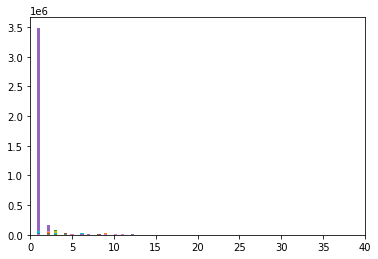

In [18]:
# 一回しかカウントされていないプロセスの種類を数えてそれがもっとも少ないものにする
#n1 = [1,5,25,125,1000,5000]
#v = [0,1,2,3,4,5]
#n2 = [1,5,25,125,1000,5000]
n1 = [1,4,16,64,256,1000,4000,16000]
v = [0,1,2,3,4,6,8]
n2 = [1,4,16,64,256,1000,4000,16000]
T_set = [dt.timedelta(seconds=1),dt.timedelta(seconds=10),dt.timedelta(seconds=100),dt.timedelta(seconds=1000)]
noize = 0
ans = []
precision = 0
recall = 0

#T = dt.timedelta(seconds=0.0582)
#T = dt.timedelta(seconds=0.0296)
for n1_threshold in n1:
    for v_threshold in v:
        for n2_threshold in n2:
            for T in T_set:
                print(n1_threshold,v_threshold,n2_threshold,T)
                nt = t
                cor = {}
                inter = {}
                c_pattern = {}
                tmp = 0
                for i in range(20):
                    nt, cor, inter, c_pattern = case_cor(nt,cor,inter,c_pattern,T,n1_threshold,v_threshold,n2_threshold)
                    if tmp == len(nt) or len(nt) == 0:
                        break
                    tmp = len(nt)
                correct_num = 0
                miss = 0
                for k, vv in cor.items():
                    if k[:-2] != vv[:-2]:
                        miss+=1
                    else:
                        correct_num+=1
                if correct_num+miss != 0:
                    print("適合率(Precision)は",correct_num/(correct_num+miss))
                    print("再現率(Recall)は",correct_num/(bo*2))
                    print("\n")
                #対応づけられたケースからプロセスを作成
                dic = {}
                for i in t:
                    if i[3] in cor:
                        if i[3] not in dic:
                            if cor[i[3]] not in dic:
                                dic[i[3]] = [i[1]]
                            else:
                                dic[cor[i[3]]].append(i[1])
                        else:
                            dic[i[3]].append(i[1])

                from collections import defaultdict
                d = defaultdict(int)
                for process in dic.values():
                    d[tuple(process)] += 1
                flow = defaultdict(int)
                for process,num in d.items():
                    for i in range(1,len(process)):
                        flow[(process[i-1],process[i])] += num
                c = 0
                boundary = bo * 0.01
                out = {}
                for pair,num in flow.items():
                    if num < boundary:
                        c += 1
                    else:
                        out[pair] = num
                if correct_num+miss != 0:
                    ans.append([c,correct_num/(correct_num+miss),correct_num/(bo*2),out,cor,len(cor)/(bo*2)])
                else:
                    ans.append([c,'-','-',out,cor,len(cor)/(bo*2)])

In [19]:
ans.sort(key=lambda x: x[0])

In [20]:
index = 0
for index in range(len(ans)):
    if ans[index][1] != '-' and ans[index][5] > 0:
        print(index)
        break

144


In [21]:
for i in ans:
    print(i[0],i[1],i[2])

0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
39 1.0 0.8576279793074995
39 1.0 0.8576279793074995
41 1.0 0.9237678123710685
41 1.0 0.9238630232631947
41 1.0 0.9215144879240852
41 1.0

60 0.9992572738721865 0.9820686153162589
60 0.9992572738721865 0.9820686153162589
60 0.9992572738721865 0.9820686153162589
60 0.9992572738721865 0.9820686153162589
60 0.9992572738721865 0.9820686153162589
60 0.9992548676580166 0.9788949189120568
60 0.9992543361971146 0.9781967057031324
65 0.9982212160413971 0.9795613951569393
68 0.9976680917217257 0.9776254403503761
70 0.9944683861838297 0.9813704021073344
70 0.9944683861838297 0.9813704021073344
70 0.9944683861838297 0.9813704021073344
70 0.9944683861838297 0.9813704021073344
70 0.9944683861838297 0.9813704021073344
70 0.9944683861838297 0.9813704021073344
71 0.9929434509424843 0.9780062839188803
71 0.992937078724159 0.9771176489257037
73 0.9848311857771979 0.958138944428576
73 0.9848311857771979 0.958138944428576
73 0.9848311857771979 0.958138944428576
73 0.9871421560608539 0.9575676790758196
73 0.9871421560608539 0.9575676790758196
73 0.9871421560608539 0.9575676790758196
74 0.9876515052782484 0.9620425910057444
75 0.998001676013666

100 0.9928108125379429 0.9861309467136373
100 0.9928108125379429 0.9861309467136373
100 0.9928108125379429 0.9861309467136373
100 0.9928108125379429 0.9861309467136373
100 0.9928105828220859 0.9860992097495953
100 0.9639489554526371 0.9181821066996732
100 0.9639489554526371 0.9181821066996732
100 0.8268700418780429 0.7707639087244914
101 0.9960859188544152 0.9934304484433019
101 0.9936710883810133 0.9866070011742677
101 0.9939888089528377 0.9866070011742677
101 0.9939888089528377 0.9866070011742677
101 0.9939888089528377 0.9866070011742677
101 0.9939888089528377 0.9866070011742677
101 0.9931226409058921 0.9853375226125869
101 0.9911950488100555 0.9860674727855533
101 0.9911950488100555 0.9860674727855533
101 0.9912580161439556 0.9860357358215113
101 0.9913221031138336 0.9861309467136373
101 0.9913221031138336 0.9861309467136373
101 0.9913848117421825 0.9860674727855533
102 0.9958887082895114 0.9917166523850328
102 0.9958887082895114 0.9917166523850328
102 0.9938654227107163 0.987210003

119 0.990906762295082 0.982195563172427
119 0.990906762295082 0.982195563172427
119 0.990906762295082 0.982195563172427
119 0.9903596707555328 0.9813704021073344
119 0.9903276430836242 0.9813386651432924
119 0.9913171638204479 0.9819416674600908
119 0.9898818481636835 0.9811482433590403
120 0.9894269469111352 0.9830524612015614
120 0.9894269469111352 0.9830524612015614
120 0.9894269469111352 0.9830524612015614
120 0.9894269469111352 0.9830524612015614
120 0.9895036641172518 0.9813386651432924
120 0.9899872448979592 0.9853057856485449
120 0.9899872448979592 0.9853057856485449
120 0.9898556753816122 0.9816877717477546
120 0.9893793985924504 0.9815608238915865
120 0.9893793985924504 0.9815608238915865
120 0.9907113801607892 0.9816560347837125
120 0.9906790518898142 0.9815925608556285
120 0.9852131609268979 0.9769272271414516
120 0.9852131609268979 0.9769272271414516
120 0.9853407163204558 0.9770224380335777
120 0.9853407163204558 0.9770224380335777
120 0.9890250535948549 0.980989558538830

In [57]:
for i in ans:
    print(i[0],i[1],i[2])

0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - -
0 - 

In [22]:
# 正解データのとりこみ(2017,2012兼用 / ノイズ除去機構あり)
dic = {}
for i in t:
    if i[2] not in dic:
        dic[i[2]] = [i[1]]
    else:
        dic[i[2]].append(i[1])
dic2 = {}
for v in dic.values():
    org = set()
    for i in v:
        org.add(i[0])
    if len(org) > 1:
        if tuple(v) not in dic2:
            dic2[tuple(v)] = 1
        else:
            dic2[tuple(v)] += 1
cor_fl = defaultdict(int)
cor_flow = defaultdict(int)
for k,v in dic2.items():
    for i in range(1,len(k)):
        if (k[i-1],k[i]) not in cor_fl:
            cor_fl[(k[i-1],k[i])] = v
        else:
            cor_fl[(k[i-1],k[i])] += v
for k,v in cor_fl.items():
    if v > boundary:
        cor_flow[k] = v
cor_num= len(cor_flow)

In [23]:
#ケース対応付け
print("precisionは",ans[index][1])
print("precisionは",ans[index][2])

precisionは 1.0
precisionは 0.8576279793074995


In [24]:
flow = ans[index][3]
num = 0
same = 0
for k, v in flow.items():
    if v > 0:
        num += 1
        if cor_flow[k] > 0:
            same += 1
# 正解フローは何本か
print("precisionは",same/num)
print("recallは",same/cor_num)

precisionは 1.0
recallは 0.8181818181818182


In [11]:
#ケース対応付け
print("precisionは",ans[index][1])
print("precisionは",ans[index][2])

precisionは 1.0
precisionは 0.8575962423434574


In [12]:
flow = ans[index][3]
num = 0
same = 0
for k, v in flow.items():
    if v > 0:
        num += 1
        if cor_flow[k] > 0:
            same += 1
# 正解フローは何本か
print("precisionは",same/num)
print("recallは",same/cor_num)

precisionは 1.0
recallは 0.8181818181818182


In [25]:
fin = {}
token = 0
for k,v in ans[index][4].items():
    if k not in fin and v not in fin:
        fin[k] = token
        fin[v] = token
        token += 1
        
for i in range(len(t)):
    if t[i][3] in fin:
        t[i].append(fin[t[i][3]])

In [26]:
ansdata = [["time","activity","real","tmp","case"]]
for i in t:
    if len(i) == 5:
        ansdata.append(i)

In [27]:
for i in range(1,len(ansdata)):
    ansdata[i][0] = ansdata[i][0].strftime('%Y-%m-%d %H:%M:%S.%f')

In [28]:
import csv
f = open('output_AandO2017-1-multiT.csv', 'w', newline='')
writer = csv.writer(f)
writer.writerows(ansdata)
f.close()

In [ ]:
# 正解データのとりこみ
# cor_flowは(taskA,taskB)がkey,カウント数がvalueの辞書
import pandas as pd
import numpy as np
import datetime as dt
df = pd.read_csv("metrics/aando2017/Relations - Absolute Frequency.csv")
cor_flow = {}
li = df.columns.values[1:]
for i in df:
    if i != 'Unnamed: 0':
        for j in range(len(li)):
            cor_flow[(i,li[j])] = df[i][j]
cor_num = 0
for k,v in cor_flow.items():
    if v > 0:
        cor_num += 1

In [ ]:
# BPI2012用
# 正解データのとりこみ
# cor_flowは(taskA,taskB)がkey,カウント数がvalueの辞書
import pandas as pd
import numpy as np
import datetime as dt
df = pd.read_csv("metrics/aando2012/Relations - Absolute Frequency.csv")
cor_flow = {}
li = df.columns.values[1:]
for i in df:
    if i != 'Unnamed: 0':
        for j in range(len(li)):
            cor_flow[(i,li[j])] = df[i][j]
cor_num = 0
for k,v in cor_flow.items():
    if v > 0:
        cor_num += 1

In [277]:
for k,v in cor_flow.items():
    if v > 0 and k not in flow:
        print(k)

('O_SELECTED', 'O_CANCELLED')
('O_SENT', 'O_SELECTED')
('O_SENT', 'A_REGISTERED')
('O_SENT_BACK', 'O_SELECTED')
('O_SENT_BACK', 'A_REGISTERED')
('A_REGISTERED', 'A_APPROVED')
('A_ACTIVATED', 'O_ACCEPTED')
('O_ACCEPTED', 'A_REGISTERED')
('O_CANCELLED', 'O_CREATED')


In [300]:
tmp = {}
for i in t:
    if i[2] not in tmp:
        tmp[i[2]] = [i[1]]
    else:
        tmp[i[2]].append(i[1])

In [301]:
for k,v in tmp.items():
    for i in range(1,len(v)):
        if v[i-1] == 'O_SELECTED'and v[i] =='O_CANCELLED':
            print("akak")

In [307]:
for i in t:
    if i[2] == '173694':
        print(i)

[datetime.datetime(2011, 10, 1, 8, 10, 30, 287000), 'A_SUBMITTED', '173694', '173694_A']
[datetime.datetime(2011, 10, 1, 8, 10, 30, 591000), 'A_PARTLYSUBMITTED', '173694', '173694_A']
[datetime.datetime(2011, 10, 1, 8, 11, 13, 26000), 'A_PREACCEPTED', '173694', '173694_A']
[datetime.datetime(2011, 10, 3, 13, 34, 25, 421000), 'A_ACCEPTED', '173694', '173694_A']
[datetime.datetime(2011, 10, 3, 13, 40, 14, 632000), 'A_FINALIZED', '173694', '173694_A']
[datetime.datetime(2011, 10, 3, 13, 40, 14, 632000), 'O_SELECTED', '173694', '173694_O']
[datetime.datetime(2011, 10, 3, 13, 40, 15, 605000), 'O_CREATED', '173694', '173694_O']
[datetime.datetime(2011, 10, 3, 13, 40, 15, 651000), 'O_SENT', '173694', '173694_O']
[datetime.datetime(2011, 10, 3, 13, 44, 17, 619000), 'O_CANCELLED', '173694', '173694_O']
[datetime.datetime(2011, 10, 3, 13, 44, 17, 619000), 'O_SELECTED', '173694', '173694_O']
[datetime.datetime(2011, 10, 3, 13, 44, 19, 671000), 'O_CREATED', '173694', '173694_O']
[datetime.datetime

In [254]:
for i in range(len(t)):
    if t[i][1] == 'A_PARTLYSUBMITTED'and t[i+1][1]=='A_DECLINED':
        print(t[i],t[i+1])

[datetime.datetime(2011, 10, 1, 8, 15, 40, 102000), 'A_PARTLYSUBMITTED', '173700', '173700_A'] [datetime.datetime(2011, 10, 1, 8, 16, 21, 37000), 'A_DECLINED', '173700', '173700_A']
[datetime.datetime(2011, 10, 1, 12, 8, 46, 803000), 'A_PARTLYSUBMITTED', '173727', '173727_A'] [datetime.datetime(2011, 10, 1, 12, 9, 30, 362000), 'A_DECLINED', '173727', '173727_A']
[datetime.datetime(2011, 10, 1, 15, 2, 58, 837000), 'A_PARTLYSUBMITTED', '173757', '173757_A'] [datetime.datetime(2011, 10, 1, 15, 3, 36, 223000), 'A_DECLINED', '173757', '173757_A']
[datetime.datetime(2011, 10, 1, 16, 34, 46, 971000), 'A_PARTLYSUBMITTED', '173769', '173769_A'] [datetime.datetime(2011, 10, 1, 16, 35, 23, 337000), 'A_DECLINED', '173769', '173769_A']
[datetime.datetime(2011, 10, 1, 16, 39, 55, 898000), 'A_PARTLYSUBMITTED', '173772', '173772_A'] [datetime.datetime(2011, 10, 1, 16, 40, 31, 75000), 'A_DECLINED', '173772', '173772_A']
[datetime.datetime(2011, 10, 1, 21, 24, 59, 87000), 'A_PARTLYSUBMITTED', '173808', 

[datetime.datetime(2011, 11, 10, 11, 39, 44, 625000), 'A_PARTLYSUBMITTED', '183769', '183769_A'] [datetime.datetime(2011, 11, 10, 11, 40, 25, 693000), 'A_DECLINED', '183769', '183769_A']
[datetime.datetime(2011, 11, 10, 11, 47, 42, 134000), 'A_PARTLYSUBMITTED', '183772', '183772_A'] [datetime.datetime(2011, 11, 10, 11, 48, 22, 490000), 'A_DECLINED', '183772', '183772_A']
[datetime.datetime(2011, 11, 10, 11, 54, 48, 714000), 'A_PARTLYSUBMITTED', '183781', '183781_A'] [datetime.datetime(2011, 11, 10, 11, 54, 52, 384000), 'A_DECLINED', '183778', '183778_A']
[datetime.datetime(2011, 11, 10, 12, 9, 49, 353000), 'A_PARTLYSUBMITTED', '183793', '183793_A'] [datetime.datetime(2011, 11, 10, 12, 10, 39, 741000), 'A_DECLINED', '183793', '183793_A']
[datetime.datetime(2011, 11, 10, 12, 10, 53, 615000), 'A_PARTLYSUBMITTED', '183796', '183796_A'] [datetime.datetime(2011, 11, 10, 12, 11, 45, 753000), 'A_DECLINED', '183796', '183796_A']
[datetime.datetime(2011, 11, 10, 12, 46, 58, 816000), 'A_PARTLYSUB

[datetime.datetime(2011, 12, 5, 20, 37, 43, 578000), 'A_PARTLYSUBMITTED', '191518', '191518_A'] [datetime.datetime(2011, 12, 5, 20, 38, 56, 637000), 'A_DECLINED', '191518', '191518_A']
[datetime.datetime(2011, 12, 5, 20, 42, 6, 320000), 'A_PARTLYSUBMITTED', '191524', '191524_A', 1533] [datetime.datetime(2011, 12, 5, 20, 42, 15, 467000), 'A_DECLINED', '191521', '191521_A']
[datetime.datetime(2011, 12, 5, 21, 24, 26, 318000), 'A_PARTLYSUBMITTED', '191542', '191542_A'] [datetime.datetime(2011, 12, 5, 21, 25, 3, 883000), 'A_DECLINED', '191542', '191542_A']
[datetime.datetime(2011, 12, 5, 21, 26, 1, 269000), 'A_PARTLYSUBMITTED', '191545', '191545_A'] [datetime.datetime(2011, 12, 5, 21, 26, 37, 874000), 'A_DECLINED', '191545', '191545_A']
[datetime.datetime(2011, 12, 5, 21, 34, 52, 839000), 'A_PARTLYSUBMITTED', '191551', '191551_A'] [datetime.datetime(2011, 12, 5, 21, 35, 28, 406000), 'A_DECLINED', '191551', '191551_A']
[datetime.datetime(2011, 12, 5, 21, 45, 55, 980000), 'A_PARTLYSUBMITTED'

[datetime.datetime(2012, 1, 12, 21, 26, 29, 952000), 'A_PARTLYSUBMITTED', '200410', '200410_A'] [datetime.datetime(2012, 1, 12, 21, 27, 9, 665000), 'A_DECLINED', '200410', '200410_A']
[datetime.datetime(2012, 1, 12, 21, 31, 14, 50000), 'A_PARTLYSUBMITTED', '200413', '200413_A'] [datetime.datetime(2012, 1, 12, 21, 32, 0, 854000), 'A_DECLINED', '200413', '200413_A']
[datetime.datetime(2012, 1, 12, 21, 42, 50, 92000), 'A_PARTLYSUBMITTED', '200416', '200416_A'] [datetime.datetime(2012, 1, 12, 21, 43, 27, 438000), 'A_DECLINED', '200416', '200416_A']
[datetime.datetime(2012, 1, 12, 21, 46, 6, 632000), 'A_PARTLYSUBMITTED', '200422', '200422_A'] [datetime.datetime(2012, 1, 12, 21, 46, 41, 778000), 'A_DECLINED', '200422', '200422_A']
[datetime.datetime(2012, 1, 12, 22, 29, 11, 112000), 'A_PARTLYSUBMITTED', '200439', '200439_A'] [datetime.datetime(2012, 1, 12, 22, 29, 48, 517000), 'A_DECLINED', '200439', '200439_A']
[datetime.datetime(2012, 1, 12, 23, 8, 57, 258000), 'A_PARTLYSUBMITTED', '200448

[datetime.datetime(2012, 2, 15, 11, 51, 13, 448000), 'A_PARTLYSUBMITTED', '209643', '209643_A'] [datetime.datetime(2012, 2, 15, 11, 51, 59, 358000), 'A_DECLINED', '209643', '209643_A']
[datetime.datetime(2012, 2, 15, 12, 49, 36, 600000), 'A_PARTLYSUBMITTED', '209676', '209676_A'] [datetime.datetime(2012, 2, 15, 12, 50, 14, 411000), 'A_DECLINED', '209676', '209676_A']
[datetime.datetime(2012, 2, 15, 13, 56, 28, 544000), 'A_PARTLYSUBMITTED', '209691', '209691_A'] [datetime.datetime(2012, 2, 15, 13, 57, 7, 705000), 'A_DECLINED', '209691', '209691_A']
[datetime.datetime(2012, 2, 15, 14, 40, 20, 755000), 'A_PARTLYSUBMITTED', '209718', '209718_A'] [datetime.datetime(2012, 2, 15, 14, 40, 59, 289000), 'A_DECLINED', '209718', '209718_A']
[datetime.datetime(2012, 2, 15, 15, 8, 59, 926000), 'A_PARTLYSUBMITTED', '209733', '209733_A', 3098] [datetime.datetime(2012, 2, 15, 15, 9, 4, 56000), 'A_DECLINED', '209730', '209730_A']
[datetime.datetime(2012, 2, 15, 15, 10, 42, 365000), 'A_PARTLYSUBMITTED', 

1 1 1 [1, 2, 3, 4, 5]


KeyboardInterrupt: 

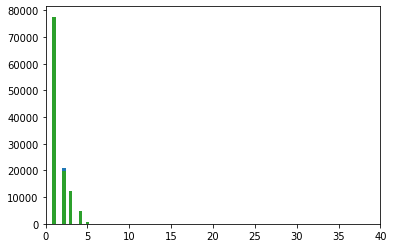

In [198]:
# ケースの対応率で8割いったらおわり
n1 = [1,5,25,125,1000,5000]
v = [1,2,3,4,5]
n2 = [1,5,25,125,1000,5000]
goal = 0.8 * bo
ans = {}
ans_num = 0
precision = 0
recall = 0
T = dt.timedelta(seconds=0.08)
for n1_threshold in n1:
    for v_threshold in v:
        for n2_threshold in n2:
            print(n1_threshold,v_threshold,n2_threshold,v)
            nt = t
            cor = {}
            inter = {}
            c_pattern = {}
            tmp = 0
            for i in range(20):
                nt, cor, inter, c_pattern = case_cor(nt,cor,inter,c_pattern,T,n1_threshold,v_threshold,n2_threshold)
                if tmp == len(nt):
                    break
                tmp = len(nt)
            correct_num = 0
            miss = 0
            for k, vv in cor.items():
                if k[:-2] != vv[:-2]:
                    miss+=1
                else:
                    correct_num+=1
            if correct_num+miss != 0:
                print("適合率(Precision)は",correct_num/(correct_num+miss))
                print("再現率(Recall)は",correct_num/(bo*2))
                print("\n")
            #対応づけられたケース数
            if abs((correct_num+miss)/2-goal) <  abs(ans_num-goal):
                ans_num = (correct_num+miss)/2
                ans = cor
                precision = correct_num/(correct_num+miss)
                recall = correct_num/(bo*2)
print(ans_num,ans,precision,recall)

In [73]:
t_list = [dt.timedelta(seconds=0.1),dt.timedelta(seconds=1),dt.timedelta(seconds=100),dt.timedelta(seconds=1000),dt.timedelta(seconds=10000),dt.timedelta(seconds=100000)]
# ケースの対応率で8割いったらおわり
# Tもファジーでやる
n1 = [0,1,10,100,1000,10000]
v = [0,1,2,4]
n2 = [0,1,10,100,1000,10000]

goal = 0.8 * bo
ans = {}
ans_num = 0
precision = 0
recall = 0
for n1_threshold in n1:
    for v_threshold in v:
        for n2_threshold in n2:
            for T in t_list:
                nt = t
                cor = {}
                inter = {}
                c_pattern = {}
                print(n1_threshold,v_threshold,n2_threshold,v,T)
                tmp = 0
                for i in range(20):
                    nt, cor, inter, c_pattern = case_cor(nt,cor,inter,c_pattern,T,n1_threshold,v_threshold,n2_threshold)
                    if tmp == len(nt):
                        print("おわり",i)
                        break
                    tmp = len(nt)
                correct_num = 0
                miss = 0
                for k, vv in cor.items():
                    if k[:-2] != vv[:-2]:
                        miss+=1
                    else:
                        correct_num+=1
                if correct_num+miss != 0:
                    print("適合率(Precision)は",correct_num/(correct_num+miss))
                    print("再現率(Recall)は",correct_num/(bo*2))
                    print("対応付け率は",(correct_num+miss)/(bo*2))
                    print("\n")
                #対応づけられたケース数
                if abs((correct_num+miss)/2-goal) <  abs(ans_num-goal):
                    ans_num = (correct_num+miss)/2
                    ans = cor
                    precision = correct_num/(correct_num+miss)
                    recall = correct_num/(bo*2)
print(ans_num,ans,precision,recall)

0 0 0 [0, 1, 2, 4] 0:00:00.100000
おわり 4
適合率(Precision)は 0.9904307751392178
再現率(Recall)は 0.9821638262083849
対応付け率は 0.9916531784569488


0 0 0 [0, 1, 2, 4] 0:00:01
おわり 4
適合率(Precision)は 0.9896603604468773
再現率(Recall)は 0.9811799803230823
対応付け率は 0.9914310197086547


0 0 0 [0, 1, 2, 4] 0:01:40
おわり 5
適合率(Precision)は 0.9861483467381591
再現率(Recall)は 0.980608714970326
対応付け率は 0.9943825573645625


0 0 0 [0, 1, 2, 4] 0:16:40
おわり 5
適合率(Precision)は 0.9841416425182308
再現率(Recall)は 0.9808308737186201
対応付け率は 0.9966358818115459


0 0 0 [0, 1, 2, 4] 2:46:40
おわり 8
適合率(Precision)は 0.9823579897644553
再現率(Recall)は 0.9807991367545781
対応付け率は 0.998413151797899


0 0 0 [0, 1, 2, 4] 1 day, 3:46:40
おわり 9
適合率(Precision)は 0.9815779443526871
再現率(Recall)は 0.9807991367545781
対応付け率は 0.9992065758989495


0 0 1 [0, 1, 2, 4] 0:00:00.100000
おわり 4
適合率(Precision)は 0.9904307751392178
再現率(Recall)は 0.9821638262083849
対応付け率は 0.9916531784569488


0 0 1 [0, 1, 2, 4] 0:00:01
おわり 4
適合率(Precision)は 0.9896603604468773
再現率(Recall)は 0.98

おわり 6
適合率(Precision)は 0.9838945827232797
再現率(Recall)は 0.9810530324669142
対応付け率は 0.9971119362721762


0 1 1000 [0, 1, 2, 4] 2:46:40
おわり 6
適合率(Precision)は 0.9828622301357668
再現率(Recall)は 0.9810530324669142
対応付け率は 0.9981592560855629


0 1 1000 [0, 1, 2, 4] 1 day, 3:46:40
おわり 8
適合率(Precision)は 0.9817384952520087
再現率(Recall)は 0.9810530324669142
対応付け率は 0.9993017867910756


0 1 10000 [0, 1, 2, 4] 0:00:00.100000
おわり 3
適合率(Precision)は 0.9907801645484522
再現率(Recall)は 0.982227300136469
対応付け率は 0.9913675457805706


0 1 10000 [0, 1, 2, 4] 0:00:01
おわり 3
適合率(Precision)は 0.9900720576461169
再現率(Recall)は 0.9811482433590403
対応付け率は 0.9909867022120664


0 1 10000 [0, 1, 2, 4] 0:01:40
おわり 5
適合率(Precision)は 0.9864351600651112
再現率(Recall)は 0.9808626106826621
対応付け率は 0.9943508204005205


0 1 10000 [0, 1, 2, 4] 0:16:40
おわり 6
適合率(Precision)は 0.9838945827232797
再現率(Recall)は 0.9810530324669142
対応付け率は 0.9971119362721762


0 1 10000 [0, 1, 2, 4] 2:46:40
おわり 6
適合率(Precision)は 0.9828622301357668
再現率(Recall)は 0.981053032

おわり 8
適合率(Precision)は 0.9914229021314729
再現率(Recall)は 0.9831476720936875
対応付け率は 0.9916531784569488


0 4 100 [0, 1, 2, 4] 0:00:01
おわり 10
適合率(Precision)は 0.983004016064257
再現率(Recall)は 0.971024151829636
対応付け率は 0.9878130058078645


0 4 100 [0, 1, 2, 4] 0:01:40
おわり 12
適合率(Precision)は 0.9781426011264721
再現率(Recall)は 0.9700403059443333
対応付け率は 0.9917166523850328


0 4 100 [0, 1, 2, 4] 0:16:40
おわり 11
適合率(Precision)は 0.9741211715587851
再現率(Recall)は 0.9700403059443333
対応付け率は 0.9958107207464534


0 4 100 [0, 1, 2, 4] 2:46:40
おわり 18
適合率(Precision)は 0.9721400629710906
再現率(Recall)は 0.9701037798724174
対応付け率は 0.9979053603732267


0 4 100 [0, 1, 2, 4] 1 day, 3:46:40
おわり 18
適合率(Precision)は 0.9711208539839878
再現率(Recall)は 0.9701037798724174
対応付け率は 0.9989526801866133


0 4 1000 [0, 1, 2, 4] 0:00:00.100000
おわり 7
適合率(Precision)は 0.9920340392859428
再現率(Recall)は 0.9841315179789901
対応付け率は 0.9920340220254531


0 4 1000 [0, 1, 2, 4] 0:00:01
おわり 7
適合率(Precision)は 0.9893262388614654
再現率(Recall)は 0.979561395156939

おわり 6
適合率(Precision)は 0.9841118222052408
再現率(Recall)は 0.9809260846107462
対応付け率は 0.996762829667714


1 1 1 [0, 1, 2, 4] 2:46:40
おわり 8
適合率(Precision)は 0.9822972285786931
再現率(Recall)は 0.9808943476467041
対応付け率は 0.9985718366181091


1 1 1 [0, 1, 2, 4] 1 day, 3:46:40
おわり 9
適合率(Precision)は 0.9816732308474145
再現率(Recall)は 0.9808943476467041
対応付け率は 0.9992065758989495


1 1 10 [0, 1, 2, 4] 0:00:00.100000
おわり 4
適合率(Precision)は 0.9904624739958393
再現率(Recall)は 0.9821638262083849
対応付け率は 0.9916214414929068


1 1 10 [0, 1, 2, 4] 0:00:01
おわり 4
適合率(Precision)は 0.9897233960814444
再現率(Recall)は 0.9811482433590403
対応付け率は 0.9913358088165286


1 1 10 [0, 1, 2, 4] 0:01:40
おわり 5
適合率(Precision)は 0.9862760117451806
再現率(Recall)は 0.980735662826494
対応付け率は 0.9943825573645625


1 1 10 [0, 1, 2, 4] 0:16:40
おわり 6
適合率(Precision)は 0.9841118222052408
再現率(Recall)は 0.9809260846107462
対応付け率は 0.996762829667714


1 1 10 [0, 1, 2, 4] 2:46:40
おわり 8
適合率(Precision)は 0.9822972285786931
再現率(Recall)は 0.9808943476467041
対応付け率は 0.998571

おわり 9
適合率(Precision)は 0.9881047805315977
再現率(Recall)は 0.9780697578469644
対応付け率は 0.9898441715065537


1 4 0 [0, 1, 2, 4] 0:00:01
おわり 11
適合率(Precision)は 0.9849660212847801
再現率(Recall)は 0.9751816941191406
対応付け率は 0.9900663302548478


1 4 0 [0, 1, 2, 4] 0:01:40
おわり 11
適合率(Precision)は 0.9813743969841219
再現率(Recall)は 0.9748960614427624
対応付け率は 0.9933987114792598


1 4 0 [0, 1, 2, 4] 0:16:40
おわり 12
適合率(Precision)は 0.9782504856223928
再現率(Recall)は 0.9749595353708465
対応付け率は 0.9966358818115459


1 4 0 [0, 1, 2, 4] 2:46:40
おわり 19
適合率(Precision)は 0.9767900292509221
再現率(Recall)は 0.9750230092989305
対応付け率は 0.9981909930496049


1 4 0 [0, 1, 2, 4] 1 day, 3:46:40
おわり 18
適合率(Precision)は 0.9760142326142898
再現率(Recall)は 0.9750230092989305
対応付け率は 0.9989844171506553


1 4 1 [0, 1, 2, 4] 0:00:00.100000
おわり 9
適合率(Precision)は 0.9881047805315977
再現率(Recall)は 0.9780697578469644
対応付け率は 0.9898441715065537


1 4 1 [0, 1, 2, 4] 0:00:01
おわり 11
適合率(Precision)は 0.9849660212847801
再現率(Recall)は 0.9751816941191406
対応付け率は 0.99

おわり 3
適合率(Precision)は 0.9885505948573622
再現率(Recall)は 0.9809895585388302
対応付け率は 0.9923513916658733


10 0 1000 [0, 1, 2, 4] 0:16:40
おわり 4
適合率(Precision)は 0.9874489013796628
再現率(Recall)は 0.9812751912152083
対応付け率は 0.9937478180837221


10 0 1000 [0, 1, 2, 4] 2:46:40
おわり 5
適合率(Precision)は 0.9855284967486931
再現率(Recall)は 0.9812434542511663
対応付け率は 0.9956520359262433


10 0 1000 [0, 1, 2, 4] 1 day, 3:46:40
おわり 6
適合率(Precision)は 0.98414820473644
再現率(Recall)は 0.9812434542511663
対応付け率は 0.9970484623440922


10 0 10000 [0, 1, 2, 4] 0:00:00.100000
おわり 2
適合率(Precision)は 0.9994279539820758
再現率(Recall)は 0.9980640451934368
対応付け率は 0.9986353105461931


10 0 10000 [0, 1, 2, 4] 0:00:01
おわり 3
適合率(Precision)は 0.9908468283940345
再現率(Recall)は 0.9825764067409312
対応付け率は 0.9916531784569488


10 0 10000 [0, 1, 2, 4] 0:01:40
おわり 3
適合率(Precision)は 0.9885505948573622
再現率(Recall)は 0.9809895585388302
対応付け率は 0.9923513916658733


10 0 10000 [0, 1, 2, 4] 0:16:40
おわり 4
適合率(Precision)は 0.9874489013796628
再現率(Recall)は 0.9812

おわり 8
適合率(Precision)は 0.9743459001242869
再現率(Recall)は 0.9703259386207116
対応付け率は 0.9958741946745374


10 2 10 [0, 1, 2, 4] 1 day, 3:46:40
おわり 8
適合率(Precision)は 0.9733222972112568
再現率(Recall)は 0.9703259386207116
対応付け率は 0.9969215144879241


10 2 100 [0, 1, 2, 4] 0:00:00.100000
おわり 3
適合率(Precision)は 0.9998729311604562
再現率(Recall)は 0.9989209432225713
対応付け率は 0.9990478910787394


10 2 100 [0, 1, 2, 4] 0:00:01
おわり 4
適合率(Precision)は 0.9871782512291526
再現率(Recall)は 0.9749595353708465
対応付け率は 0.9876225840236122


10 2 100 [0, 1, 2, 4] 0:01:40
おわり 7
適合率(Precision)は 0.9790690208667737
再現率(Recall)は 0.967913929353518
対応付け率は 0.9886064299089149


10 2 100 [0, 1, 2, 4] 0:16:40
おわり 7
適合率(Precision)は 0.9756908904810645
再現率(Recall)は 0.9681043511377702
対応付け率は 0.9922244438097052


10 2 100 [0, 1, 2, 4] 2:46:40
おわり 8
適合率(Precision)は 0.9726084183673469
再現率(Recall)は 0.9680091402456441
対応付け率は 0.9952711923577391


10 2 100 [0, 1, 2, 4] 1 day, 3:46:40
おわり 11
適合率(Precision)は 0.9710292572665626
再現率(Recall)は 0.9680091

おわり 1
適合率(Precision)は 1.0
再現率(Recall)は 0.9989844171506553
対応付け率は 0.9989844171506553


100 0 1 [0, 1, 2, 4] 0:00:01
おわり 2
適合率(Precision)は 0.9997456684151963
再現率(Recall)は 0.9980323082293948
対応付け率は 0.998286203941731


100 0 1 [0, 1, 2, 4] 0:01:40
おわり 5
適合率(Precision)は 0.9913026795421117
再現率(Recall)は 0.983909359230696
対応付け率は 0.9925418134501254


100 0 1 [0, 1, 2, 4] 0:16:40
おわり 5
適合率(Precision)は 0.9911764705882353
再現率(Recall)は 0.98397283315878
対応付け率は 0.9927322352343775


100 0 1 [0, 1, 2, 4] 2:46:40
おわり 5
適合率(Precision)は 0.9911764705882353
再現率(Recall)は 0.98397283315878
対応付け率は 0.9927322352343775


100 0 1 [0, 1, 2, 4] 1 day, 3:46:40
おわり 5
適合率(Precision)は 0.9911764705882353
再現率(Recall)は 0.98397283315878
対応付け率は 0.9927322352343775


100 0 10 [0, 1, 2, 4] 0:00:00.100000
おわり 1
適合率(Precision)は 1.0
再現率(Recall)は 0.9989844171506553
対応付け率は 0.9989844171506553


100 0 10 [0, 1, 2, 4] 0:00:01
おわり 2
適合率(Precision)は 0.9997456684151963
再現率(Recall)は 0.9980323082293948
対応付け率は 0.998286203941731


100 0 10 [0,

おわり 2
適合率(Precision)は 0.991714916349445
再現率(Recall)は 0.983909359230696
対応付け率は 0.9921292329175792


100 1 10000 [0, 1, 2, 4] 2:46:40
おわり 2
適合率(Precision)は 0.991714916349445
再現率(Recall)は 0.983909359230696
対応付け率は 0.9921292329175792


100 1 10000 [0, 1, 2, 4] 1 day, 3:46:40
おわり 2
適合率(Precision)は 0.991714916349445
再現率(Recall)は 0.983909359230696
対応付け率は 0.9921292329175792


100 2 0 [0, 1, 2, 4] 0:00:00.100000
おわり 3
適合率(Precision)は 0.9999682075411712
再現率(Recall)は 0.9982227300136469
対応付け率は 0.9982544669776889


100 2 0 [0, 1, 2, 4] 0:00:01
おわり 3
適合率(Precision)は 0.999808740556565
再現率(Recall)は 0.9954298771779492
対応付け率は 0.9956202989622013


100 2 0 [0, 1, 2, 4] 0:01:40
おわり 7
適合率(Precision)は 0.984874273419185
再現率(Recall)は 0.9733092132406614
対応付け率は 0.9882573233044527


100 2 0 [0, 1, 2, 4] 0:16:40
おわり 7
適合率(Precision)は 0.9843449249326318
再現率(Recall)は 0.9738170046653337
対応付け率は 0.9893046431178394


100 2 0 [0, 1, 2, 4] 2:46:40
おわり 7
適合率(Precision)は 0.9829574577139928
再現率(Recall)は 0.9738170046653337
対応付

おわり 8
適合率(Precision)は 0.9873933406043498
再現率(Recall)は 0.9768954901774096
対応付け率は 0.9893681170459234


100 4 1000 [0, 1, 2, 4] 0:00:00.100000
おわり 5
適合率(Precision)は 0.9999681112280366
再現率(Recall)は 0.995207718429655
対応付け率は 0.9952394553936971


100 4 1000 [0, 1, 2, 4] 0:00:01
おわり 5
適合率(Precision)は 0.9998725140234574
再現率(Recall)は 0.9956520359262433
対応付け率は 0.9957789837824114


100 4 1000 [0, 1, 2, 4] 0:01:40
おわり 4
適合率(Precision)は 0.991375717354365
再現率(Recall)は 0.9813704021073344
対応付け率は 0.9899076454346377


100 4 1000 [0, 1, 2, 4] 0:16:40
おわり 4
適合率(Precision)は 0.9912145697062973
再現率(Recall)は 0.9811165063949983
対応付け率は 0.9898124345425117


100 4 1000 [0, 1, 2, 4] 2:46:40
おわり 4
適合率(Precision)は 0.9911827888037449
再現率(Recall)は 0.9811165063949983
対応付け率は 0.9898441715065537


100 4 1000 [0, 1, 2, 4] 1 day, 3:46:40
おわり 4
適合率(Precision)は 0.9911827888037449
再現率(Recall)は 0.9811165063949983
対応付け率は 0.9898441715065537


100 4 10000 [0, 1, 2, 4] 0:00:00.100000
おわり 5
適合率(Precision)は 0.9999043214798278
再現率(Reca

おわり 4
適合率(Precision)は 0.992762520193861
再現率(Recall)は 0.9751499571550986
対応付け率は 0.982259037100511


1000 1 10 [0, 1, 2, 4] 0:16:40
おわり 4
適合率(Precision)は 0.9928807362986243
再現率(Recall)は 0.9826081437049732
対応付け率は 0.9896537497223016


1000 1 10 [0, 1, 2, 4] 2:46:40
おわり 4
適合率(Precision)は 0.9928807362986243
再現率(Recall)は 0.9826081437049732
対応付け率は 0.9896537497223016


1000 1 10 [0, 1, 2, 4] 1 day, 3:46:40
おわり 4
適合率(Precision)は 0.9928807362986243
再現率(Recall)は 0.9826081437049732
対応付け率は 0.9896537497223016


1000 1 100 [0, 1, 2, 4] 0:00:00.100000
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.975943381256149
対応付け率は 0.975943381256149


1000 1 100 [0, 1, 2, 4] 0:00:01
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.9779428099907963
対応付け率は 0.9779428099907963


1000 1 100 [0, 1, 2, 4] 0:01:40
おわり 3
適合率(Precision)は 0.9930793609727702
再現率(Recall)は 0.9745786918023421
対応付け率は 0.9813704021073344


1000 1 100 [0, 1, 2, 4] 0:16:40
おわり 3
適合率(Precision)は 0.9930397408345896
再現率(Recall)は 0.9825764067409312
対応付け率は 0.9894633279

おわり 10
適合率(Precision)は 0.992315853776163
再現率(Recall)は 0.9795296581928973
対応付け率は 0.98711479259894


1000 4 1 [0, 1, 2, 4] 0:00:00.100000
おわり 5
適合率(Precision)は 1.0
再現率(Recall)は 0.976038592148275
対応付け率は 0.976038592148275


1000 4 1 [0, 1, 2, 4] 0:00:01
おわり 5
適合率(Precision)は 1.0
再現率(Recall)は 0.9780062839188803
対応付け率は 0.9780062839188803


1000 4 1 [0, 1, 2, 4] 0:01:40
おわり 5
適合率(Precision)は 0.9934483653347171
再現率(Recall)は 0.9721032086070647
対応付け率は 0.9785140753435526


1000 4 1 [0, 1, 2, 4] 0:16:40
おわり 10
適合率(Precision)は 0.992315853776163
再現率(Recall)は 0.9795296581928973
対応付け率は 0.98711479259894


1000 4 1 [0, 1, 2, 4] 2:46:40
おわり 10
適合率(Precision)は 0.992315853776163
再現率(Recall)は 0.9795296581928973
対応付け率は 0.98711479259894


1000 4 1 [0, 1, 2, 4] 1 day, 3:46:40
おわり 10
適合率(Precision)は 0.992315853776163
再現率(Recall)は 0.9795296581928973
対応付け率は 0.98711479259894


1000 4 10 [0, 1, 2, 4] 0:00:00.100000
おわり 5
適合率(Precision)は 1.0
再現率(Recall)は 0.976038592148275
対応付け率は 0.976038592148275


1000 4 10 [0, 1, 

おわり 1
適合率(Precision)は 1.0
再現率(Recall)は 0.9936843441556381
対応付け率は 0.9936843441556381


10000 0 10000 [0, 1, 2, 4] 1 day, 3:46:40
おわり 1
適合率(Precision)は 1.0
再現率(Recall)は 0.9936843441556381
対応付け率は 0.9936843441556381


10000 1 0 [0, 1, 2, 4] 0:00:00.100000
おわり 4
適合率(Precision)は 0.9997418105534936
再現率(Recall)は 0.9831159351296455
対応付け率は 0.9833698308419817


10000 1 0 [0, 1, 2, 4] 0:00:01
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.8579770859119616
対応付け率は 0.8579770859119616


10000 1 0 [0, 1, 2, 4] 0:01:40
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.9353835412104478
対応付け率は 0.9353835412104478


10000 1 0 [0, 1, 2, 4] 0:16:40
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.9353835412104478
対応付け率は 0.9353835412104478


10000 1 0 [0, 1, 2, 4] 2:46:40
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.9353835412104478
対応付け率は 0.9353835412104478


10000 1 0 [0, 1, 2, 4] 1 day, 3:46:40
おわり 3
適合率(Precision)は 1.0
再現率(Recall)は 0.9353835412104478
対応付け率は 0.9353835412104478


10000 1 1 [0, 1, 2, 4] 0:00:00.100000
おわり 4
適合率(Precisi

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001FC11A02550> (for post_execute):


KeyboardInterrupt: 

In [36]:
len(cor)

10254

In [37]:
cor

{'173688_A': '173688_O',
 '173688_O': '173688_A',
 '173691_A': '173691_O',
 '173691_O': '173691_A',
 '173694_A': '173694_O',
 '173694_O': '173694_A',
 '173715_A': '173715_O',
 '173715_O': '173715_A',
 '173718_A': '173718_O',
 '173718_O': '173718_A',
 '173721_A': '173721_O',
 '173721_O': '173721_A',
 '173730_A': '173730_O',
 '173730_O': '173730_A',
 '173736_A': '173736_O',
 '173736_O': '173736_A',
 '173739_A': '173739_O',
 '173739_O': '173739_A',
 '173745_A': '173745_O',
 '173745_O': '173745_A',
 '173748_A': '173748_O',
 '173748_O': '173748_A',
 '173751_A': '173751_O',
 '173751_O': '173751_A',
 '173760_A': '173760_O',
 '173760_O': '173760_A',
 '173784_A': '173784_O',
 '173784_O': '173784_A',
 '173787_A': '173787_O',
 '173787_O': '173787_A',
 '173790_A': '173790_O',
 '173790_O': '173790_A',
 '173793_A': '173793_O',
 '173793_O': '173793_A',
 '173796_A': '173796_O',
 '173796_O': '173796_A',
 '173805_A': '173805_O',
 '173805_O': '173805_A',
 '173811_A': '173811_O',
 '173811_O': '173811_A',


In [ ]:
# すべてのタスクがでてきたらおわり
n1 = [10,100,500,1000,5000]
v = [1,2,3,4,5]
n2 = [10,100,500,1000,5000]
nt = t
cor = {}
inter = {}
c_pattern = {}
precision = 0
recall = 0
# すべてのタスク名を把握
task_all = set()
for i in t:
    task_all.add(i[1])

for n1_threshold in n1:
    for v_threshold in v:
        for n2_threshold in n2:
            print(n1_threshold,v_threshold,n2_threshold,v)
            tmp = 0
            for i in range(20):
                nt, cor, inter, c_pattern = case_cor(nt,cor,inter,c_pattern,T,n1_threshold,v_threshold,n2_threshold)
                if tmp == len(nt):
                    break
                tmp = len(nt)
            correct_num = 0
            miss = 0
            for k, vv in cor.items():
                if k[:-2] != vv[:-2]:
                    miss+=1
                else:
                    correct_num+=1
            if correct_num+miss != 0:
                print("適合率(Precision)は",correct_num/(correct_num+miss))
                print("再現率(Recall)は",correct_num/(31509*2))
                print("\n")
            #対応づけられたケース数
            # ここまだ途中
            if abs((correct_num+miss)/2-goal) <  abs(ans_num-goal):
                ans_num = (correct_num+miss)/2
                ans = cor
                precision = correct_num/(correct_num+miss)
                recall = correct_num/(31509*2)
print(ans_num,ans,precision,recall)

1回目
2回目
3回目
[  23.     23.     43.    578.5  1101.5  2074.55 3318.  ]
4回目
[1.000e+00 1.000e+00 4.400e+01 5.420e+02 8.860e+02 1.642e+03 4.289e+03]
5回目
[1.000e+00 1.000e+00 4.400e+01 5.420e+02 8.860e+02 1.642e+03 4.289e+03]
6回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
7回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
8回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
9回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
10回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
11回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
12回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
13回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
14回目
[1.0000e+00 1.1000e+00 2.9500e+01 6.6500e+02 8.4250e+02 1.6285e+03
 4.2890e+03]
15回目
[1.0000e+00 

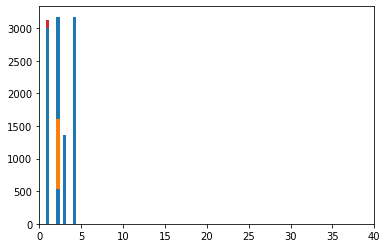

In [53]:
# ntは対応づけられなかったあまりのt, add_infoはケースを対応づけた配列
print("1回目")
#T = dt.timedelta(days=0, seconds=2.489, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
# 上位5%の閾値
#n1_threshold = 184
n2_threshold = 1000
# 上位95%の閾値
#n1_threshold = 1
#n2_threshold = 1
v1_threshold = 2
v2_threshold = 3
nt, cor, inter, c_pattern = case_cor(t,{},{},{},T,n1_threshold,v1_threshold,n2_threshold)



for i in range(20):
    print(f"{i+2}回目")
    T += T_delta
    n1_threshold -= n1_delta
    li = []
    for j in inter.values():
        li.append(j[1])
    if len(li) > 10:
        c_array = np.percentile(li, q=[0, 5, 25, 50, 75, 95, 100])
        print(c_array)
        n2_threshold = c_array[3]
    if i % 2 == 1:
        v1_threshold -= 1
        v2_threshold -= 1
    nt, cor, inter, c_pattern = case_cor(nt,cor,inter,c_pattern,T,n1_threshold,v1_threshold,n2_threshold)

In [55]:
correct_num = 0
miss = 0
for k, vv in cor.items():
    if k[:-2] != vv[:-2]:
         miss+=1
    else:
        correct_num+=1
if correct_num+miss != 0:
    print("適合率(Precision)は",correct_num/(correct_num+miss))
    print("再現率(Recall)は",correct_num/(bo*2))
    print("\n")

適合率(Precision)は 0.9977844914400805
再現率(Recall)は 0.378543592878429




In [56]:
nt

[[datetime.datetime(2011, 10, 1, 8, 11, 8, 866000),
  'A_SUBMITTED',
  '173697',
  '173697_A'],
 [datetime.datetime(2011, 10, 1, 8, 11, 9, 35000),
  'A_PARTLYSUBMITTED',
  '173697',
  '173697_A'],
 [datetime.datetime(2011, 10, 1, 8, 11, 46, 420000),
  'A_DECLINED',
  '173697',
  '173697_A'],
 [datetime.datetime(2011, 10, 1, 8, 15, 39, 894000),
  'A_SUBMITTED',
  '173700',
  '173700_A'],
 [datetime.datetime(2011, 10, 1, 8, 15, 40, 102000),
  'A_PARTLYSUBMITTED',
  '173700',
  '173700_A'],
 [datetime.datetime(2011, 10, 1, 8, 16, 21, 37000),
  'A_DECLINED',
  '173700',
  '173700_A'],
 [datetime.datetime(2011, 10, 1, 9, 45, 25, 806000),
  'A_SUBMITTED',
  '173703',
  '173703_A'],
 [datetime.datetime(2011, 10, 1, 9, 45, 25, 981000),
  'A_PARTLYSUBMITTED',
  '173703',
  '173703_A'],
 [datetime.datetime(2011, 10, 1, 9, 45, 37, 274000),
  'A_SUBMITTED',
  '173706',
  '173706_A'],
 [datetime.datetime(2011, 10, 1, 9, 45, 37, 363000),
  'A_PARTLYSUBMITTED',
  '173706',
  '173706_A'],
 [datetime.d

In [54]:
# step2でケース対応づけを終えてしまうパターン
def case_cor(t,add_info,cor,inter,T_threshold,n1_threshold,v1_threshold,n2_threshold,v2_threshold):
    # 指標1.1
    # T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
    T = T_threshold
    # 結合パターン
    pattern = {}
    ans1 = set()
    t1 =t[0][0]
    l = len(t)
    for i in range(1,l):
        t2 = t[i][0]
        if t2 - t1 < T:
            if (t[i-1][1],t[i][1]) in pattern:
                pattern [(t[i-1][1],t[i][1])] += 1
                if (pattern [(t[i-1][1],t[i][1])] > n1_threshold and t[i-1][1][0] != t[i][1][0]):
                    ans1.add((t[i-1][1],t[i][1]))
            else:
                pattern [(t[i-1][1],t[i][1])] = 1
        t1 = t2

    case1 = t[0][3]
    task1 = t[0][1]
    l = len(t)
    pattern = {}
    for i in range(1,l):
        case2 = t[i][3]
        task2 = t[i][1]
        # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
        # A->B，B->Aは出ないようになっている
        # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
        if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
            if (case1,case2) not in pattern:
                if (case2,case1) not in pattern:
                    pattern[(case1,case2)] = 1
                else:
                    pattern[(case2,case1)] += 1
            else:
                pattern[(case1,case2)] += 1
        case1 = case2
        task1 = task2


    # あるケースが複数ケースと結びつく場合を排除する工程(指標1.1の整理)
    # もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
    # つまり3回以上同じかも判定されたものの中で，
    # 同じかも判定された数の多い順に対応づけする．
    # liは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
    import copy
    import datetime
    for_sort = []
    
    #　指標1.1の整理
    import matplotlib.pyplot as plt
    m = 40
    plt.xlim(0,m)
    li = list(pattern.values())
    plt.hist(li, bins=100,range=(0,m))
    
    for k, v in pattern.items():
        if v > v1_threshold:
            # A -> Oの順番にする
            if k[0][-1] == 'O':
                for_sort.append([k[1],k[0],v])
            else:
                for_sort.append([k[0],k[1],v])
    for_sort.sort()

    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
                li.append(tmp)
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j
    for_sort = copy.deepcopy(li)
    for_sort.sort(key=lambda x: x[1])
    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][1] != for_sort[i+j][1]:
                li.append([tmp[0],tmp[1]])
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j

    for i in li:
        cor[i[0]] = i[1]
        cor[i[1]] = i[0]

    nt = []
    for i in range(len(t)):
        if t[i][3] not in cor:
            nt.append(t[i])

            

    # 評価
    # 全ケース数
    num = set()
    for i in t:
        num.add(i[2])
    a = len(num)
    print("残っているデータの全ケース数",a)

    # 対応づけられたケース数と誤って対応づけられたケース数
    correct_num = 0
    miss = 0
    for k, v in cor.items():
        if k[:-2] != v[:-2]:
            miss+=1
        else:
            correct_num+=1

    print("対応づけられたケース数は",correct_num+miss)
    print("誤って対応づけられたケース数は",miss)
    # 対応づけた中でのケースの正解率
    if correct_num+miss != 0:
        print("適合率(Precision)は",correct_num/(correct_num+miss))
        print("再現率(Recall)は",correct_num/(31509*2))
    print("\n")

    
    # 組織間を跨ぐ移動をしている部分のタスクのペアと時間差を抽出し，それをまだケースが対応づけられていない部分に適用してみる
    # dicはケース名がkey，（タスク,時刻)の流れがvalueの辞書
    dic = {}
    for i in t:
        if i[3] in cor:
            # もしケース名がdicに入っていなかったら
            if i[3] not in dic:
                if cor[i[3]] not in dic:
                    dic[i[3]] = [(i[1],i[0])]
                else:
                    dic[cor[i[3]]].append((i[1],i[0]))
            else:
                dic[i[3]].append((i[1],i[0]))
    
    # interはタスクのペアをkey,[時間差の配列, カウント]をvalueとした辞書
    for v in dic.values():
        pre = v[0]
        for i in range(1,len(v)):
            # もし異なる組織だったら(taskの名前の頭文字で判別)
            if pre[0][0] != v[i][0][0]:
                if (pre[0],v[i][0]) not in inter:
                    inter[(pre[0],v[i][0])] = [[v[i][1] - pre[1]],1]
                else:
                    inter[(pre[0],v[i][0])][0].append(v[i][1] - pre[1])
                    inter[(pre[0],v[i][0])][1] += 1
            pre = v[i]
    
    print("検出されたタスクペア数は",len(inter))
    f_inter = {}
    for k, v in inter.items():
        if v[1] > n2_threshold:
            f_inter[k] = v[0]
    print("閾値nによって絞られた後のタスクペア数は",len(f_inter))
    
    import statistics
    from scipy import stats
    task_time = {}
    for k, v in f_inter.items():
        li = [i.total_seconds() for i in v]
        # 分散によって閾値をかけます
        if statistics.variance(li) < 10**5:
        # if statistics.variance(li) < 10**50:
            t_dist = stats.t(loc=statistics.mean(li),scale=np.sqrt(statistics.variance(li)/10),df=len(li)-1)
            #alphaが求めたい区間に含まれる確率#alphaも閾値
            # 値を小さくすると条件が厳しくなる
            bottom, up = t_dist.interval(alpha=0.95)
            #print(bottom,up)
            task_time[k] = [statistics.mean(li),statistics.median(li),bottom,up]
    import bisect
    # bisectのために時間のみの配列を作る(始めてから何秒経ったか)
    for_bisect = []
    # 記録が取られ始めた時間
    start = datetime.datetime(2016, 1, 1, 9, 51, 15)
    for row in nt:
        for_bisect.append((row[0]-start).total_seconds())
    
    count = {}
    
    # ntの長さはO(10^5)くらい
    for i in range(len(nt)):
        # task_timeの長さはO(10^2)くらい
        for tasks, time in task_time.items():
            if nt[i][1] == tasks[0]:
                # time[2](時間差の中央値)後にtasks[1]が存在するかを調べる．計算量的にO(100)くらいの探索しかできない(全てでO(10^10~10^11)となる．)
                # (現在の時間+時間差)にあたる時間が何行目になるかを検索しなくてはならない．二分探索をするとO(log100000) = O(17)
                # 統計的に決定する．
                #index = bisect.bisect_left(for_bisect,(for_bisect[i]+time[1]-margin))
                index = bisect.bisect_left(for_bisect,(for_bisect[i]+max(0,time[2])))
                j = 1
                #while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[1]+margin:
                while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[3]:
                    if nt[i][3] == nt[index+j][3]:
                        break
                    if tasks[1] == nt[index+j][1]:
                        if (nt[i][3],nt[index+j][3]) not in count:
                            if (nt[index+j][3],nt[i][3]) not in count:
                                count[(nt[i][3],nt[index+j][3])] = 1
                            else:
                                count[(nt[index+j][3],nt[i][3])] += 1
                        else:
                            count[(nt[i][3],nt[index+j][3])] += 1
                    j += 1
    c_all = 0
    c = 0
    for k, v in count.items():
        if v > v2_threshold:
            c_all += 1
            if k[0][:-2] == k[1][:-2]:
                c += 1
    print("新たなケースの対応づけの個数,閾値v2を超えて対応づいた個数,その中であっていた個数",len(count),c_all,c)
    
    # とりあえずstep3で得られた情報をorで利用することを考える(andを取らずに素直にその情報のみから対応づける)
    
    # あるケースが複数ケースと結びつく場合を排除する工程
    # もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
    # つまり1回以上同じかも判定されたものの中で，
    # 同じかも判定された数の多い順に対応づけする．
    # liは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
    for_sort = []
    for k, v in count.items():
        if v > v2_threshold:
            # A -> Oの順番にする
            if k[0][-1] == 'O':
                for_sort.append([k[1],k[0],v])
            else:
                for_sort.append([k[0],k[1],v])
    for_sort.sort()
    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
                li.append(tmp)
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j
    for_sort = copy.deepcopy(li)
    for_sort.sort(key=lambda x: x[1])
    li = []
    i = 0
    while i < len(for_sort):
        j = 1
        tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][1] != for_sort[i+j][1]:
                li.append([tmp[0],tmp[1]])
                break
            else:
                if tmp[2] < for_sort[i+j][2]:
                    tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
                j += 1
        i += j
    
                
    #c = 0
    #for i in li:
    #    if i[0][:-2] != i[1][:-2]:
    #       c += 1
    #print(c)
    for i in li:
        cor[i[0]] = i[1]
        cor[i[1]] = i[0]

        
    # 評価
    # 対応づけられたケース数と誤って対応づけられたケース数
    correct_num = 0
    miss = 0
    for k, v in cor.items():
        if k[:-2] != v[:-2]:
            miss+=1
        else:
            correct_num+=1

    print("対応づけられたケース数は",correct_num+miss)
    print("誤って対応づけられたケース数は",miss)
    # 対応づけた中でのケースの正解率
    if correct_num+miss != 0:
        print("適合率(Precision)は",correct_num/(correct_num+miss))
        print("再現率(Recall)は",correct_num/(31509*2))
    print("\n")

    t = copy.deepcopy(nt)
    nt = []
    for i in range(len(t)):
        if t[i][3] not in cor:
            nt.append(t[i])
    return nt, count, cor, inter

In [ ]:
a = {}
b = {}
for k, v in cor.items():
    if k in a:
        print("前",k,v,a[k])
    else:
        a[k] = v
    if v in b:
        print("後",v,k,a[v])
    else:
        b[v] = k

In [22]:
T = dt.timedelta(days=0, seconds=0.5, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
n1_threshold = 184
v1_threshold = 2
n2_threshold = 4415
v2_threshold = 2
margin = 1
# cor = case_cor(t,[],{},{},T,n1_threshold,v1_threshold,n2_threshold,v2_threshold,margin)
# nt, add_info, cor, inter = case_cor(t,[],{},{},T,n1_threshold,v1_threshold,n2_threshold,v2_threshold,margin)

In [79]:
cor

([[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
   'A_Create Application',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
   'A_Submitted',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
   'A_Concept',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
   'A_Create Application',
   'Application_1691306052',
   'Application_1691306052_A'],
  [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
   'A_Submitted',
   'Application_1691306052',
   'Application_1691306052_A'],
  [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
   'A_Concept',
   'Application_1691306052',
   'Application_1691306052_A'],
  [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
   'A_Create Application',
   'Application_428409768',
   'Application_428409768_A'],
  [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
   

In [45]:
dic = {}
for i in pattern:
    if i[1] in dic:
        print(i)
    else:
        dic[i[1]] = i[0]

In [40]:
len(pattern)

4416

In [30]:
for i in pattern:
    print(i[0])

Application_196483749_O
Application_1120819670_O
Application_2012588584_O
Application_1691306052_O
Application_428409768_O
Application_652823628_O
Application_828200680_O
Application_1085880569_O
Application_493034835_O
Application_1059184025_O
Application_1266995739_O
Application_1878239836_O
Application_1294530310_O
Application_619403287_O
Application_387012864_O
Application_767475240_O
Application_857715587_O
Application_1547844908_O
Application_42838382_O
Application_180547487_O
Application_1017492916_O
Application_2055987002_O
Application_1710223761_O
Application_1966208034_O
Application_1660185664_O
Application_2082119944_O
Application_546206358_O
Application_1111870538_O
Application_1018615109_O
Application_1806387393_O
Application_1446096185_O
Application_914660918_O
Application_931862671_O
Application_1962860870_O
Application_1363980603_O
Application_1300843234_O
Application_1846626914_O
Application_1886382319_O
Application_2015287405_O
Application_675073178_O
Application_1999

Application_374502556_O
Application_2017867262_O
Application_160048129_O
Application_55766939_O
Application_77126964_O
Application_1916570871_O
Application_324324662_O
Application_634229442_O
Application_525355352_O
Application_2100396348_O
Application_488535591_O
Application_1008205514_O
Application_546890434_O
Application_98204416_O
Application_451341004_O
Application_1249541093_O
Application_1637539366_O
Application_847920548_O
Application_579574094_O
Application_1006214165_O
Application_294742387_O
Application_2030631255_O
Application_2082160_O
Application_1822774560_O
Application_1213605579_O
Application_431447847_O
Application_402680717_O
Application_1137139708_O
Application_855552533_O
Application_173674899_O
Application_92231513_O
Application_1438853077_O
Application_1008776960_O
Application_717836535_O
Application_253215176_O
Application_1634125268_O
Application_641879278_O
Application_861766653_O
Application_1022619955_O
Application_1908199131_O
Application_424654052_O
Applic

Application_1761650363_O
Application_1764491475_O
Application_1786310164_O
Application_2143984717_O
Application_1689022727_O
Application_1560438635_O
Application_1484183993_O
Application_593542788_O
Application_855823740_O
Application_710433184_O
Application_336221196_O
Application_1756103662_O
Application_93632616_O
Application_836222420_O
Application_1967101441_O
Application_1084806237_O
Application_1493252145_O
Application_752441949_O
Application_1920066439_O
Application_1195543683_O
Application_1329278647_O
Application_169871716_O
Application_981497061_O
Application_581391519_O
Application_465679964_O
Application_724059324_O
Application_1237464569_O
Application_770608182_O
Application_1338359850_O
Application_313469192_O
Application_1499063234_O
Application_68557738_O
Application_1924118035_O
Application_932535957_O
Application_954960816_O
Application_835017760_O
Application_350290729_O
Application_251643830_O
Application_1823706656_O
Application_1503552845_O
Application_1954964010

Application_1130351851_O
Application_1128773580_O
Application_1048973398_O
Application_513980010_O
Application_718673327_O
Application_644804836_O
Application_41371350_O
Application_1173370804_O
Application_1834592320_O
Application_2045735408_O
Application_1861619471_O
Application_1870154037_O
Application_1801676377_O
Application_652037555_O
Application_2139831844_O
Application_981780685_O
Application_1528046680_O
Application_1041940949_O
Application_1996816733_O
Application_351150613_O
Application_564583132_O
Application_1175565050_O
Application_2071061031_O
Application_1285076752_O
Application_204296489_O
Application_1781705604_O
Application_33391799_O
Application_1517140316_O
Application_546646755_O
Application_1753935724_O
Application_1566904286_O
Application_818552981_O
Application_2100776308_O
Application_1108318994_O
Application_1527486669_O
Application_1037167788_O
Application_1204634087_O
Application_718339009_O
Application_1437490603_O
Application_1324325208_O
Application_609

Application_917819529_O
Application_929698331_O
Application_1476271894_O
Application_682105044_O
Application_981497061_O
Application_599115989_O
Application_738515459_O
Application_362700369_O
Application_1653740686_A
Application_1653740686_O
Application_15123304_O
Application_674661607_O
Application_1437086146_O
Application_2124681738_O
Application_396564940_O
Application_920227653_O
Application_1469127552_O
Application_467970405_O
Application_866868145_O
Application_164118000_O
Application_1431658844_O
Application_658596017_O
Application_642295273_O
Application_619101799_O
Application_1793895675_O
Application_788777485_O
Application_600698358_O
Application_1554629006_O
Application_1213204029_O
Application_269910143_O
Application_542947971_O
Application_1093340674_O
Application_1842322303_O
Application_894777546_O
Application_1942341922_O
Application_2045034660_O
Application_5386947_O
Application_494381435_O
Application_213710034_A
Application_1388010863_O
Application_1447078181_O
App

Application_1117111914_O
Application_2094879627_O
Application_37016025_O
Application_981969053_O
Application_372480578_O
Application_1463737208_O
Application_1446779814_O
Application_479443453_O
Application_1734532187_O
Application_59724445_O
Application_1925105093_O
Application_649659347_O
Application_898423994_O
Application_413745976_O
Application_1496148225_O
Application_1308956644_O
Application_1732152740_O
Application_120420332_O
Application_1580050868_O
Application_1917076230_O
Application_1776792805_O
Application_1302697494_O
Application_1957882045_O
Application_1108619333_O
Application_1041376528_O
Application_1052886976_O
Application_1399314822_O
Application_49709352_O
Application_1733662751_O
Application_1631338431_O
Application_1084954796_O
Application_1501454963_O
Application_1956502441_O
Application_475801708_O
Application_1854738901_O
Application_1900152258_O
Application_644649298_O
Application_91245711_O
Application_1030054529_O
Application_991026124_O
Application_143047

Application_1364855059_O
Application_40264254_O
Application_202680930_O
Application_2025233353_O
Application_706002335_O
Application_1828725434_O
Application_226957054_O
Application_531674488_O
Application_1366259743_O
Application_350079960_O
Application_573052176_O
Application_1614934514_O
Application_52258481_O
Application_2058662276_O
Application_105366430_O
Application_274338517_O
Application_1849834109_O
Application_1249190112_O
Application_78867594_O
Application_1454134365_O
Application_1055557026_O
Application_1258109706_O
Application_1229987314_O
Application_1361630071_O
Application_2069444852_O
Application_1144565049_O
Application_298469665_O
Application_1586046404_O
Application_1305315187_O
Application_1457615368_O
Application_931073033_O
Application_1425530881_O
Application_1550035458_O
Application_984757556_O
Application_1750378228_O
Application_1403717247_O
Application_1679786747_O
Application_1267773007_O
Application_1471798812_O
Application_600117178_O
Application_181192

Application_827688187_O
Application_1081695790_O
Application_993664152_O
Application_324381591_O
Application_235219015_O
Application_652440873_O
Application_23155824_O
Application_630979281_O
Application_1829767138_A
Application_2115000513_O
Application_1121537718_O
Application_1019299562_O
Application_840645428_O
Application_625609493_O
Application_1971576090_O
Application_445088523_O
Application_1049972821_O
Application_875040064_O
Application_456849900_O
Application_1852369736_O
Application_1404502830_O
Application_1463003323_O
Application_1320728876_O
Application_1043767161_O
Application_185373096_O
Application_774349926_O
Application_1334709295_O
Application_1614742215_O
Application_1763935136_O
Application_119020510_O
Application_481060211_O
Application_774631722_O
Application_250840958_O
Application_1098933493_O
Application_314699807_O
Application_1439635944_O
Application_1057831861_O
Application_831530055_O
Application_428772540_O
Application_104403072_O
Application_120793083_O

Application_2093418706_O
Application_624868389_O
Application_48288644_O
Application_735304960_O
Application_1677934167_O
Application_997024654_O
Application_572065432_O
Application_1150495041_O
Application_353245935_O
Application_1782964647_O
Application_1586446217_O
Application_1376818993_O
Application_637769578_O
Application_1946062291_O
Application_436947678_O
Application_1681532443_O
Application_455370577_O
Application_1020070367_O
Application_1164206796_O
Application_2109617665_O
Application_251550683_O
Application_719534104_O
Application_1794932218_O
Application_326560085_O
Application_270274288_O
Application_1944829518_O
Application_1568847798_O
Application_1517745031_O
Application_1459565304_O
Application_324103267_O
Application_1331108450_O
Application_2023182441_O
Application_631926508_O
Application_1025923370_O
Application_1811798646_O
Application_1400486786_O
Application_121641518_O
Application_970274306_O
Application_1864387636_O
Application_1724949330_O
Application_260956

Application_1908753603_O
Application_415781818_O
Application_846440588_O
Application_151064414_O
Application_1325872188_O
Application_77398041_O
Application_1043132250_O
Application_1937509854_O
Application_1468170000_O
Application_382838608_O
Application_1174786597_O
Application_1370023835_O
Application_968161989_O
Application_1058627207_O
Application_282533941_O
Application_1899866776_O
Application_1710819136_O
Application_1199880952_O
Application_1266902462_O
Application_59225008_O
Application_2140721724_O
Application_1034141126_O
Application_290904207_O
Application_1135650035_O
Application_2093742439_O
Application_70614303_O
Application_785938822_O
Application_2135601106_O
Application_474961610_O
Application_1496048380_O
Application_667365074_O
Application_564819308_O
Application_677911120_O
Application_1932476894_O
Application_188078604_O
Application_52994701_O
Application_318734377_O
Application_1278220738_O
Application_102241622_O
Application_221956549_O
Application_1797569512_O

Application_1659132262_O
Application_1778253233_O
Application_1392744244_O
Application_2120648830_O
Application_1518691055_O
Application_117027249_O
Application_751800085_O
Application_136173194_O
Application_1691960420_O
Application_1823252929_O
Application_1816939541_O
Application_551250915_O
Application_489715983_O
Application_198353249_O
Application_1484280125_O
Application_157101926_O
Application_1603857838_O
Application_74910338_O
Application_495116903_O
Application_836064793_O
Application_1774753524_O
Application_1885207570_O
Application_2009636245_O
Application_1814870066_O
Application_2005290348_O
Application_695204111_O
Application_575581585_O
Application_423284802_O
Application_1504753021_O
Application_965947000_O
Application_662648071_O
Application_1743744101_O
Application_579446128_O
Application_1308123155_O
Application_964352700_O
Application_1057803878_O
Application_934763385_O
Application_1998761870_O
Application_1206679861_O
Application_35750569_O
Application_108903460

Application_1798954081_O
Application_101092690_O
Application_1683572643_O
Application_282538124_O
Application_1312732080_O
Application_1993856845_O
Application_731906334_O
Application_1814010387_O
Application_27646111_O
Application_912911968_O
Application_273628767_O
Application_1127559708_O
Application_334823612_O
Application_1737739204_O
Application_781494344_O
Application_1869001550_O
Application_2086620747_O
Application_936483069_O
Application_432841829_O
Application_1178291031_O
Application_967948352_O
Application_1788738350_O
Application_676076040_O
Application_1290822221_O
Application_923612441_O
Application_976570410_O
Application_841388025_O
Application_1818076283_O
Application_1226856369_O
Application_1081819343_O
Application_1695584545_O
Application_113948767_O
Application_1064248036_O
Application_1410088410_O
Application_1123248266_O
Application_876335402_O
Application_306805974_O
Application_1164410455_O
Application_1471467276_O
Application_39716600_O
Application_134805170

Application_582409896_O
Application_1736245154_O
Application_1564612353_O
Application_1847808252_O
Application_128360215_O
Application_1842906249_O
Application_1926820440_O
Application_507950555_O
Application_552075027_O
Application_1465474093_O
Application_1937469578_O
Application_140683416_O
Application_506553957_O
Application_51216654_O
Application_1370742295_O
Application_1529510108_O
Application_231581932_O
Application_415122614_O
Application_1823648369_A
Application_451950621_O
Application_1597050170_O
Application_1174733384_O
Application_404707668_O
Application_1755704465_O
Application_2019183781_O
Application_1009201632_O
Application_35066581_O
Application_1685957906_O
Application_891978500_O
Application_1174382778_O
Application_1110160976_O
Application_487839283_O
Application_820153219_O
Application_282421711_O
Application_1934417139_O
Application_1285779246_O
Application_728101227_O
Application_1994894811_O
Application_812403249_O
Application_2040030641_O
Application_13529166

Application_773553237_O
Application_1853350634_O
Application_416853962_O
Application_408343929_O
Application_369269683_O
Application_1919307867_O
Application_1050934351_O
Application_1807238376_O
Application_952362533_O
Application_2008338620_O
Application_349303437_O
Application_771141743_O
Application_1348987874_O
Application_305611931_O
Application_181366823_O
Application_697272539_O
Application_235629887_O
Application_65007766_O
Application_254148246_O
Application_1351208575_O
Application_312602744_O
Application_2004209779_O
Application_1356643803_O
Application_365402983_O
Application_1007507108_O
Application_613076876_O
Application_1388870329_O
Application_1494422836_O
Application_1316947459_O
Application_420452664_O
Application_1828676985_O
Application_694470809_O
Application_1716474301_O
Application_453710763_O
Application_1573931639_O
Application_1674083739_O
Application_1059019149_O
Application_1538808623_O
Application_1102152147_O
Application_1718350474_O
Application_11895757

Application_735273392_O
Application_176806452_O
Application_609612226_O
Application_1897098791_O
Application_1596747050_O
Application_968952074_O
Application_279779080_O
Application_966986386_O
Application_1002626536_O
Application_1098105077_O
Application_1163167598_O
Application_814787648_O
Application_586870495_O
Application_486168709_O
Application_669559167_O
Application_1128002102_O
Application_1629521011_O
Application_53382655_O
Application_965913780_O
Application_630118498_O
Application_2035231483_O
Application_333493166_O
Application_165847957_O
Application_701543959_O
Application_55827425_O
Application_1596300679_O
Application_18187902_O
Application_671712409_O
Application_1197050291_O
Application_563582279_O
Application_382045508_O
Application_605022772_O
Application_1784378860_O
Application_736148491_O
Application_556418503_O
Application_862658349_O
Application_433724101_O
Application_676862159_O
Application_836822281_O
Application_1590744995_O
Application_1104878281_O
Applic

KeyboardInterrupt: 

In [12]:
dic = {}
for k, v in cor.items():
    if v in dic:
        print(v,dic[v],k,"check")
    else:
        dic[v] = k
dic = {}
for k, v in cor.items():
    if k in dic:
        print(k,dic[k],v,"check")
    else:
        dic[k] = v

Application_427282452_O Application_1252179918_A Application_427282452_A check
Application_434150091_O Application_202743024_A Application_434150091_A check


In [5]:
def case_cor(t,add_info):
    # 指標1.1
    T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
    # 結合パターン
    pattern = {}
    ans1 = set()
    t1 =t[0][0]
    l = len(t)
    for i in range(1,l):
        t2 = t[i][0]
        if t2 - t1 < T:
            if (t[i-1][1],t[i][1]) in pattern:
                pattern [(t[i-1][1],t[i][1])] += 1
                if (pattern [(t[i-1][1],t[i][1])] > 30 and t[i-1][1][0] != t[i][1][0]):
                    ans1.add((t[i-1][1],t[i][1]))
            else:
                pattern [(t[i-1][1],t[i][1])] = 1
        t1 = t2

    case1 = t[0][3]
    task1 = t[0][1]
    l = len(t)
    pattern = {}
    for i in range(1,l):
        case2 = t[i][3]
        task2 = t[i][1]
        # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
        # A->B，B->Aは出ないようになっている
        # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
        if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
            if (case1,case2) not in pattern:
                if (case2,case1) not in pattern:
                    pattern[(case1,case2)] = 1
                else:
                    pattern[(case2,case1)] += 1
            else:
                pattern[(case1,case2)] += 1
        case1 = case2
        task1 = task2

    # 指標1.6
    # ケースの初めと終わりのみを見る
    # [ケース番号，初めの時刻，終わりの時刻]という配列を作る
    # 計算量しんどそう
    start = {}
    end = {}
    merged = []
    for i in t:
        if i[3] not in start:
            start[i[3]]  = i[0]
        end[i[3]] = i[0]
    c = 0
    for k, v in start.items():
        merged.append([k,v,end[k]])
    # (ケースの初めの時刻の差) ** 2 + (ケースの終わりの時刻の差)　** 2 を損失関数として最小化を図る
    # 計算量やばい
    inf = float("inf")
    ans2 = [[inf,-1,merged[i][0]] for i in range(len(merged))]
    for i in range(len(merged)):
        if i % 10000 == 0:
            print(i)
        for j in range(i+1,min(i+5000,len(merged))):
            tmp = int((merged[i][1] - merged[j][1]).total_seconds()) ** 2 + int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
            # tmp = int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
            if ans2[i][0] > tmp:
                ans2[i][0] = tmp
                ans2[i][1] = merged[j][0]
            if ans2[j][0] > tmp:
                ans2[j][0] = tmp
                ans2[j][1] = merged[i][0]

    # あるケースが複数ケースと結びつく場合を排除する工程
    # もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
    # つまり3回以上同じかも判定されたものの中で，
    # 同じかも判定された数の多い順に対応づけする．
    # corは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
    import copy
    import datetime
    for_sort = []
    #　指標1.1の整理
    for k, v in pattern.items():
        if v > 2:
            # A -> Oの順番にする
            if k[0][-1] == 'O':
                for_sort.append([k[1],k[0],v])
            else:
                for_sort.append([k[0],k[1],v])
    for_sort.sort()
    cor = []
    for i in range(len(for_sort)):
        j = 1
        tmp = [[for_sort[i][0],for_sort[i][1]],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
                cor.append(tmp[0])
                break
            else:
                if tmp[1] < for_sort[i+j][2]:
                    tmp = [[for_sort[i+j][0],for_sort[i+j][1]], for_sort[i+j][2]]
                j += 1
    original = copy.deepcopy(cor)

    #指標1.6の整理
    # このDは閾値
    D = 100000
    for_sort = []
    for i in ans2:
        if i[0] < D:
            # A -> Oの順番にする
            if i[1][-1] == 'O':
                for_sort.append([i[2],i[1],i[0]])
            else:
                for_sort.append([i[1],i[2],i[0]])
    for_sort.sort()
    cor = []
    for i in range(len(for_sort)):
        j = 1
        tmp = [[for_sort[i][0],for_sort[i][1]],for_sort[i][2]]
        while 1:
            if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
                cor.append(tmp[0])
                break
            else:
                if tmp[1] > for_sort[i+j][2]:
                    tmp = [[for_sort[i+j][0],for_sort[i+j][1]], for_sort[i+j][2]]
                j += 1
    original2 = copy.deepcopy(cor)


    one = {}
    cor = {}
    # andをとる
    for i in original:
        one[i[0]] = i[1]
    for i in original2:
        if i[0] in one and i[1] == one[i[0]]:
            cor[i[0]] = i[1]
            cor[i[1]] = i[0]

    nt = []
    for i in range(len(t)):
        if t[i][3] not in cor:
            nt.append(t[i])

    # 評価
    # 全ケース数
    num = set()
    for i in t:
        num.add(i[2])
    a = len(num)
    print(a)

    # 対応づけられたケース数と誤って対応づけられたケース数
    num = set()
    miss = set()
    for k, v in cor.items():
        if k[:-2] != v[:-2]:
            miss.add(v[:-2])
        else:
            num.add(v[:-2])
    b = len(num)
    print(b)
    c = len(miss)
    print(c)
    # 対応づけられたケースの割合と，対応づけた中でのケースの正解率
    print(b/a,(b-c)/b)

In [67]:
# 指標1.1
T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
# 結合パターン
pattern = {}
ans1 = set()
t1 =t[0][0]
l = len(t)
for i in range(1,l):
    t2 = t[i][0]
    if t2 - t1 < T:
        if (t[i-1][1],t[i][1]) in pattern:
            pattern [(t[i-1][1],t[i][1])] += 1
            if (pattern [(t[i-1][1],t[i][1])] > 30 and t[i-1][1][0] != t[i][1][0]):
                ans1.add((t[i-1][1],t[i][1]))
        else:
            pattern [(t[i-1][1],t[i][1])] = 1
    t1 = t2

case1 = t[0][3]
task1 = t[0][1]
l = len(t)
pattern = {}
for i in range(1,l):
    case2 = t[i][3]
    task2 = t[i][1]
    # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
    # A->B，B->Aは出ないようになっている
    # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
    if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
        if (case1,case2) not in pattern:
            if (case2,case1) not in pattern:
                pattern[(case1,case2)] = 1
            else:
                pattern[(case2,case1)] += 1
        else:
            pattern[(case1,case2)] += 1
    case1 = case2
    task1 = task2

# 指標1.6
# ケースの初めと終わりのみを見る
# [ケース番号，初めの時刻，終わりの時刻]という配列を作る
# 計算量しんどそう
start = {}
end = {}
merged = []
for i in t:
    if i[3] not in start:
        start[i[3]]  = i[0]
    end[i[3]] = i[0]
c = 0
for k, v in start.items():
    merged.append([k,v,end[k]])
# (ケースの初めの時刻の差) ** 2 + (ケースの終わりの時刻の差)　** 2 を損失関数として最小化を図る
# 計算量やばい
inf = float("inf")
ans2 = [[inf,-1,merged[i][0]] for i in range(len(merged))]
for i in range(len(merged)):
    if i % 10000 == 0:
        print(i)
    for j in range(i+1,min(i+5000,len(merged))):
        tmp = int((merged[i][1] - merged[j][1]).total_seconds()) ** 2 + int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
        # tmp = int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
        if ans2[i][0] > tmp:
            ans2[i][0] = tmp
            ans2[i][1] = merged[j][0]
        if ans2[j][0] > tmp:
            ans2[j][0] = tmp
            ans2[j][1] = merged[i][0]

# あるケースが複数ケースと結びつく場合を排除する工程
# もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
# つまり3回以上同じかも判定されたものの中で，
# 同じかも判定された数の多い順に対応づけする．
# corは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
import copy
for_sort = []
#　指標1.1の整理
for k, v in pattern.items():
    if v > 2:
        # A -> Oの順番にする
        if k[0][-1] == 'O':
            for_sort.append([k[1],k[0],v])
        else:
            for_sort.append([k[0],k[1],v])
for_sort.sort()
cor = []
for i in range(len(for_sort)):
    j = 1
    tmp = [[for_sort[i][0],for_sort[i][1]],for_sort[i][2]]
    while 1:
        if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
            cor.append(tmp[0])
            break
        else:
            if tmp[1] < for_sort[i+j][2]:
                tmp = [[for_sort[i+j][0],for_sort[i+j][1]], for_sort[i+j][2]]
            j += 1
original = copy.deepcopy(cor)

#指標1.6の整理
# このDは閾値
D = 100000
for_sort = []
for i in ans2:
    if i[0] < D:
        # A -> Oの順番にする
        if i[1][-1] == 'O':
            for_sort.append([i[2],i[1],i[0]])
        else:
            for_sort.append([i[1],i[2],i[0]])
for_sort.sort()
cor = []
for i in range(len(for_sort)):
    j = 1
    tmp = [[for_sort[i][0],for_sort[i][1]],for_sort[i][2]]
    while 1:
        if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
            cor.append(tmp[0])
            break
        else:
            if tmp[1] > for_sort[i+j][2]:
                tmp = [[for_sort[i+j][0],for_sort[i+j][1]], for_sort[i+j][2]]
            j += 1
original2 = copy.deepcopy(cor)


one = {}
cor = {}
# andをとる
for i in original:
    one[i[0]] = i[1]
for i in original2:
    if i[0] in one and i[1] == one[i[0]]:
        cor[i[0]] = i[1]
        cor[i[1]] = i[0]
    
nt = []
for i in range(len(t)):
    if t[i][3] not in cor:
        nt.append(t[i])

# 評価
# 全ケース数
num = set()
for i in t:
    num.add(i[2])
a = len(num)
print(a)

# 対応づけられたケース数と誤って対応づけられたケース数
num = set()
miss = set()
for k, v in cor.items():
    if k[:-2] != v[:-2]:
        miss.add(v[:-2])
    else:
        num.add(v[:-2])
b = len(num)
print(b)
c = len(miss)
print(c)
# 対応づけられたケースの割合と，対応づけた中でのケースの正解率
print(b/a,(b-c)/b)

閾値 0:00:01 だと混じらないペアの割合は 0.8362774918109499
0
10000
20000
30000
40000
50000
60000


In [61]:
    # 組織間を跨ぐ移動をしている部分のタスクのペアと時間差を抽出し，それをまだケースが対応づけられていない部分に適用してみる
    # dicはケース名がkey，（タスク,時刻)の流れがvalueの辞書
    dic = {}
    for i in t:
        if i[3] in cor:
            # もしケース名がdicに入っていなかったら
            if i[3] not in dic:
                if cor[i[3]] not in dic:
                    dic[i[3]] = [(i[1],i[0])]
                else:
                    dic[cor[i[3]]].append((i[1],i[0]))
            else:
                dic[i[3]].append((i[1],i[0]))
    
    # interはタスクのペアをkey,時間差の配列をvalueとした辞書
    inter = {}
    for v in dic.values():
        pre = v[0]
        for i in range(1,len(v)):
            # もし異なる組織だったら
            if pre[0][0] != v[i][0][0]:
                if (pre[0],v[i][0]) not in inter:
                    inter[(pre[0],v[i][0])] = [v[i][1] - pre[1]]
                else:
                    inter[(pre[0],v[i][0])].append(v[i][1] - pre[1])
            pre = v[i]
    
    import statistics
    task_time = {}
    for k, v in inter.items():
        li = [i.total_seconds() for i in v]
        task_time[k] = [statistics.mean(li),statistics.median(li)]
    import bisect
    # bisectのために時間のみの配列を作る(始めてから何秒経ったか)
    for_bisect = []
    # 記録が取られ始めた時間
    start = datetime.datetime(2016, 1, 1, 9, 51, 15)
    for row in nt:
        for_bisect.append((row[0]-start).total_seconds())
    
    count = {}
    
    # ntの長さはO(10^5)くらい
    for i in range(len(nt)):
        # task_timeの長さはO(10^2)くらい
        if i % 50000 == 0:
            print(i)
        for tasks, time in task_time.items():
            if nt[i][1] == tasks[0]:
                # time[2](時間差の中央値)後にtasks[1]が存在するかを調べる．計算量的にO(100)くらいの探索しかできない(全てでO(10^10~10^11)となる．)
                # (現在の時間+時間差)にあたる時間が何行目になるかを検索しなくてはならない．二分探索をするとO(log100000) = O(17)
                # 統計的に決定する．
                margin = 1000
                index = bisect.bisect_left(for_bisect,(for_bisect[i]+time[1]-margin))
                j = 1
                while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[1]+margin:
                    if tasks[1] == nt[index+j][1]:
                        if (nt[i][3],nt[index+j][3]) not in count:
                            if (nt[index+j][3],nt[i][3]) not in count:
                                count[(nt[i][3],nt[index+j][3])] = 1
                            else:
                                count[(nt[index+j][3],nt[i][3])] += 1
                        else:
                            count[(nt[i][3],nt[index+j][3])] += 1
                    j += 1

0.6141377757766772 2221 0.07048779713732585


In [62]:
cor

{'Application_1000339879_A': 'Application_1000339879_O',
 'Application_1000339879_O': 'Application_1000339879_A',
 'Application_1000386745_A': 'Application_1000386745_O',
 'Application_1000386745_O': 'Application_1000386745_A',
 'Application_1000557783_A': 'Application_1000557783_O',
 'Application_1000557783_O': 'Application_1000557783_A',
 'Application_1000610355_A': 'Application_1000610355_O',
 'Application_1000610355_O': 'Application_1000610355_A',
 'Application_1000671285_A': 'Application_1000671285_O',
 'Application_1000671285_O': 'Application_1000671285_A',
 'Application_1000806256_A': 'Application_1000806256_O',
 'Application_1000806256_O': 'Application_1000806256_A',
 'Application_1000856802_A': 'Application_1000856802_O',
 'Application_1000856802_O': 'Application_1000856802_A',
 'Application_1000867366_A': 'Application_1000867366_O',
 'Application_1000867366_O': 'Application_1000867366_A',
 'Application_1001114274_A': 'Application_1001114274_O',
 'Application_1001114274_O': 'A

# ここから下は二つの組織間でのもの

In [468]:
import pandas as pd
import numpy as np
import datetime as dt
df = pd.read_csv("edited_data/application_data.csv")
#df = pd.read_csv("edited_data/workflow_data.csv")
tmp = df["time:timestamp"].str.split('+').to_numpy()
time = []
t = []
# timeに時間を入れていく
for i in tmp:
    time.append(i[0])
# print(time[0])
event = df["concept:name"].to_numpy()
case = df["case:concept:name"]
for i in range(len(tmp)):
    t.append([dt.datetime.fromisoformat(time[i].replace(' ','T')), event[i],case[i]])

In [469]:
# 組織Aのケース数
num = set()
for i in t:
    num.add(i[2])
print(len(num))

31509


In [470]:
print(len(t))

239595


In [471]:
df = pd.read_csv("edited_data/offer_data.csv")
#df = pd.read_csv("edited_data/workflow_data.csv")
tmp = df["time:timestamp"].str.split('+').to_numpy()
time = []
# timeに時間を入れていく
for i in tmp:
    time.append(i[0])
# print(time[0])
event = df["concept:name"].to_numpy()
case = df["case:concept:name"]
num = set()
# print(num)
for i in range(len(tmp)):
    num.add(case[i])
    t.append([dt.datetime.fromisoformat(time[i].replace(' ','T')), event[i],case[i]])

In [472]:
# 組織Oのケース数
print(len(num))

31509


In [473]:
print((len(t)))

433444


In [474]:
t.sort()

In [30]:
for i in range(1000):
    print(t[i])

[datetime.datetime(2016, 1, 1, 9, 51, 15, 774000), 'W_Handle leads', 'Application_652823628']
[datetime.datetime(2016, 1, 1, 9, 52, 36, 392000), 'W_Handle leads', 'Application_652823628']
[datetime.datetime(2016, 1, 1, 9, 52, 36, 403000), 'W_Complete application', 'Application_652823628']
[datetime.datetime(2016, 1, 1, 10, 16, 11, 740000), 'W_Handle leads', 'Application_1691306052']
[datetime.datetime(2016, 1, 1, 10, 17, 31, 573000), 'W_Handle leads', 'Application_1691306052']
[datetime.datetime(2016, 1, 1, 10, 17, 31, 584000), 'W_Complete application', 'Application_1691306052']
[datetime.datetime(2016, 1, 1, 11, 19, 38, 914000), 'W_Handle leads', 'Application_428409768']
[datetime.datetime(2016, 1, 1, 11, 20, 37, 391000), 'W_Handle leads', 'Application_428409768']
[datetime.datetime(2016, 1, 1, 11, 20, 37, 409000), 'W_Complete application', 'Application_428409768']
[datetime.datetime(2016, 1, 1, 12, 34, 54, 320000), 'W_Handle leads', 'Application_1746793196']
[datetime.datetime(2016, 

In [18]:
# 特定のケースの取り出し用コード
for i in t:
    if i[2] == 'Application_486645986':
        print(i)

[datetime.datetime(2016, 1, 2, 18, 36, 32, 396000), 'A_Create Application', 'Application_486645986', 'Application_486645986_A']
[datetime.datetime(2016, 1, 2, 18, 36, 32, 427000), 'A_Submitted', 'Application_486645986', 'Application_486645986_A']
[datetime.datetime(2016, 1, 2, 18, 37, 33, 182000), 'A_Concept', 'Application_486645986', 'Application_486645986_A']
[datetime.datetime(2016, 1, 4, 14, 58, 38, 198000), 'A_Accepted', 'Application_486645986', 'Application_486645986_A']
[datetime.datetime(2016, 1, 4, 15, 0, 12, 541000), 'O_Create Offer', 'Application_486645986', 'Application_486645986_O']
[datetime.datetime(2016, 1, 4, 15, 0, 14, 93000), 'O_Created', 'Application_486645986', 'Application_486645986_O']
[datetime.datetime(2016, 1, 4, 15, 1, 10, 366000), 'O_Sent (mail and online)', 'Application_486645986', 'Application_486645986_O']
[datetime.datetime(2016, 1, 4, 15, 1, 10, 392000), 'A_Complete', 'Application_486645986', 'Application_486645986_A']
[datetime.datetime(2016, 1, 13, 14

In [64]:
# 時間当たりのタスクの発生数を見る
import matplotlib.pyplot as plt
li = [0] * 400
for i in t:
    li[(i[0].month - 1) * 31 + i[0].day] += 1

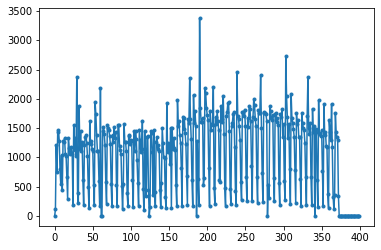

In [68]:
plt.plot(li,marker='.')
# 433030 / (14 * 30) = 1031

# 以下の指標1.1,1.2での閾値を決定する方法について検討する

In [31]:
# 閾値Tを(閾値T以内でおこる項で他のケースが入り混じっていないペアの数)/(閾値T以内でおこる項のペア数)が95%以上となるように設定すれば良い
T = dt.timedelta(days=0, seconds=0.3, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
t1 =t[0][0]
c = 0
c_all = 0
for i in range(1,len(t)):
    # 組織Aの時のみ考える
    if t[i][1][0] == 'O':
        t2 = t[i][0]
        if t2 - t1 < T:
            c_all += 1
            if t[i][2] == t[i-1][2]:
                c += 1
    t1 = t2
print(c/c_all,c,c_all)

0.9657048516003152 25737 26651


In [66]:
# 閾値Tを(閾値T以内でおこる項で他のケースが入り混じっていないペアの数)/(閾値T以内でおこる項のペア数)が95%以上となるように設定すれば良い
# 組織A,Oの両方においてやってみた場合(正解データを用いているため，実際には使えないことに注意，あくまで目安)
T = dt.timedelta(days=0, seconds=0.3, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
t1 =t[0][0]
c = 0
c_all = 0
for i in range(1,len(t)):
    t2 = t[i][0]
    if t2 - t1 < T:
        c_all += 1
        if t[i][2] == t[i-1][2]:
            c += 1
    t1 = t2
print(c/c_all,c,c_all)

0.9728553507671523 100817 103630


# 様々な指標でタスク間の繋がりを発見する(手順1-1)

In [475]:
T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
# 結合パターン
pattern = {}
ans1 = set()

t1 =t[0][0]
delta = []
l = len(t)
for i in range(1,l):
    t2 = t[i][0]
    #print(t1,t2)
    delta.append(t2-t1)
    if t2 - t1 < T:
        if t2 < t1:
            print("miss")
        # 辞書のキーにリストは使えないがタプルは使えるらしい
        # 組織横断だけのペアの統計もとるべき
        # 全体のケース(タスク)数も出してパーセンテージで表示する
        # 出せる値はできるだけ出しておく
        if (t[i-1][1],t[i][1]) in pattern:
            pattern [(t[i-1][1],t[i][1])] += 1
            if (pattern [(t[i-1][1],t[i][1])] > 30 and t[i-1][1][0] != t[i][1][0]):
                ans1.add((t[i-1][1],t[i][1]))
        else:
            pattern [(t[i-1][1],t[i][1])] = 1
    t1 = t2

In [68]:
import matplotlib.pyplot as plt
# fig = plt.figure()
li = [i.total_seconds() for i in delta]
c_array = np.percentile(li, q=[0, 5, 25,40, 50, 75, 95, 100])
print(c_array)

[0.0000000e+00 8.0000000e-03 5.3200000e-01 2.4890000e+00 9.1160000e+00
 4.1137000e+01 1.7490220e+02 8.6379043e+04]


[0.334,
 53.026,
 26960.35,
 3.939,
 54.453,
 33.639,
 0.304,
 38.275,
 0.169,
 3.991,
 33.394,
 233.474,
 0.208,
 40.935,
 5344.769,
 0.175,
 11.293,
 0.089,
 40.848,
 684.783,
 0.188,
 43.856,
 3.495,
 0.145,
 39.823,
 0.288,
 31.915,
 642.033,
 384.219,
 1250.407,
 0.294,
 41.31,
 241.01,
 138.748,
 0.0,
 1.982,
 0.027,
 130.181,
 0.0,
 1.295,
 0.023,
 1240.046,
 0.649,
 42.165,
 619.225,
 131.287,
 0.0,
 1.421,
 0.032,
 1314.25,
 145.935,
 0.0,
 1.954,
 0.183,
 422.925,
 0.271,
 992.087,
 0.14,
 43.559,
 683.699,
 218.726,
 347.769,
 0.0,
 1.224,
 0.026,
 347.137,
 0.264,
 50.058,
 154.772,
 0.093,
 1344.683,
 0.239,
 12.016,
 33.189,
 614.406,
 0.202,
 43.256,
 1830.506,
 0.169,
 1443.498,
 0.19,
 59.604,
 0.219,
 323.135,
 0.256,
 41.429,
 1113.487,
 111.402,
 0.0,
 1.472,
 0.095,
 862.18,
 1.321,
 40.176,
 241.777,
 88.263,
 217.257,
 180.078,
 0.202,
 37.386,
 701.231,
 0.331,
 39.3,
 329.131,
 170.567,
 709.589,
 241.882,
 0.001,
 1.731,
 0.026,
 841.626,
 82.317,
 60.742,
 4.

(0.0, 100000.0)

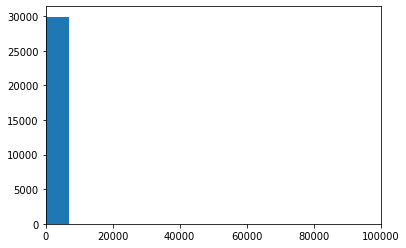

In [11]:
test = li[:30000]
test2 = []
for i in test:
    if i < 100000:
        test2.append(i)
import matplotlib.pyplot as plt
plt.hist(test2, bins=5)
plt.xlim(0,100000)

In [16]:
pattern

{('A_Create Application', 'A_Submitted'): 16735,
 ('A_Create Application', 'A_Concept'): 11082,
 ('O_Sent (online only)', 'A_Complete'): 449,
 ('O_Sent (mail and online)', 'A_Complete'): 30857,
 ('O_Sent (mail and online)', 'O_Sent (mail and online)'): 3143,
 ('A_Complete', 'O_Create Offer'): 111,
 ('O_Create Offer', 'O_Sent (mail and online)'): 110,
 ('A_Complete', 'O_Created'): 90,
 ('A_Accepted', 'A_Accepted'): 92,
 ('A_Submitted', 'O_Create Offer'): 51,
 ('A_Accepted', 'A_Concept'): 47,
 ('O_Create Offer', 'A_Accepted'): 91,
 ('O_Created', 'A_Accepted'): 94,
 ('O_Created', 'A_Create Application'): 81,
 ('O_Create Offer', 'A_Concept'): 39,
 ('A_Concept', 'O_Created'): 51,
 ('O_Created', 'A_Concept'): 42,
 ('A_Accepted', 'O_Create Offer'): 120,
 ('A_Complete', 'A_Concept'): 32,
 ('A_Accepted', 'O_Sent (mail and online)'): 113,
 ('A_Concept', 'O_Create Offer'): 100,
 ('A_Submitted', 'A_Accepted'): 24,
 ('A_Cancelled', 'O_Cancelled'): 10255,
 ('O_Create Offer', 'O_Sent (online only)'):

In [170]:
# print(pattern)
for k, v in pattern.items():
    if v > 300:
        # タスクのペア，出現回数，出現頻度(出現回数/全ケース数)
        # 組織Aと組織Oにおいてはともに31509
        print(k,v,v/len(num))

('A_Create Application', 'A_Submitted') 20309 0.6445460027293789
('A_Submitted', 'A_Concept') 10247 0.32520867053857627
('A_Concept', 'A_Create Application') 8189 0.25989399854009965
('A_Submitted', 'A_Create Application') 2306 0.07318543908089752
('A_Concept', 'A_Concept') 1882 0.05972896632708115
('A_Create Application', 'A_Concept') 11086 0.35183598336983085
('A_Concept', 'A_Accepted') 5038 0.15989082484369546
('A_Accepted', 'O_Create Offer') 9567 0.30362753499000283
('O_Create Offer', 'O_Created') 41961 1.3317147481671903
('O_Created', 'O_Sent (online only)') 1276 0.040496366117617186
('O_Sent (online only)', 'A_Complete') 449 0.014249896854866863
('A_Complete', 'O_Cancelled') 307 0.009743247960900061
('O_Cancelled', 'O_Create Offer') 1348 0.04278142752864261
('O_Created', 'O_Sent (mail and online)') 21504 0.6824716747595925
('O_Sent (mail and online)', 'A_Create Application') 706 0.022406296613665937
('A_Concept', 'O_Create Offer') 4368 0.13862705893554222
('O_Sent (mail and onlin

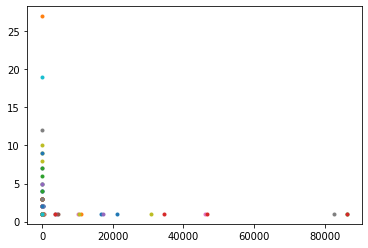

In [27]:
# ansの閾値を決定するためのpatternの分布
# 横軸が出現回数，縦軸がその出現回数のセットが何個あったか
import matplotlib.pyplot as plt
dic = {}
for i in pattern.values():
    if i not in dic:
        dic[i] = 1
    else:
        dic[i] += 1
for k,v in dic.items():
    plt.plot(k,v,marker='.')

[1.0000e+00 1.0000e+00 1.1000e+01 7.0000e+01 3.3725e+02 4.4780e+02
 7.6060e+02 1.5826e+03 4.1960e+04]


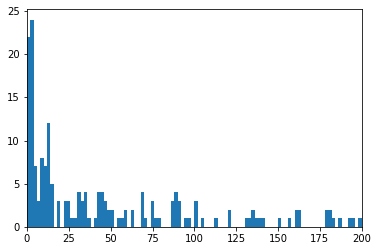

In [15]:
import matplotlib.pyplot as plt
m = 200
plt.xlim(0,m)
li = list(pattern.values())
plt.hist(li, bins=100,range=(0,m))
c_array = np.percentile(li, q=[0, 5, 25, 50, 75, 80, 90,95,100])
print(c_array)

(array([2., 0., 0., 0., 0., 1., 0., 0., 0., 1.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

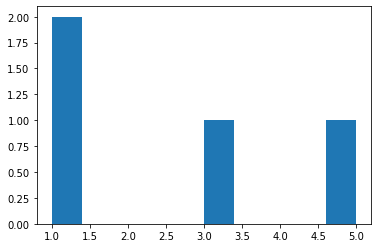

In [10]:
pattern

{('A_Create Application', 'A_Submitted'): 20306,
 ('A_Submitted', 'A_Create Application'): 240,
 ('A_Create Application', 'A_Concept'): 11086,
 ('O_Create Offer', 'O_Created'): 41960,
 ('O_Sent (online only)', 'A_Complete'): 449,
 ('O_Sent (mail and online)', 'A_Create Application'): 76,
 ('O_Sent (mail and online)', 'A_Complete'): 30862,
 ('O_Sent (mail and online)', 'O_Sent (mail and online)'): 3342,
 ('O_Created', 'A_Accepted'): 930,
 ('O_Sent (mail and online)', 'O_Cancelled'): 88,
 ('A_Accepted', 'A_Create Application'): 527,
 ('A_Concept', 'O_Create Offer'): 707,
 ('O_Created', 'O_Cancelled'): 156,
 ('A_Complete', 'O_Sent (mail and online)'): 775,
 ('A_Concept', 'A_Create Application'): 488,
 ('A_Concept', 'A_Accepted'): 546,
 ('O_Created', 'O_Create Offer'): 1374,
 ('A_Complete', 'O_Create Offer'): 957,
 ('O_Created', 'A_Concept'): 399,
 ('A_Complete', 'A_Accepted'): 694,
 ('A_Submitted', 'O_Create Offer'): 405,
 ('A_Accepted', 'O_Sent (mail and online)'): 766,
 ('A_Accepted', '

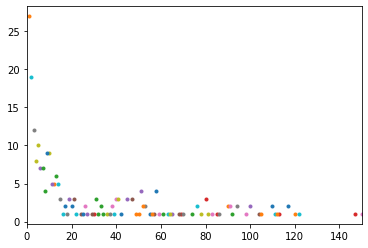

In [28]:
plt.xlim(0,150)
for k,v in dic.items():
    plt.plot(k,v,marker='.')

[0.0, 0.5030378461189978, 0.591811881272522, 0.6377443094425926, 0.742918694840472, 0.9474694358216189, 0.9953345405965601, 0.9994580711473425, 1.0]
[0, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]


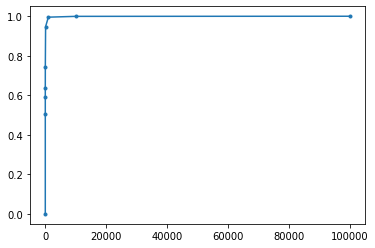

In [61]:
# 隣り合っているタスクの時間差の分布
T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
t1 =t[0][0]
l = len(t)
# timeは ~0.01の個数，~0.1の個数，...というように対数っぽく~10000, 10000~まで．
time = [0, 0, 0, 0, 0, 0, 0, 0, 0]
for i in range(1,l):
    t2 = t[i][0]
    delta = t2 - t1
    tmp = 0.01
    c = 0
    while tmp * (10 ** c) < delta.total_seconds():
        c += 1
    for j in range(c+1,9):
        time[j] += 1   
    t1 = t2
x = [0, 0.01,0.1,1,10,100,1000,10000,100000]
time_per = []
for i in time:
    time_per.append(i/time[8])
plt.plot(x,time_per,marker='.')
print(time_per)
print(x)

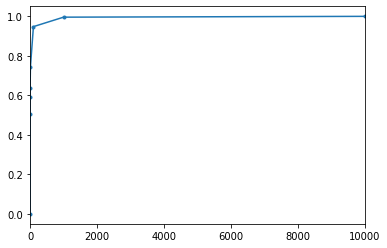

In [63]:
# 1時間が3600
# 1日が86400
plt.xlim(0,10000)
plt.plot(x,time_per,marker='.')

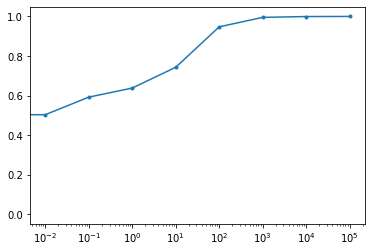

In [64]:
plt.xscale("log")
plt.plot(x,time_per,marker='.')

In [58]:
print(ans1)

{('O_Cancelled', 'O_Cancelled'), ('O_Sent (online only)', 'A_Complete'), ('O_Create Offer', 'O_Sent (mail and online)'), ('A_Validating', 'A_Validating'), ('A_Pending', 'O_Cancelled'), ('A_Accepted', 'O_Create Offer'), ('O_Sent (mail and online)', 'A_Complete'), ('A_Accepted', 'O_Sent (mail and online)'), ('A_Complete', 'O_Create Offer'), ('O_Create Offer', 'O_Create Offer'), ('O_Refused', 'O_Refused'), ('O_Created', 'O_Created'), ('O_Created', 'O_Sent (mail and online)'), ('A_Validating', 'O_Created'), ('A_Cancelled', 'O_Cancelled'), ('A_Denied', 'O_Refused'), ('O_Cancelled', 'A_Cancelled'), ('O_Created', 'A_Validating'), ('A_Create Application', 'A_Submitted'), ('O_Created', 'O_Create Offer'), ('O_Create Offer', 'O_Created'), ('A_Validating', 'O_Create Offer'), ('A_Validating', 'O_Returned'), ('O_Accepted', 'A_Pending'), ('A_Accepted', 'O_Created'), ('A_Validating', 'O_Sent (mail and online)'), ('A_Create Application', 'A_Concept'), ('A_Validating', 'A_Incomplete'), ('O_Create Offer'

In [63]:
# 順序関係を単純に羅列して頻度の多い順に並べる

# 結合パターン
pattern = {}
ans2 = set()

l = len(t)
former = t[0][1]
for i in range(1,l):
    latter = t[i][1]
    if (former,latter) in pattern:
            pattern [(former, latter)] += 1
            # 根拠を持って閾値を決める
            # 〇〇分布のような統計的な根拠，関連研究やそのドメインの慣習などから根拠を持ってくる
            # ポアソン分布
            # ワークフローの関連研究などから根拠を持って来れた方が良い
            
            # 閾値ごとに分けて重みづけをすると良いかもしれない
            # この問題を閾値をどうするかの問題に帰着させると良い
            if (pattern [(former,latter)] > 100):
                ans2.add((former,latter))
    else:
        pattern [(former, latter)] = 1
    former = latter

In [17]:
print(ans2)

{('O_Returned', 'O_Returned'), ('O_Sent (mail and online)', 'O_Returned'), ('A_Incomplete', 'A_Accepted'), ('A_Complete', 'O_Create Offer'), ('O_Sent (online only)', 'A_Incomplete'), ('A_Accepted', 'A_Concept'), ('A_Submitted', 'O_Accepted'), ('A_Incomplete', 'O_Sent (mail and online)'), ('A_Validating', 'A_Accepted'), ('A_Incomplete', 'O_Returned'), ('A_Incomplete', 'A_Validating'), ('A_Pending', 'A_Incomplete'), ('O_Sent (online only)', 'A_Validating'), ('O_Created', 'A_Accepted'), ('O_Returned', 'O_Create Offer'), ('O_Returned', 'A_Validating'), ('A_Incomplete', 'A_Incomplete'), ('A_Validating', 'A_Cancelled'), ('A_Pending', 'A_Validating'), ('A_Pending', 'O_Returned'), ('O_Cancelled', 'A_Cancelled'), ('A_Pending', 'O_Sent (mail and online)'), ('A_Concept', 'A_Accepted'), ('A_Complete', 'O_Created'), ('O_Refused', 'O_Create Offer'), ('A_Concept', 'A_Denied'), ('A_Complete', 'A_Create Application'), ('O_Returned', 'A_Concept'), ('A_Pending', 'A_Accepted'), ('A_Validating', 'O_Create 

In [18]:
def extract_another(n):
    ex = set()
    for i in n:
        if i[0][0] != i[1][0]:
            ex.add(i)
    print(ex)
extract_another(ans1)
extract_another(ans2)

{('O_Cancelled', 'A_Cancelled'), ('O_Sent (online only)', 'A_Complete'), ('O_Created', 'A_Validating'), ('A_Complete', 'O_Create Offer'), ('A_Accepted', 'O_Created'), ('A_Cancelled', 'O_Cancelled'), ('A_Validating', 'O_Returned'), ('A_Validating', 'O_Created'), ('O_Sent (mail and online)', 'A_Complete'), ('O_Accepted', 'A_Pending'), ('A_Accepted', 'O_Create Offer'), ('O_Create Offer', 'A_Validating'), ('A_Validating', 'O_Create Offer'), ('A_Validating', 'O_Sent (mail and online)'), ('A_Accepted', 'O_Sent (mail and online)'), ('A_Pending', 'O_Cancelled'), ('A_Denied', 'O_Refused')}
{('A_Complete', 'O_Create Offer'), ('O_Sent (online only)', 'A_Incomplete'), ('A_Submitted', 'O_Accepted'), ('A_Incomplete', 'O_Sent (mail and online)'), ('A_Incomplete', 'O_Returned'), ('O_Sent (online only)', 'A_Validating'), ('O_Created', 'A_Accepted'), ('O_Returned', 'A_Validating'), ('A_Pending', 'O_Returned'), ('O_Cancelled', 'A_Cancelled'), ('A_Pending', 'O_Sent (mail and online)'), ('A_Complete', 'O_C

In [64]:
# WAAWやAWAのように組織間の移る地点をセットとして考えてみてアルゴリズムを作ってみる
# 'W_Call after offers', 'A_Complete'，'W_Validate application', 'A_Validating'
# W->A

# 結合パターン
pattern = {}
ans4 = set()

#l = len(t)
l = 30000
flow = [t[0][1]]
first = t[0][1][0]
first_num = 1
second = 0
for i in range(1,l):
    cur_state = t[i][1]
    flow.append(cur_state)
    first_num += 1
    #異なる組織のワークだったら
    # secondが設定された後
    if second != cur_state[0] and second != 0:
        j = 0
        # flowの中で前の部分を削除するためにindexを取得
        for j in range(len(flow)):
            flag = 0
            if first != flow[j][0] and j != 0:
                j -= 1
                break
        flow = flow[j:]
        
        if (tuple(flow)) in pattern:
            pattern [tuple(flow)]  += 1
            if (pattern[tuple(flow)]  > 10):
                ans4.add(tuple(flow))
        else:
            pattern [tuple(flow)] = 1
        #print(flow)
        first = second
        second = cur_state[0]
    # if i  == 10000:
    #   break
    # secondが未設定の時
    if first != cur_state[0] and second == 0:
        second = cur_state[0]

In [9]:
# WAAWやAWAのように組織間の移る地点をセットとして考えてみてアルゴリズムを作ってみる (両側の挟んでいるタスクはケースIDが同じver) 
# 結合パターン
# 結合パターン
pattern = {}
ans4 = []
tmp = []
#l = len(t)
l = len(t)
flow = [t[0]]
# first,secondはどの組織のタスクか，を表す．
first = t[0][1][0]
first_num = 1
second = 0
for i in range(1,l):
    cur_state = t[i]
    flow.append(cur_state)
    first_num += 1
    #異なる組織のタスクだったら
    # secondが設定された後
    if second != cur_state[1][0] and second != 0:
        # flowの中で前の部分を削除するためにindexを取得
        for j in range(len(flow)):
            if first != flow[j][1][0] and j != 0:
                j -= 1
                break
        flow = flow[j:]
        
        if flow[0][2] == flow[-1][2]:
            ans4.append(flow)
            tmp.append([first,second,cur_state])
        first = second
        second = cur_state[1][0]
        flow = flow[1:]
    # secondが未設定の時
    if first != cur_state[1][0] and second == 0:
        second = cur_state[1][0]

In [10]:
per = {}
for i in ans4:
    tmp = []
    for j in range(len(i)):
        tmp.append(i[j][1])
        # print(i[j][1])
        if j == len(i) - 1:
            if tuple(tmp) not in per:
                per[tuple(tmp)] = 1
            else:
                per[tuple(tmp)] += 1
            #print("\n")
# 必ずしも連続である必要はない
# A(10) A(11) O(10)O(10)O(11)O(11)A(10)A(11)のようなパターン
# 指標をふやそうと思ったらこんなものもあるよ，という．
# 統計:この結果に対して

In [84]:
ans4

[[[datetime.datetime(2016, 1, 2, 9, 15, 31, 903000),
   'A_Accepted',
   'Application_196483749',
   'Application_196483749_A'],
  [datetime.datetime(2016, 1, 2, 9, 17, 5, 720000),
   'O_Create Offer',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 17, 8, 762000),
   'O_Created',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 19, 21, 330000),
   'O_Sent (online only)',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 19, 21, 383000),
   'A_Complete',
   'Application_196483749',
   'Application_196483749_A']],
 [[datetime.datetime(2016, 1, 2, 9, 19, 21, 330000),
   'O_Sent (online only)',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 19, 21, 383000),
   'A_Complete',
   'Application_196483749',
   'Application_196483749_A'],
  [datetime.datetime(2016, 1, 2, 9, 21, 26, 34000),
   'O_Cancelled',
   'A

In [12]:
# 発生順番の多い順に並べて，Discoと比較して，あっているね〜みたいな
# per
for k, v in  per.items():
    if v > 300:
        print(k,v)

('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete') 2705
('O_Created', 'A_Accepted', 'O_Sent (mail and online)') 1184
('O_Created', 'A_Create Application', 'A_Submitted', 'O_Sent (mail and online)') 457
('O_Created', 'A_Concept', 'O_Sent (mail and online)') 451
('O_Created', 'A_Create Application', 'A_Concept', 'O_Sent (mail and online)') 391
('A_Submitted', 'O_Create Offer', 'O_Created', 'A_Concept') 414
('O_Accepted', 'A_Pending', 'O_Cancelled') 4428
('O_Created', 'A_Validating', 'O_Sent (mail and online)') 907
('O_Created', 'A_Incomplete', 'O_Sent (mail and online)') 602


(array([137.,  20.,  16.,   5.,   5.,   3.,   2.,   2.,   2.,   1.,   2.,
          1.,   1.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,
          1.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,
          1.,   1.,   0.,   2.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0., 

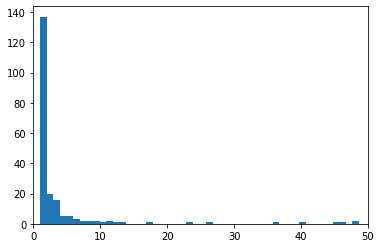

In [79]:
import matplotlib.pyplot as plt
# fig = plt.figure()
li = []
for k, v in per.items():
    li.append(v)
plt.xlim(0,50)
plt.hist(li, bins=292)

In [ ]:
len(li)

In [71]:
ans4 = set()
for k, v in per.items():
    if v > 2:
        ans4.add(k)
print(ans4)
# ans4の情報をもっと有効活用できるような気もする...

{('A_Validating', 'O_Returned', 'A_Incomplete'), ('O_Created', 'A_Accepted', 'O_Create Offer'), ('O_Created', 'A_Accepted', 'O_Sent (mail and online)'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete'), ('O_Created', 'A_Accepted', 'O_Cancelled'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete'), ('O_Created', 'A_Validating', 'O_Create Offer'), ('O_Sent (mail and online)', 'A_Complete', 'A_Incomplete', 'O_Create Offer'), ('A_Accepted', 'O_Returned', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete'), ('O_Create Offer', 'A_Create Application', 'A_Submitted', 'O_Created'), ('A_Concept', 'O_Create

# ケースの対応付け(手順2)

#### 実験用ケースIDの割り当て(正しいcaseIDが割り当てられているので組織によって異なるcaseIDを割り当て直す)

In [476]:
for i in t:
    if i[1][0] == 'A':
        i.append(i[2]+'_A')
    else:
        i.append(i[2]+'_O')

In [10]:
for i in range(len(t)):
    print(t[i])
    if i == 500:
        break

[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000), 'A_Create Application', 'Application_652823628', 'Application_652823628_A']
[datetime.datetime(2016, 1, 1, 9, 51, 15, 352000), 'A_Submitted', 'Application_652823628', 'Application_652823628_A']
[datetime.datetime(2016, 1, 1, 9, 52, 36, 413000), 'A_Concept', 'Application_652823628', 'Application_652823628_A']
[datetime.datetime(2016, 1, 1, 10, 16, 11, 500000), 'A_Create Application', 'Application_1691306052', 'Application_1691306052_A']
[datetime.datetime(2016, 1, 1, 10, 16, 11, 549000), 'A_Submitted', 'Application_1691306052', 'Application_1691306052_A']
[datetime.datetime(2016, 1, 1, 10, 17, 31, 594000), 'A_Concept', 'Application_1691306052', 'Application_1691306052_A']
[datetime.datetime(2016, 1, 1, 11, 19, 38, 177000), 'A_Create Application', 'Application_428409768', 'Application_428409768_A']
[datetime.datetime(2016, 1, 1, 11, 19, 38, 235000), 'A_Submitted', 'Application_428409768', 'Application_428409768_A']
[datetime.datetime(201

#### timestampとタスク間の繋がりの情報からケースを一部対応づける

In [14]:
# timestampの情報からケースを対応づけている
import datetime
t1 =t[0][0]
case1 = t[0][3]
l = len(t)
pattern = {}
T =datetime.timedelta(minutes=1)
for i in range(1,l):
    t2 = t[i][0]
    case2 = t[i][3]
    if t2 - t1 < T:
        if t2 < t1:
            print("miss")
        if case1 != case2 and case1[-1] != case2[-1]:
            if (case1,case2) not in pattern:
                if (case2,case1) not in pattern:
                    pattern[(case1,case2)] = 1
                else:
                    pattern[(case2,case1)] += 1
            else:
                pattern[(case1,case2)] += 1
    t1 = t2
    case1 = case2

In [15]:
print(len(t))

433444


In [84]:
# このカウント自体も分布で出して
li = [0] * 10
for v in pattern.values():
    for i in range(v,10):
        li[i] += 1

[0, 69439, 91931, 103445, 106016, 106264, 106273, 106273, 106273, 106273]


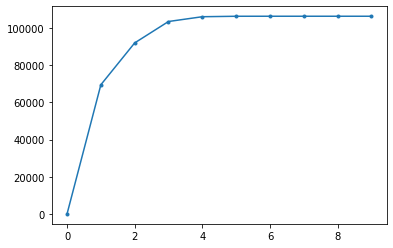

In [85]:
print(li)
x = [0,1,2,3,4,5,6,7,8,9]
plt.plot(x,li,marker='.')

#### 正解率をみる 

In [90]:
s = 0
c = 0
correct = set()
not_correct = set()
for k, v in pattern.items():
    if v > 3:
        s += 1
        if k[0][:-2] == k[1][:-2]:
            c += 1
            correct.add(k[1])
        else:
            not_correct.add(k[0])
            not_correct.add(k[1])
print(c, s, c/s)

1.0


In [91]:
tmp = set()
for i in t:
    tmp.add(i[2])
all_case = len(tmp)
print(c,s,all_case)

9 9 31509


In [34]:
tmp = set()
for i in t:
    tmp.add(i[2])
all_case = len(tmp)
print(c,s,all_case)

2799 2828 31509


### ここからタスク間の情報を利用するver

In [10]:
# timestampとタスクの繋がりの情報からケースを対応づけている
import datetime
t1 =t[0][0]
case1 = t[0][3]
task1 = t[0][1]
l = len(t)
pattern = {}
T =datetime.timedelta(minutes=1)
for i in range(1,l):
    t2 = t[i][0]
    case2 = t[i][3]
    task2 = t[i][1]
    delta.append(t2 - t1)
    if t2 - t1 < T:
        if t2 < t1:
            print("miss")
        # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
        # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
        if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
            if (case1,case2) not in pattern:
                if (case2,case1) not in pattern:
                    pattern[(case1,case2)] = 1
                else:
                    pattern[(case2,case1)] += 1
            else:
                pattern[(case1,case2)] += 1
    t1 = t2
    case1 = case2
    task1 = task2

In [ ]:
his

In [477]:
# timestampとタスクの繋がりの情報からケースを対応づけている
# 指標1を用いるのであればtimestampの情報いらなくないか？
# ということでtimestampを用いていないver

# 結果としてはtimestampの情報を用いてさらに篩をかけることができていた(有用かどうかはおいておいて)
# ということは時間差が1sよりあるが，ありうると判定されたペアが存在するということ．
# つまり"ほとんどが時間差が1s以内であるタスクのペア"の"時間差が1s以上である部分"が差に影響している
# そのタスクのペアの全てにおいて，時間差が1s以内であるものを，ans1に入れているわけではなく，
# そのタスクのペアのほとんどが時間差が1s以内であるものをans1に入れているから起こる．

import datetime
case1 = t[0][3]
task1 = t[0][1]
l = len(t)
pattern = {}
for i in range(1,l):
    case2 = t[i][3]
    task2 = t[i][1]
    # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
    # A->B，B->Aは出ないようになっている
    # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
    if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
        if (case1,case2) not in pattern:
            if (case2,case1) not in pattern:
                pattern[(case1,case2)] = 1
            else:
                pattern[(case2,case1)] += 1
        else:
            pattern[(case1,case2)] += 1
    case1 = case2
    task1 = task2

In [14]:
pattern

{('Application_196483749_A', 'Application_196483749_O'): 4,
 ('Application_196483749_O', 'Application_1363980603_A'): 2,
 ('Application_196483749_O', 'Application_1553362978_A'): 2,
 ('Application_1120819670_A', 'Application_1120819670_O'): 3,
 ('Application_2012588584_A', 'Application_2012588584_O'): 5,
 ('Application_1691306052_A', 'Application_1691306052_O'): 3,
 ('Application_1691306052_O', 'Application_428409768_A'): 2,
 ('Application_1691306052_A', 'Application_428409768_O'): 1,
 ('Application_428409768_O', 'Application_1825972191_A'): 2,
 ('Application_428409768_O', 'Application_428409768_A'): 2,
 ('Application_1395142997_A', 'Application_428409768_O'): 1,
 ('Application_428409768_O', 'Application_2015287405_A'): 1,
 ('Application_2015287405_A', 'Application_652823628_O'): 1,
 ('Application_652823628_O', 'Application_652823628_A'): 3,
 ('Application_828200680_A', 'Application_828200680_O'): 3,
 ('Application_828200680_A', 'Application_1085880569_O'): 1,
 ('Application_1085880569

(array([0.0000e+00, 1.3291e+04, 3.7070e+03, 2.2220e+03, 6.7000e+02,
        1.0200e+02, 8.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <BarContainer object of 10 artists>)

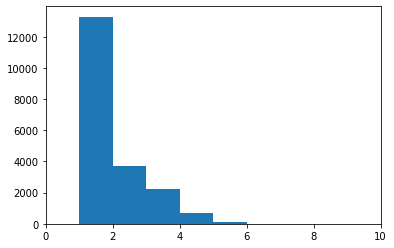

In [29]:
import matplotlib.pyplot as plt
m = 10
plt.xlim(0,m)
li = list(pattern.values())
plt.hist(li[:20000], bins=10,range=(0,m))


In [12]:
# 正解率をみる
s = 0
c = 0
correct = set()
not_correct = set()
for k, v in pattern.items():
    if v > 3:
        s += 1
        if k[0][:-2] == k[1][:-2]:
            c += 1
            correct.add(k[1])
        else:
            not_correct.add(k[0])
            not_correct.add(k[1])
print(c, s, c/s)
# print(c,'/',c/s)

4151 4173 0.9947280134196022


In [10]:
print(len(pattern))

114668


In [68]:
print(ans4)
print(t[0])

{('O_Created', 'A_Accepted', 'O_Create Offer'), ('O_Created', 'A_Validating', 'O_Sent (mail and online)'), ('O_Created', 'A_Concept', 'O_Sent (mail and online)'), ('O_Created', 'A_Create Application', 'A_Concept', 'O_Sent (mail and online)'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete'), ('O_Created', 'A_Create Application', 'A_Submitted', 'A_Concept', 'O_Sent (mail and online)'), ('O_Create Offer', 'A_Validating', 'O_Created'), ('O_Created', 'A_Accepted', 'O_Sent (mail and online)'), ('A_Submitted', 'O_Create Offer', 'O_Created', 'A_Concept'), ('O_Created', 'A_Create Application', 'A_Submitted', 'O_Sent (mail and online)'), ('A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete'), ('O_Accepted', 'A_Pending', 'O_Cancelled'), ('O_Created'

In [96]:
# 手順1の指標2をなんとか使いたい
# ans4の大きさが十分小さいと仮定して計算量的に厳しいコードを書く
import datetime
l = len(t)
pattern = {}
for i in range(l):
    f = 0
    if i < l - 1:
        tmp_case = t[i+1][3]
    for j in ans4:
        le = len(j)
        par = i
        chi = 0
        for k in range(le):
            if par == l or j[chi] != t[par][1]:
                break
            if chi > 0 and chi < le-1 and tmp_case != t[par][3]:
                break
            # 当てはまった場合
            # iからle個のケースが同じということなので
            elif k == le-1 and j[chi] == t[par][1]:
                #print(j)
                #for ch in range(le):
                #    print(t[i+ch])
                #print(le)
                #print(par,chi)
                
                if (t[i][3],t[i+1][3]) not in pattern:
                    if (t[i+1][3],t[i][3]) not in pattern:
                        pattern[(t[i][3],t[i+1][3])] = 1
                    else:
                        pattern[(t[i+1][3],t[i][3])] += 1
                else:
                    pattern[(t[i][3],t[i+1][3])] += 1
                f = 1
            par += 1
            chi += 1
        if f == 1:
            break

In [35]:
len(pattern)

{('Application_196483749_A', 'Application_196483749_O'): 3,
 ('Application_1363980603_A', 'Application_196483749_O'): 1,
 ('Application_1120819670_A', 'Application_1120819670_O'): 3,
 ('Application_2012588584_A', 'Application_2012588584_O'): 5,
 ('Application_1691306052_A', 'Application_1691306052_O'): 3,
 ('Application_1691306052_O', 'Application_428409768_A'): 2,
 ('Application_1691306052_A', 'Application_428409768_O'): 1,
 ('Application_428409768_O', 'Application_1825972191_A'): 2,
 ('Application_428409768_O', 'Application_428409768_A'): 2,
 ('Application_1395142997_A', 'Application_428409768_O'): 1,
 ('Application_2015287405_A', 'Application_652823628_O'): 1,
 ('Application_652823628_O', 'Application_652823628_A'): 3,
 ('Application_828200680_A', 'Application_828200680_O'): 3,
 ('Application_828200680_A', 'Application_1085880569_O'): 1,
 ('Application_1085880569_O', 'Application_1085880569_A'): 2,
 ('Application_1085880569_A', 'Application_1059184025_O'): 1,
 ('Application_10591840

In [24]:
# 正解率をみる
s = 0
c = 0
correct = set()
not_correct = set()
for k, v in pattern.items():
    if v > 1:
        s += 1
        if k[0][:-2] == k[1][:-2]:
            c += 1
            correct.add(k[1])
        else:
            not_correct.add(k[0])
            not_correct.add(k[1])
print(c, s, c/s)
# print(c,'/',c/s)

31217 37441 0.8337651237947704


In [11]:
pattern

{('Application_196483749_A', 'Application_196483749_O'): 3,
 ('Application_1363980603_A', 'Application_196483749_O'): 1,
 ('Application_1120819670_A', 'Application_1120819670_O'): 3,
 ('Application_2012588584_A', 'Application_2012588584_O'): 5,
 ('Application_1691306052_A', 'Application_1691306052_O'): 3,
 ('Application_1691306052_O', 'Application_428409768_A'): 2,
 ('Application_1691306052_A', 'Application_428409768_O'): 1,
 ('Application_428409768_O', 'Application_1825972191_A'): 2,
 ('Application_428409768_O', 'Application_428409768_A'): 2,
 ('Application_1395142997_A', 'Application_428409768_O'): 1,
 ('Application_2015287405_A', 'Application_652823628_O'): 1,
 ('Application_652823628_O', 'Application_652823628_A'): 3,
 ('Application_828200680_A', 'Application_828200680_O'): 3,
 ('Application_828200680_A', 'Application_1085880569_O'): 1,
 ('Application_1085880569_O', 'Application_1085880569_A'): 2,
 ('Application_1085880569_A', 'Application_1059184025_O'): 1,
 ('Application_10591840

# ここから隣り合わないものでも繋がりを見ていく

In [13]:
# ケースの対応づけ
for i in t:
    if i[1][0] == 'A':
        i.append(i[2]+'_A')
    else:
        i.append(i[2]+'_O')
print(t[0])

[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000), 'A_Create Application', 'Application_652823628', 'Application_652823628_A']


In [50]:
# ケースの初めと終わりのみを見る
# [初めの時刻，ケース番号][終わりの時刻，ケース番号]という配列を作る
tmp = {}
start = []
end = []
for i in t:
    if i[3] not in tmp:
        start.append([i[0],i[3]])
    tmp[i[3]] = i[0]
for k,v in tmp.items():
    end.append([v,k])
end.sort()

In [51]:
start

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000), 'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 12, 34, 53, 911000),
  'Application_1746793196_A'],
 [datetime.datetime(2016, 1, 1, 13, 0, 4, 360000), 'Application_828200680_A'],
 [datetime.datetime(2016, 1, 1, 13, 5, 19, 866000),
  'Application_1085880569_A'],
 [datetime.datetime(2016, 1, 1, 13, 22, 19, 758000),
  'Application_1266995739_A'],
 [datetime.datetime(2016, 1, 1, 13, 35, 26, 422000),
  'Application_1878239836_A'],
 [datetime.datetime(2016, 1, 1, 14, 13, 16, 64000), 'Application_619403287_A'],
 [datetime.datetime(2016, 1, 1, 14, 23, 21, 334000),
  'Application_1710223761_A'],
 [datetime.datetime(2016, 1, 1, 14, 42, 36, 728000),
  'Application_1529124572_A'],
 [datetime.datetime(2016, 1, 1, 16, 0, 1, 353000), 'Application_387012864_A'],
 [datetime.d

In [52]:
end

[[datetime.datetime(2016, 1, 6, 8, 50, 4, 825000), 'Application_369105792_A'],
 [datetime.datetime(2016, 1, 6, 8, 50, 4, 865000), 'Application_369105792_O'],
 [datetime.datetime(2016, 1, 6, 13, 45, 13, 998000),
  'Application_1754943309_A'],
 [datetime.datetime(2016, 1, 6, 13, 45, 14, 34000),
  'Application_1754943309_O'],
 [datetime.datetime(2016, 1, 6, 18, 13, 0, 451000),
  'Application_2002564265_A'],
 [datetime.datetime(2016, 1, 6, 18, 13, 0, 478000),
  'Application_2002564265_O'],
 [datetime.datetime(2016, 1, 7, 12, 2, 39, 169000),
  'Application_1674281629_A'],
 [datetime.datetime(2016, 1, 7, 12, 2, 39, 182000),
  'Application_1674281629_O'],
 [datetime.datetime(2016, 1, 7, 13, 29, 49, 671000),
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 7, 13, 29, 49, 710000),
  'Application_1691306052_O'],
 [datetime.datetime(2016, 1, 7, 13, 32, 4, 347000),
  'Application_1363980603_A'],
 [datetime.datetime(2016, 1, 7, 13, 32, 4, 371000),
  'Application_1363980603_O'],
 [datetim

In [61]:
# 計算量きつそう
# あるケースが別のあるケースを包含していることを仮定
# stateは今実行中のケース
state = []
l = len(start) # endの長さも同じ
i = 0
j = 0
dic = {}
while 1:
    #if i > 63015:
    #    print(start[i],end[j],i,j)
    if i == l-1 and j == l-1:
        break
    
    # stateにケースを追加
    if i < l-1 and start[i][0] < end[j][0]:
        state.append(start[i][1])
        i += 1
        
    # stateからケースを削除
    # 囲まれているケースを発見
    else:
        check = 0
        # stateの中からend[j][1]と同じケースのやつが何番目に入っているか探す
        for check in range(len(state)):
            if state[check] == end[j][1]:
                break
        state.pop(check)
        # checkまでのstateのケースはまだ終了していない=今取り除かれたcaseを囲んでいる
        for k in range(check):
            if state[k][-1] != end[j][1][-1]:
                if (state[k], end[j][1]) in dic:
                    dic[(state[k], end[j][1])] += 1
                else:
                    dic[(state[k], end[j][1])] = 1
        j += 1

In [62]:
# 何個と結びつくかの分布を出して
# caseの最初から最後だけでなく，taskでも絞った方が良い
dic

{('Application_196483749_O', 'Application_369105792_A'): 1,
 ('Application_1120819670_O', 'Application_369105792_A'): 1,
 ('Application_2012588584_O', 'Application_369105792_A'): 1,
 ('Application_1691306052_O', 'Application_369105792_A'): 1,
 ('Application_428409768_O', 'Application_369105792_A'): 1,
 ('Application_652823628_O', 'Application_369105792_A'): 1,
 ('Application_828200680_O', 'Application_369105792_A'): 1,
 ('Application_1085880569_O', 'Application_369105792_A'): 1,
 ('Application_1059184025_O', 'Application_369105792_A'): 1,
 ('Application_493034835_O', 'Application_369105792_A'): 1,
 ('Application_1266995739_O', 'Application_369105792_A'): 1,
 ('Application_1878239836_O', 'Application_369105792_A'): 1,
 ('Application_1294530310_O', 'Application_369105792_A'): 1,
 ('Application_619403287_O', 'Application_369105792_A'): 1,
 ('Application_387012864_O', 'Application_369105792_A'): 1,
 ('Application_767475240_O', 'Application_369105792_A'): 1,
 ('Application_857715587_O', 'Ap

In [64]:
for i in t:
    if i[2] == "Application_369105792":
        print(i)

[datetime.datetime(2016, 1, 4, 16, 53, 54, 402000), 'A_Create Application', 'Application_369105792', 'Application_369105792_A']
[datetime.datetime(2016, 1, 4, 16, 53, 54, 448000), 'A_Submitted', 'Application_369105792', 'Application_369105792_A']
[datetime.datetime(2016, 1, 4, 16, 55, 3, 816000), 'A_Concept', 'Application_369105792', 'Application_369105792_A']
[datetime.datetime(2016, 1, 5, 14, 40, 48, 216000), 'A_Accepted', 'Application_369105792', 'Application_369105792_A']
[datetime.datetime(2016, 1, 5, 14, 42, 10, 191000), 'O_Create Offer', 'Application_369105792', 'Application_369105792_O']
[datetime.datetime(2016, 1, 5, 14, 42, 11, 964000), 'O_Created', 'Application_369105792', 'Application_369105792_O']
[datetime.datetime(2016, 1, 5, 14, 42, 25, 536000), 'O_Sent (mail and online)', 'Application_369105792', 'Application_369105792_O']
[datetime.datetime(2016, 1, 5, 14, 42, 25, 561000), 'A_Complete', 'Application_369105792', 'Application_369105792_A']
[datetime.datetime(2016, 1, 6,

In [ ]:
# 始まり時点で許容できるズレ
T1 = dt.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=5, hours=0, weeks=0)
T2 = dt.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=3, hours=0, weeks=0)

In [65]:
# 実験的に終わりの時刻がほぼ同時になることを利用して紐付けしてみる．
# 終わりの時刻がほぼ一緒を別の条件っぽくカモフラージュできれば最後の手段としてなんとかなるか笑

#終わりの時間で許容できるズレ
T = dt.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=3, hours=0, weeks=0)
t1 = end[0][0]
case1 = end[0][1]
li = []
for i in range(1,len(end)):
    t2 = end[i][0]
    case2 = end[i][1]
    if t2 - t1 < T:
        li.append([case1,case2])
    t1 = t2
    case1 = case2

In [66]:
c = 0
for i in li:
    if i[0][:-2] == i[0][:-2]:
        c += 1
print(c/len(li))
print(len(li))

1.0
50015


In [9]:
t

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_

In [67]:
# ケースの初めと終わりのみを見る
# [ケース番号，初めの時刻，終わりの時刻]という配列を作る
# 計算量しんどそう
start = {}
end = {}
merged = []
for i in t:
    if i[3] not in start:
        start[i[3]]  = i[0]
    end[i[3]] = i[0]
c = 0
for k, v in start.items():
    merged.append([k,v,end[k]])

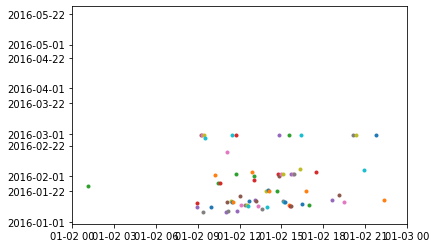

In [95]:
import matplotlib.pyplot as plt
plt.xlim(16802,16803)
c = 0
for i in merged:
    plt.plot(i[1],i[2],marker='.')
    c += 1
    if c == 1000:
        break

In [68]:
# (ケースの初めの時刻の差) ** 2 + (ケースの終わりの時刻の差)　** 2 を損失関数として最小化を図る
# 計算量やばい
inf = float("inf")
ans = [[inf,-1,merged[i][0]] for i in range(len(merged))]
for i in range(len(merged)):
    if i % 10000 == 0:
        print(i)
    for j in range(i+1,min(i+5000,len(merged))):
        tmp = int((merged[i][1] - merged[j][1]).total_seconds()) ** 2 + int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
        # tmp = int((merged[i][2] - merged[j][2]).total_seconds()) ** 2
        if ans[i][0] > tmp:
            ans[i][0] = tmp
            ans[i][1] = merged[j][0]
        if ans[j][0] > tmp:
            ans[j][0] = tmp
            ans[j][1] = merged[i][0]

0


KeyboardInterrupt: 

In [124]:
ans

[[0, 'Application_652823628_O', 'Application_652823628_A'],
 [0, 'Application_1691306052_O', 'Application_1691306052_A'],
 [0, 'Application_428409768_O', 'Application_428409768_A'],
 [0, 'Application_1746793196_O', 'Application_1746793196_A'],
 [0, 'Application_828200680_O', 'Application_828200680_A'],
 [0, 'Application_1085880569_O', 'Application_1085880569_A'],
 [0, 'Application_1266995739_O', 'Application_1266995739_A'],
 [0, 'Application_1878239836_O', 'Application_1878239836_A'],
 [0, 'Application_619403287_O', 'Application_619403287_A'],
 [0, 'Application_857715587_A', 'Application_1710223761_A'],
 [0, 'Application_1529124572_O', 'Application_1529124572_A'],
 [0, 'Application_387012864_O', 'Application_387012864_A'],
 [0, 'Application_1120819670_O', 'Application_1120819670_A'],
 [0, 'Application_42838382_O', 'Application_42838382_A'],
 [0, 'Application_180547487_O', 'Application_180547487_A'],
 [0, 'Application_1966208034_O', 'Application_1966208034_A'],
 [0, 'Application_1806387

In [127]:
c = 0
for i in ans:
    if i[1][:-2] == i[2][:-2]:
        c += 1
print(c)
print(c/len(merged))

17999
0.2856168078961567


In [105]:
merged

[['Application_652823628_A',
  datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  datetime.datetime(2016, 1, 14, 15, 49, 11, 420000)],
 ['Application_1691306052_A',
  datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  datetime.datetime(2016, 1, 7, 13, 29, 49, 671000)],
 ['Application_428409768_A',
  datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  datetime.datetime(2016, 1, 14, 7, 0, 14, 450000)],
 ['Application_1746793196_A',
  datetime.datetime(2016, 1, 1, 12, 34, 53, 911000),
  datetime.datetime(2016, 1, 28, 12, 18, 51, 292000)],
 ['Application_828200680_A',
  datetime.datetime(2016, 1, 1, 13, 0, 4, 360000),
  datetime.datetime(2016, 2, 2, 7, 0, 20, 734000)],
 ['Application_1085880569_A',
  datetime.datetime(2016, 1, 1, 13, 5, 19, 866000),
  datetime.datetime(2016, 2, 29, 7, 0, 48, 775000)],
 ['Application_1266995739_A',
  datetime.datetime(2016, 1, 1, 13, 22, 19, 758000),
  datetime.datetime(2016, 1, 9, 15, 48, 53, 141000)],
 ['Application_1878239836_A',
  datetime.datetime(

### 単純に隣り合った，でなく近くの，にしてみる(重み付けする)
##### step1の条件を緩めたver

In [31]:
# 単純に隣り合った，でなく近くの，にしてみる
# 結合パターン
pattern = {}
ans2 = set()
l = len(t)
# 計算量的にこの程度が限度
# 1日をカバーするなら1031くらい欲しい
# 1000で実行したときの実行時間は12分程度
z = 30
weight = 9 / 10
for i in range(1,l):
    if i % 50000 == 0:
        print(i)
    # 辞書のキーにリストは使えないがタプルは使えるらしい
    # 組織横断だけのペアの統計もとるべき
    # 全体のケース(タスク)数も出してパーセンテージで表示する
    # 出せる値はできるだけ出しておく
    tmp = 1
    for j in range(i+1,min(i+z,l)):
        tmp *= weight
        # 異なる組織だったら
        if t[i][1][0] != t[j][1][0]:
            if (t[i][1],t[j][1]) in pattern:
                pattern[(t[i][1],t[j][1])] += tmp
                if (pattern[(t[i][1],t[j][1])] > 3000):
                    ans2.add((t[i][1],t[j][1]))
            else:
                pattern[(t[i][1],t[j][1])] = 1

50000
100000
150000
200000
250000
300000
350000
400000


In [24]:
for k,v in pattern.items():
    if v > 10000:
        print(k,v)

('A_Concept', 'O_Create Offer') 12918.90845719339
('A_Concept', 'O_Created') 10330.129407833434
('A_Accepted', 'O_Create Offer') 23108.474524205958
('A_Accepted', 'O_Created') 18476.461576396407
('A_Accepted', 'O_Sent (mail and online)') 13583.202702900491
('O_Create Offer', 'A_Complete') 17813.973431749695
('O_Create Offer', 'A_Accepted') 10167.767950419595
('O_Created', 'A_Complete') 22318.60832280437
('O_Created', 'A_Create Application') 10314.322456697788
('O_Created', 'A_Accepted') 12646.414869361895
('A_Complete', 'O_Create Offer') 16712.575489307972
('A_Complete', 'O_Created') 13394.517544810382
('A_Complete', 'O_Sent (mail and online)') 11152.308803050379
('O_Sent (mail and online)', 'A_Create Application') 10991.824195514486
('O_Sent (mail and online)', 'A_Accepted') 13395.48522396451
('O_Sent (mail and online)', 'A_Complete') 33753.94760769174
('O_Created', 'A_Validating') 12331.499324340884
('O_Sent (mail and online)', 'A_Validating') 12456.363797233815
('A_Validating', 'O_C

In [33]:
ans2 - ans1

{('A_Accepted', 'O_Cancelled'),
 ('A_Complete', 'O_Cancelled'),
 ('A_Concept', 'O_Cancelled'),
 ('A_Create Application', 'O_Accepted'),
 ('A_Create Application', 'O_Cancelled'),
 ('A_Create Application', 'O_Create Offer'),
 ('A_Create Application', 'O_Created'),
 ('A_Create Application', 'O_Returned'),
 ('A_Create Application', 'O_Sent (mail and online)'),
 ('A_Incomplete', 'O_Cancelled'),
 ('A_Pending', 'O_Sent (mail and online)'),
 ('A_Submitted', 'O_Accepted'),
 ('A_Submitted', 'O_Cancelled'),
 ('A_Submitted', 'O_Returned'),
 ('A_Validating', 'O_Cancelled'),
 ('A_Validating', 'O_Refused'),
 ('O_Accepted', 'A_Accepted'),
 ('O_Accepted', 'A_Complete'),
 ('O_Accepted', 'A_Concept'),
 ('O_Accepted', 'A_Create Application'),
 ('O_Accepted', 'A_Incomplete'),
 ('O_Accepted', 'A_Submitted'),
 ('O_Accepted', 'A_Validating'),
 ('O_Cancelled', 'A_Accepted'),
 ('O_Cancelled', 'A_Complete'),
 ('O_Cancelled', 'A_Concept'),
 ('O_Cancelled', 'A_Create Application'),
 ('O_Cancelled', 'A_Incomplete')

In [86]:
t

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_

In [30]:
(9/10) ** 20

0.12157665459056935

### ある一定時間以内を一塊として捉えてそれの初めと終わりの時間を保持しておく．
すなわち{ケース名:((初め,終わり)(初め,終わり)...(初め,終わり)),...}←ぼつ

[初めの時刻，ケース番号][終わりの時刻，ケース番号]という配列を細切れに作る

In [38]:
# [初めの時刻，ケース番号][終わりの時刻，ケース番号]という配列を作る
tmp = {}
for i in t:
    if i[3] not in tmp:
        tmp[i[3]] = [i]
    else:
        tmp[i[3]].append(i)

In [39]:
tmp

{'Application_652823628': [[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
   'A_Create Application',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
   'A_Submitted',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
   'A_Concept',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 2, 11, 23, 4, 299000),
   'A_Accepted',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 2, 11, 29, 3, 994000),
   'O_Create Offer',
   'Application_652823628',
   'Application_652823628_O'],
  [datetime.datetime(2016, 1, 2, 11, 29, 5, 354000),
   'O_Created',
   'Application_652823628',
   'Application_652823628_O'],
  [datetime.datetime(2016, 1, 2, 11, 30, 28, 606000),
   'O_Sent (mail and online)',
   'Application_652823628',
   'Application_652823628_O'],
  [datetime.datetime(2016, 1, 2, 11, 30, 28,

In [40]:
t

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_

In [75]:
# 5分以内は一塊として捉える
T1 = dt.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=5, hours=0, weeks=0)
# T2 = dt.timedelta(days=0, seconds=0, microseconds=0, milliseconds=0, minutes=3, hours=0, weeks=0)
# inter には[ケース，始まりの時刻，終わりの時刻]という配列を入れる．
inter = []
for k, v in tmp.items():
    now = 0
    # 各ケース内での処理
    pre = v[0]
    for i in range(1, len(v)):
        now = v[i]
        if now[0] - pre[0] > T1:
            inter.append([k,pre,now])
        pre = v[i]

In [76]:
inter

[['Application_652823628_A',
  [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
   'A_Concept',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 2, 11, 23, 4, 299000),
   'A_Accepted',
   'Application_652823628',
   'Application_652823628_A']],
 ['Application_652823628_A',
  [datetime.datetime(2016, 1, 2, 11, 23, 4, 299000),
   'A_Accepted',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 2, 11, 30, 28, 633000),
   'A_Complete',
   'Application_652823628',
   'Application_652823628_A']],
 ['Application_652823628_A',
  [datetime.datetime(2016, 1, 2, 11, 30, 28, 633000),
   'A_Complete',
   'Application_652823628',
   'Application_652823628_A'],
  [datetime.datetime(2016, 1, 13, 13, 10, 55, 973000),
   'A_Validating',
   'Application_652823628',
   'Application_652823628_A']],
 ['Application_652823628_A',
  [datetime.datetime(2016, 1, 13, 13, 10, 55, 973000),
   'A_Validating',
   'Application_652823628',


In [74]:
inter

[['Application_1000086665_A',
  [datetime.datetime(2016, 8, 3, 15, 57, 21, 673000),
   'A_Create Application',
   'Application_1000086665',
   'Application_1000086665_A'],
  [datetime.datetime(2016, 8, 5, 13, 57, 7, 419000),
   'A_Accepted',
   'Application_1000086665',
   'Application_1000086665_A']],
 ['Application_1000086665_A',
  [datetime.datetime(2016, 8, 3, 15, 57, 21, 673000),
   'A_Create Application',
   'Application_1000086665',
   'Application_1000086665_A'],
  [datetime.datetime(2016, 8, 5, 14, 1, 23, 288000),
   'A_Complete',
   'Application_1000086665',
   'Application_1000086665_A']],
 ['Application_1000086665_A',
  [datetime.datetime(2016, 8, 3, 15, 57, 21, 673000),
   'A_Create Application',
   'Application_1000086665',
   'Application_1000086665_A'],
  [datetime.datetime(2016, 9, 5, 6, 0, 36, 710000),
   'A_Cancelled',
   'Application_1000086665',
   'Application_1000086665_A']],
 ['Application_1000086665_O',
  [datetime.datetime(2016, 8, 5, 13, 59, 57, 320000),
   '

In [41]:
for i in start:
    if i[1] == 'Application_196483749_A' or i[1] == 'Application_196483749_O':
        print(i)

[datetime.datetime(2016, 1, 2, 9, 12, 7, 481000), 'Application_196483749_A']
[datetime.datetime(2016, 1, 2, 9, 17, 5, 720000), 'Application_196483749_O']
[datetime.datetime(2016, 1, 2, 9, 19, 21, 383000), 'Application_196483749_A']
[datetime.datetime(2016, 1, 2, 9, 22, 9, 421000), 'Application_196483749_O']
[datetime.datetime(2016, 1, 29, 9, 38, 52, 642000), 'Application_196483749_O']
[datetime.datetime(2016, 2, 29, 7, 1, 5, 198000), 'Application_196483749_A']
[datetime.datetime(2016, 2, 29, 7, 1, 5, 239000), 'Application_196483749_O']


In [42]:
start

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000), 'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 12, 34, 53, 911000),
  'Application_1746793196_A'],
 [datetime.datetime(2016, 1, 1, 13, 0, 4, 360000), 'Application_828200680_A'],
 [datetime.datetime(2016, 1, 1, 13, 5, 19, 866000),
  'Application_1085880569_A'],
 [datetime.datetime(2016, 1, 1, 13, 22, 19, 758000),
  'Application_1266995739_A'],
 [datetime.datetime(2016, 1, 1, 13, 35, 26, 422000),
  'Application_1878239836_A'],
 [datetime.datetime(2016, 1, 1, 14, 13, 16, 64000), 'Application_619403287_A'],
 [datetime.datetime(2016, 1, 1, 14, 23, 21, 334000),
  'Application_1710223761_A'],
 [datetime.datetime(2016, 1, 1, 14, 42, 36, 728000),
  'Application_1529124572_A'],
 [datetime.datetime(2016, 1, 1, 16, 0, 1, 353000), 'Application_387012864_A'],
 [datetime.d

In [29]:
f = 0
tmp = []
for i in t:
    if i[2] == "Application_1911804233":
        f += 1
    if f > 0:
        print(i)
    if f > 2:
        break

[datetime.datetime(2016, 1, 5, 14, 0, 51, 292000), 'A_Create Application', 'Application_1911804233', 'Application_1911804233_A']
[datetime.datetime(2016, 1, 5, 14, 0, 51, 326000), 'A_Submitted', 'Application_1911804233', 'Application_1911804233_A']
[datetime.datetime(2016, 1, 5, 14, 1, 4, 428000), 'O_Create Offer', 'Application_1308403282', 'Application_1308403282_O']
[datetime.datetime(2016, 1, 5, 14, 1, 5, 704000), 'O_Created', 'Application_1308403282', 'Application_1308403282_O']
[datetime.datetime(2016, 1, 5, 14, 1, 58, 694000), 'O_Create Offer', 'Application_1308403282', 'Application_1308403282_O']
[datetime.datetime(2016, 1, 5, 14, 2, 0, 29000), 'O_Created', 'Application_1308403282', 'Application_1308403282_O']
[datetime.datetime(2016, 1, 5, 14, 2, 20, 105000), 'A_Create Application', 'Application_1195396325', 'Application_1195396325_A']
[datetime.datetime(2016, 1, 5, 14, 2, 20, 140000), 'A_Submitted', 'Application_1195396325', 'Application_1195396325_A']
[datetime.datetime(2016,

### 二つのタスク以外を削除して...→削除と言っても普通にみているのと変わらなくないか？→削除したら"隣接したら"という条件を使うことができる

In [8]:
from collections import defaultdict
task1 = set()
task2 = set()
for i in t:
    if i[1][0] == 'A':
        task1.add(i[1])
    else:
        task2.add(i[1])
print(len(task1),len(task2))

task_num = defaultdict(int)
for i in t:
    task_num[i[1]] += 1

10 8


In [9]:
task_num

defaultdict(int,
            {'A_Create Application': 31509,
             'A_Submitted': 20423,
             'A_Concept': 31509,
             'A_Accepted': 31509,
             'O_Create Offer': 42995,
             'O_Created': 42995,
             'O_Sent (online only)': 2026,
             'A_Complete': 31362,
             'O_Cancelled': 20898,
             'O_Sent (mail and online)': 39707,
             'A_Validating': 38816,
             'A_Incomplete': 23055,
             'O_Returned': 23305,
             'A_Cancelled': 10431,
             'O_Accepted': 17228,
             'A_Pending': 17228,
             'A_Denied': 3753,
             'O_Refused': 4695})

In [11]:
# ケースの対応づけ
for i in t:
    if i[1][0] == 'A':
        i.append(i[2]+'_A')
    else:
        i.append(i[2]+'_O')
print(t[0])

[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000), 'A_Create Application', 'Application_652823628', 'Application_652823628_A']


In [12]:
# AOAとしてみる(前後関係がわかる/必ずしも繋がっているわけではない)
# Aは同じケースを持つものしか入れないようにする
from collections import defaultdict
dic = defaultdict(int)
missdic = defaultdict(int)
show = []
for t1 in task1:
    print(t1)
    for t3 in task1:
        if t1 != t3:
            for t2 in task2:
                edited = []
                tmp_case = set()
                for i in t:
                    if i[1] == t1:
                        edited.append(i)
                        tmp_case.add(i[3])
                    elif i[1] == t2:
                        edited.append(i)
                    elif i[1] == t3 and i[3] in tmp_case:
                        edited.append(i)
                
                tmp_case = set()
                edit = []
                for i in range(len(edited)-1,-1,-1):
                    if edited[i][1] == t3:
                        tmp_case.add(edited[i][3])
                        edit.append(edited[i])
                    elif edited[i][1] == t2:
                        edit.append(edited[i])
                    elif edited[i][1] == t1 and edited[i][3] in tmp_case:
                        edit.append(edited[i])
                edited = []
                for i in range(len(edit)-1,-1,-1):
                    edited.append(edit[i])
                    #if t1 == "A_Validating" and t2 == "O_Create Offer" and t3 =="A_Denied":
                    #   print(edit[i])
                    
                # editedを用いて処理をかく / 隣接しなくても良いようにする
                show.append(edited)
                for i in range(0,len(edited)):
                    if edited[i][1] == t1:
                        f = 0
                        for j in range(1,100):
                            if edited[i][3] == edited[i+j][3]:
                                if f == 0:
                                    # もしt1の後に，t2が出る前にt3が出てきたらmissdicでカウント
                                    missdic[((t1,t2,t3))] += 1
                                break
                            elif edited[i+j][1] == t2 and f == 0:
                                # もしt1の後に，t2が何回か出て，t3が出てきたらdicでカウント
                                dic[(t1,t2,t3)] += 1
                                f = 1
                #if dic[(t1,t2,t3)] > 0:
                #   print(t1,t2,t3,dic[(t1,t2,t3)],missdic[((t1,t2,t3))])

A_Pending
A_Create Application


KeyboardInterrupt: 

In [21]:
show[78]

[[datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 13, 35, 26, 422000),
  'A_Create Application',
  'Application_1878239836',
  'Application_1878239836_A'],
 [datetime.datetime(2016, 1, 1, 17, 58, 26, 178000),
  'A_Create Application',
  'Application_1806387393',
  'Application_1806387393_A'],
 [datetime.datetime(2016, 1, 2, 1, 8, 49, 567000),
  'A_Create Application',
  'Application_319587802',
  'Application_319587802_A'],
 [datetime.datetime(2016, 1, 2, 8, 57, 3, 601000),
  'A_Create Application',
  'Application_546206358',
  'Application_546206358_A'],
 [datetime.datetime(2016, 1, 2, 9, 21, 26, 34000),
  'O_Cancelled',
  'Application_196483749',
  'Application_196483749_O'],
 [datetime.datetime(2016, 1, 2, 11, 26, 6, 88000),
  'O_Cancelled',
  'Application_428409768',
  'Application_428409768_O'],
 [datetime.datetime(2016, 1, 2, 11, 32, 6, 644000),
  'A_Create Appl

In [25]:
missdic

defaultdict(int,
            {('A_Accepted', 'O_Cancelled', 'A_Validating'): 120,
             ('A_Accepted', 'O_Returned', 'A_Validating'): 93,
             ('A_Accepted', 'O_Accepted', 'A_Validating'): 105,
             ('A_Accepted', 'O_Refused', 'A_Validating'): 127,
             ('A_Accepted', 'O_Sent (online only)', 'A_Validating'): 54,
             ('A_Accepted', 'O_Sent (mail and online)', 'A_Validating'): 55,
             ('A_Accepted', 'O_Cancelled', 'A_Denied'): 27,
             ('A_Accepted', 'O_Returned', 'A_Denied'): 29,
             ('A_Accepted', 'O_Accepted', 'A_Denied'): 33,
             ('A_Accepted', 'O_Refused', 'A_Denied'): 51,
             ('A_Accepted', 'O_Sent (online only)', 'A_Denied'): 40,
             ('A_Accepted', 'O_Sent (mail and online)', 'A_Denied'): 7,
             ('A_Accepted', 'O_Cancelled', 'A_Pending'): 3,
             ('A_Accepted', 'O_Refused', 'A_Pending'): 5,
             ('A_Accepted', 'O_Sent (mail and online)', 'A_Pending'): 1,
          

In [29]:
# missdicに入れられた回数が0回だったものは正しそう
for t1 in task1:
    for t3 in task1:
        if t1 != t3:
            for t2 in task2:
                if missdic[(t1,t2,t3)] == 0 and dic[(t1,t2,t3)] > 0:
                    print((t1,t2,t3),missdic[(t1,t2,t3)],dic[(t1,t2,t3)])

('A_Accepted', 'O_Create Offer', 'A_Validating') 0 21164
('A_Accepted', 'O_Created', 'A_Validating') 0 21156
('A_Accepted', 'O_Create Offer', 'A_Denied') 0 3752
('A_Accepted', 'O_Created', 'A_Denied') 0 3752
('A_Accepted', 'O_Create Offer', 'A_Pending') 0 17072
('A_Accepted', 'O_Returned', 'A_Pending') 0 9885
('A_Accepted', 'O_Accepted', 'A_Pending') 0 11626
('A_Accepted', 'O_Created', 'A_Pending') 0 17070
('A_Accepted', 'O_Sent (online only)', 'A_Pending') 0 3735
('A_Accepted', 'O_Create Offer', 'A_Cancelled') 0 10424
('A_Accepted', 'O_Created', 'A_Cancelled') 0 10424
('A_Accepted', 'O_Create Offer', 'A_Complete') 0 31197
('A_Accepted', 'O_Created', 'A_Complete') 0 31196
('A_Accepted', 'O_Create Offer', 'A_Incomplete') 0 14855
('A_Accepted', 'O_Created', 'A_Incomplete') 0 14856
('A_Submitted', 'O_Create Offer', 'A_Validating') 0 8664
('A_Submitted', 'O_Created', 'A_Validating') 0 8666
('A_Submitted', 'O_Sent (online only)', 'A_Validating') 0 2168
('A_Submitted', 'O_Sent (mail and onli

In [23]:
task1

{'A_Accepted',
 'A_Cancelled',
 'A_Complete',
 'A_Concept',
 'A_Create Application',
 'A_Denied',
 'A_Incomplete',
 'A_Pending',
 'A_Submitted',
 'A_Validating'}

In [18]:
# OAOとしてみる(前後関係がわかる/必ずしも繋がっているわけではない)
# Oは同じケースを持つものしか入れないようにする
show = []
for t1 in task2:
    print(t1)
    for t3 in task2:
        if t1 != t3:
            for t2 in task1:
                edited = []
                tmp_case = set()
                for i in t:
                    if i[1] == t1:
                        edited.append(i)
                        tmp_case.add(i[3])
                    elif i[1] == t2:
                        edited.append(i)
                    elif i[1] == t3 and i[3] in tmp_case:
                        edited.append(i)
                
                tmp_case = set()
                edit = []
                for i in range(len(edited)-1,-1,-1):
                    if edited[i][1] == t3:
                        tmp_case.add(edited[i][3])
                        edit.append(edited[i])
                    elif edited[i][1] == t2:
                        edit.append(edited[i])
                    elif edited[i][1] == t1 and edited[i][3] in tmp_case:
                        edit.append(edited[i])
                edited = []
                for i in range(len(edit)-1,-1,-1):
                    edited.append(edit[i])
                    #if t1 == "A_Validating" and t2 == "O_Create Offer" and t3 =="A_Denied":
                    #   print(edit[i])
                    
                # editedを用いて処理をかく / 隣接しなくても良いようにする
                show.append(edited)
                for i in range(0,len(edited)):
                    if edited[i][1] == t1:
                        f = 0
                        for j in range(1,5):
                            if edited[i][3] == edited[i+j][3]:
                                if f == 0:
                                    missdic[((t1,t2,t3))] += 1
                                break
                            elif edited[i+j][1] == t2:
                                dic[(t1,t2,t3)] += 1
                                f = 1
                #if dic[(t1,t2,t3)] > 0:
                #   print(t1,t2,t3,dic[(t1,t2,t3)],missdic[((t1,t2,t3))])

O_Returned
O_Sent (mail and online)


KeyboardInterrupt: 

In [69]:
# 一方通行で相互方向の矢印はないものとする
# A1O1A2の回数がわかるとき
# O1A1OnとOnA1O1を見ることでA1とO1のどちらが先に起こるかわかる
# シンプルに計算量しんどそう
dic

defaultdict(int,
            {('A_Validating', 'O_Create Offer', 'A_Denied'): 34265,
             ('A_Validating', 'O_Sent (online only)', 'A_Denied'): 7690,
             ('A_Validating', 'O_Accepted', 'A_Denied'): 26366,
             ('A_Validating', 'O_Sent (mail and online)', 'A_Denied'): 33393,
             ('A_Validating', 'O_Cancelled', 'A_Denied'): 22599,
             ('A_Validating', 'O_Created', 'A_Denied'): 34262,
             ('A_Validating', 'O_Returned', 'A_Denied'): 33022,
             ('A_Validating', 'O_Refused', 'A_Denied'): 13357,
             ('A_Validating', 'O_Create Offer', 'A_Incomplete'): 67373,
             ('A_Validating', 'O_Sent (online only)', 'A_Incomplete'): 6630,
             ('A_Validating', 'O_Accepted', 'A_Incomplete'): 36232,
             ('A_Validating',
              'O_Sent (mail and online)',
              'A_Incomplete'): 63973,
             ('A_Validating', 'O_Cancelled', 'A_Incomplete'): 29024,
             ('A_Validating', 'O_Created', 'A_Inc

In [23]:
for k,v in dic.items():
    if (k[0] == "A_Validating" or k[2] == "A_Validating") and k[1] == "O_Accepted":
        print(k,v)
print("\n")
for k,v in missdic.items():
    if (k[0] == "A_Validating" or k[2] == "A_Validating") and k[1] == "O_Accepted":
        print(k,v)

('A_Submitted', 'O_Accepted', 'A_Validating') 5474
('A_Incomplete', 'O_Accepted', 'A_Validating') 11651
('A_Create Application', 'O_Accepted', 'A_Validating') 8058
('A_Complete', 'O_Accepted', 'A_Validating') 9117
('A_Validating', 'O_Accepted', 'A_Pending') 20644
('A_Validating', 'O_Accepted', 'A_Incomplete') 10740
('A_Validating', 'O_Accepted', 'A_Cancelled') 1478
('A_Validating', 'O_Accepted', 'A_Denied') 4795
('A_Accepted', 'O_Accepted', 'A_Validating') 9252
('A_Concept', 'O_Accepted', 'A_Validating') 8364


('A_Submitted', 'O_Accepted', 'A_Validating') 1
('A_Incomplete', 'O_Accepted', 'A_Validating') 334
('A_Create Application', 'O_Accepted', 'A_Validating') 51
('A_Complete', 'O_Accepted', 'A_Validating') 179
('A_Validating', 'O_Accepted', 'A_Pending') 77
('A_Validating', 'O_Accepted', 'A_Incomplete') 3236
('A_Validating', 'O_Accepted', 'A_Cancelled') 17
('A_Validating', 'O_Accepted', 'A_Denied') 57
('A_Accepted', 'O_Accepted', 'A_Validating') 105
('A_Concept', 'O_Accepted', 'A_Val

In [58]:
edited

[[datetime.datetime(2016, 1, 4, 7, 13, 16, 591000),
  'A_Validating',
  'Application_1660185664',
  'Application_1660185664_A'],
 [datetime.datetime(2016, 1, 4, 7, 17, 25, 348000),
  'A_Incomplete',
  'Application_1660185664',
  'Application_1660185664_A'],
 [datetime.datetime(2016, 1, 4, 9, 25, 8, 550000),
  'A_Validating',
  'Application_927205634',
  'Application_927205634_A'],
 [datetime.datetime(2016, 1, 4, 9, 28, 1, 461000),
  'A_Incomplete',
  'Application_927205634',
  'Application_927205634_A'],
 [datetime.datetime(2016, 1, 6, 7, 19, 33, 741000),
  'A_Validating',
  'Application_2005183817',
  'Application_2005183817_A'],
 [datetime.datetime(2016, 1, 6, 7, 25, 7, 913000),
  'A_Incomplete',
  'Application_2005183817',
  'Application_2005183817_A'],
 [datetime.datetime(2016, 1, 7, 9, 8, 50, 445000),
  'A_Validating',
  'Application_1674281629',
  'Application_1674281629_A'],
 [datetime.datetime(2016, 1, 7, 9, 40, 9, 412000),
  'A_Validating',
  'Application_1691306052',
  'Appli

In [27]:
edited

[[datetime.datetime(2016, 1, 2, 9, 17, 5, 720000),
  'O_Create Offer',
  'Application_196483749',
  'Application_196483749_O'],
 [datetime.datetime(2016, 1, 2, 9, 19, 21, 383000),
  'A_Complete',
  'Application_196483749',
  'Application_196483749_A'],
 [datetime.datetime(2016, 1, 2, 9, 21, 42, 22000),
  'O_Create Offer',
  'Application_196483749',
  'Application_196483749_O'],
 [datetime.datetime(2016, 1, 2, 9, 26, 43, 598000),
  'O_Create Offer',
  'Application_196483749',
  'Application_196483749_O'],
 [datetime.datetime(2016, 1, 2, 9, 55, 46, 369000),
  'O_Create Offer',
  'Application_1120819670',
  'Application_1120819670_O'],
 [datetime.datetime(2016, 1, 2, 9, 59, 50, 307000),
  'A_Complete',
  'Application_1120819670',
  'Application_1120819670_A'],
 [datetime.datetime(2016, 1, 2, 10, 35, 8, 906000),
  'O_Create Offer',
  'Application_2012588584',
  'Application_2012588584_O'],
 [datetime.datetime(2016, 1, 2, 10, 35, 27, 467000),
  'O_Create Offer',
  'Application_2012588584',


### ある組織内で隣り合っているタスクのペアと他の組織のタスクからタスクの流れを抽出する

In [8]:
for i in t:
    if i[1][0] == 'A':
        i.append(i[2]+'_A')
    else:
        i.append(i[2]+'_O')

In [9]:
# dicはケース識別子をキー，タスクの流れを値として持つ辞書
dic = {}
for i in t:
    if i[3] not in dic:
        dic[i[3]] = [i[1]]
    else:
        dic[i[3]].append(i[1])

In [10]:
dic

{'Application_652823628_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete',
  'A_Validating',
  'A_Incomplete',
  'A_Validating',
  'A_Pending'],
 'Application_1691306052_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete',
  'A_Validating',
  'A_Denied'],
 'Application_428409768_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete',
  'A_Validating',
  'A_Incomplete',
  'A_Validating',
  'A_Pending'],
 'Application_1746793196_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete',
  'A_Validating',
  'A_Incomplete',
  'A_Validating',
  'A_Incomplete',
  'A_Validating',
  'A_Pending'],
 'Application_828200680_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete',
  'A_Cancelled'],
 'Application_1085880569_A': ['A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'A_Complete'

In [11]:
# task_flowは組織内で隣接するタスクのペアとその個数
from collections import defaultdict
task_flow = defaultdict(int)
for case, tasks in dic.items():
    t1 = tasks[0]
    for i in range(1,len(tasks)):
        t2 = tasks[i]
        task_flow[(t1,t2)] += 1
        t1 = t2

In [12]:
task_flow

defaultdict(int,
            {('A_Create Application', 'A_Submitted'): 20423,
             ('A_Submitted', 'A_Concept'): 20423,
             ('A_Concept', 'A_Accepted'): 31509,
             ('A_Accepted', 'A_Complete'): 31362,
             ('A_Complete', 'A_Validating'): 21870,
             ('A_Validating', 'A_Incomplete'): 23052,
             ('A_Incomplete', 'A_Validating'): 16939,
             ('A_Validating', 'A_Pending'): 12291,
             ('A_Validating', 'A_Denied'): 3373,
             ('A_Complete', 'A_Cancelled'): 9307,
             ('A_Incomplete', 'A_Cancelled'): 924,
             ('A_Incomplete', 'A_Pending'): 4937,
             ('A_Create Application', 'A_Concept'): 11086,
             ('O_Create Offer', 'O_Created'): 42995,
             ('O_Created', 'O_Sent (online only)'): 1926,
             ('O_Sent (online only)', 'O_Cancelled'): 282,
             ('O_Cancelled', 'O_Create Offer'): 763,
             ('O_Created', 'O_Sent (mail and online)'): 36215,
             ('O_

In [13]:
from collections import defaultdict
task1 = set()
task2 = set()
for i in t:
    if i[1][0] == 'A':
        task1.add(i[1])
    else:
        task2.add(i[1])

In [14]:
task1

{'A_Accepted',
 'A_Cancelled',
 'A_Complete',
 'A_Concept',
 'A_Create Application',
 'A_Denied',
 'A_Incomplete',
 'A_Pending',
 'A_Submitted',
 'A_Validating'}

In [15]:
from collections import defaultdict
dic = defaultdict(int)
missdic = defaultdict(int)
counter = 0
show = []
for i in task_flow:
    if counter % 10 == 0:
        print(counter)
    a = i[0]
    b = i[1]
    task = 0
    if a[0] == 'A':
        task = task2
    else:
        task = task1
    for c in task:
        missdic[(a,c,b)] = 0
        edited = []
        tmp_case = set()
        for j in t:
            if j[1] == a:
                edited.append(j)
                tmp_case.add(j[3])
            elif j[1] == b and j[3] in tmp_case:
                edited.append(j)
            elif j[1] == c:
                edited.append(j)
        tmp_case = set()
        #for i in range(1,5000):
        #    print(edited[i])
        #break
        edit = []
        for j in range(len(edited)-1,-1,-1):
            if edited[j][1] == b:
                tmp_case.add(edited[j][3])
                edit.append(edited[j])
            elif edited[j][1] == a and edited[j][3] in tmp_case:
                edit.append(edited[j])
            elif edited[j][1] == c:
                edit.append(edited[j])
        edited = []
        for i in range(len(edit)-1,-1,-1):
            edited.append(edit[i])
        show.append((a,b,edited))
        for i in range(0,len(edited)):
            if edited[i][1] == a:
                f = 0
                em_case = set()
                for j in range(1,min(10000,len(edited)-i)):
                    # missdicにはAOAの時，AAという事象があったら加算するようにしている
                    # すなわち，missdicが0回ということはAとAの間には必すそのOが入っている，ということ
                    # 15個より多くのケースが出てきた場合もmissdicに加算するようにする
                    # 15個より多くのケースが出てきたら終わり
                    if len(em_case) > 15:
                        missdic[(a,c,b)] += 1
                        break

                    # 同じケースIDが出てきたら終わり
                    if edited[i][3] == edited[i+j][3]:
                        if f == 0:
                            missdic[(a,c,b)] += 1
                        break
                    # もしも異なる組織のタスクだったらカウント
                    elif edited[i+j][1][0] != a[0]:
                        dic[(a,c,b)] += 1
                        f = 1
                        em_case.add(edited[i+j][3])
    counter += 1

0
10
20
30
40
50


In [16]:
li = []
for k, v in missdic.items():
    if v/task_flow[(k[0],k[2])] < 0.3:
        li.append([v/task_flow[(k[0],k[2])],k,v])
print(len(missdic))

548


In [17]:
li.sort()
for i in li:
    print(i)

[0.0, ('O_Accepted', 'A_Pending', 'O_Cancelled'), 0]
[0.04833875390600089, ('A_Accepted', 'O_Create Offer', 'A_Complete'), 1516]
[0.04833875390600089, ('A_Accepted', 'O_Created', 'A_Complete'), 1516]
[0.05417384095402079, ('A_Accepted', 'O_Sent (mail and online)', 'A_Complete'), 1699]


In [18]:
dic = {}
for i in li:
    if i[1][0] not in dic:
        dic[i[1][0]] = [i[1]]
    else:
        dic[i[1][0]].append(i[1])

In [19]:
dic

{'O_Accepted': [('O_Accepted', 'A_Pending', 'O_Cancelled')],
 'A_Accepted': [('A_Accepted', 'O_Create Offer', 'A_Complete'),
  ('A_Accepted', 'O_Created', 'A_Complete'),
  ('A_Accepted', 'O_Sent (mail and online)', 'A_Complete')]}

In [33]:
# ケースを対応づける　改良版(閾値を導入)
import datetime
l = len(t)
pattern = {}
inter_case_num = []
for i in range(l):
    #　一つ目のタスクがdicにあったら
    if t[i][1] in dic:
        # 一つ目のタスクが同じであるdicに入っているペアをそれぞれやる
        for each in dic[t[i][1]]:
            em_case = set()
            for j in range(1,min(1000,l-i)):
                
                # 3つ目のタスクが出てきたらケースをそれまでに出てきたケースを対応づけて終了
                if t[i+j][1] == each[2] and t[i+j][3] == t[i][3]:
                    for case in em_case:
                        if (t[i][3],case) not in pattern:
                            if (case,t[i][3]) not in pattern:
                                pattern[(t[i][3],case)] = 1
                            else:
                                pattern[(case,t[i][3])] += 1
                        else:
                            pattern[(t[i][3],case)] += 1
                        inter_case_num.append(len(em_case))
                    break
                # 10個以上のケースが出てきたら終了
                if len(em_case) > 10:
                    inter_case_num.append(10)
                    break
                    
                # 一番初めに出てきた真ん中のタスクをもつイベントのケースとくっつける
                if t[i+j][1] == each[1]:
                    em_case.add(t[i+j][3])

In [27]:
#inter_case_numのヒストグラム出す
import matplotlib.pyplot as plt
plt.hist(inter_case_num[:10000])

(array([2437., 2736., 1668.,  940.,  545.,  294.,   70.,  128.,  162.,
        1020.]),
 array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.]),
 <BarContainer object of 10 artists>)

In [20]:
l = len(pattern)
c = 0
# たしか全てのケース数は31509
for k, v in pattern.items():
    if k[:-2] == v[:-2]:
        c += 1
print(c/l, l)

TypeError: 'int' object is not subscriptable

In [46]:
missdic

defaultdict(int,
            {('A_Create Application', 'O', 'A_Submitted'): 20423,
             ('A_Create Application', '_', 'A_Submitted'): 20423,
             ('A_Create Application', 'C', 'A_Submitted'): 20423,
             ('A_Create Application', 'a', 'A_Submitted'): 20423,
             ('A_Create Application', 'n', 'A_Submitted'): 20423,
             ('A_Create Application', 'c', 'A_Submitted'): 20423,
             ('A_Create Application', 'e', 'A_Submitted'): 20423,
             ('A_Create Application', 'l', 'A_Submitted'): 20423,
             ('A_Create Application', 'd', 'A_Submitted'): 20423,
             ('A_Submitted', 'O', 'A_Concept'): 18469,
             ('A_Submitted', '_', 'A_Concept'): 18469,
             ('A_Submitted', 'C', 'A_Concept'): 18469,
             ('A_Submitted', 'a', 'A_Concept'): 18469,
             ('A_Submitted', 'n', 'A_Concept'): 18469,
             ('A_Submitted', 'c', 'A_Concept'): 18469,
             ('A_Submitted', 'e', 'A_Concept'): 18469,
    

In [52]:
for k, v in dic.items():
    if v > 3000000:
        print(k,v)

('A_Incomplete', 'O_Create Offer', 'A_Incomplete') 4160463
('A_Incomplete', 'O_Created', 'A_Incomplete') 4156637
('A_Incomplete', 'O_Sent (mail and online)', 'A_Incomplete') 3815587
('A_Complete', 'O_Create Offer', 'A_Validating') 3694234
('A_Complete', 'O_Created', 'A_Validating') 3690638
('A_Complete', 'O_Sent (mail and online)', 'A_Validating') 3413544
('A_Validating', 'O_Create Offer', 'A_Validating') 6566874
('A_Validating', 'O_Created', 'A_Validating') 6560780
('A_Validating', 'O_Sent (mail and online)', 'A_Validating') 6035899
('A_Validating', 'O_Cancelled', 'A_Validating') 3264136
('A_Validating', 'O_Returned', 'A_Validating') 3826364
('O_Created', 'A_Validating', 'O_Returned') 3299137
('A_Validating', 'O_Create Offer', 'A_Pending') 4136334
('A_Validating', 'O_Created', 'A_Pending') 4133279
('A_Validating', 'O_Sent (mail and online)', 'A_Pending') 3806992
('O_Sent (mail and online)', 'A_Validating', 'O_Returned') 3174572
('O_Returned', 'A_Validating', 'O_Returned') 3614855
('O_

In [42]:
for i in range(1800,3000):
    print(show[0][2][i])

[datetime.datetime(2016, 1, 9, 12, 16, 36, 517000), 'O_Create Offer', 'Application_1553446113', 'Application_1553446113_O']
[datetime.datetime(2016, 1, 9, 12, 16, 37, 684000), 'O_Created', 'Application_1553446113', 'Application_1553446113_O']
[datetime.datetime(2016, 1, 9, 12, 17, 43, 183000), 'O_Sent (mail and online)', 'Application_1553446113', 'Application_1553446113_O']
[datetime.datetime(2016, 1, 9, 12, 37, 44, 503000), 'O_Create Offer', 'Application_83337214', 'Application_83337214_O']
[datetime.datetime(2016, 1, 9, 12, 37, 45, 715000), 'O_Created', 'Application_83337214', 'Application_83337214_O']
[datetime.datetime(2016, 1, 9, 12, 38, 8, 847000), 'O_Sent (mail and online)', 'Application_83337214', 'Application_83337214_O']
[datetime.datetime(2016, 1, 9, 12, 38, 52, 897000), 'O_Create Offer', 'Application_2033211562', 'Application_2033211562_O']
[datetime.datetime(2016, 1, 9, 12, 38, 54, 104000), 'O_Created', 'Application_2033211562', 'Application_2033211562_O']
[datetime.dateti

In [38]:
len(show[0][2])

202654

In [37]:
show[0]

('A_Validating',
 'A_Denied',
 [[datetime.datetime(2016, 1, 2, 9, 17, 5, 720000),
   'O_Create Offer',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 17, 8, 762000),
   'O_Created',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 19, 21, 330000),
   'O_Sent (online only)',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 21, 26, 34000),
   'O_Cancelled',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 21, 42, 22000),
   'O_Create Offer',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 21, 43, 573000),
   'O_Created',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 22, 9, 421000),
   'O_Sent (mail and online)',
   'Application_196483749',
   'Application_196483749_O'],
  [datetime.datetime(2016, 1, 2, 9, 26, 4

{('Application_196483749_A', 'Application_196483749_O'): 3,
 ('Application_1363980603_A', 'Application_196483749_O'): 1,
 ('Application_1120819670_A', 'Application_1120819670_O'): 3,
 ('Application_2012588584_A', 'Application_2012588584_O'): 5,
 ('Application_1691306052_A', 'Application_1691306052_O'): 3,
 ('Application_1691306052_O', 'Application_428409768_A'): 2,
 ('Application_1691306052_A', 'Application_428409768_O'): 1,
 ('Application_428409768_O', 'Application_1825972191_A'): 2,
 ('Application_428409768_O', 'Application_428409768_A'): 2,
 ('Application_1395142997_A', 'Application_428409768_O'): 1,
 ('Application_2015287405_A', 'Application_652823628_O'): 1,
 ('Application_652823628_O', 'Application_652823628_A'): 3,
 ('Application_828200680_A', 'Application_828200680_O'): 3,
 ('Application_828200680_A', 'Application_1085880569_O'): 1,
 ('Application_1085880569_O', 'Application_1085880569_A'): 2,
 ('Application_1085880569_A', 'Application_1059184025_O'): 1,
 ('Application_10591840

## あるケースが複数ケースと結びつく場合を排除する工程

In [478]:
# あるケースが複数ケースと結びつく場合を排除する工程
# もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
# つまり1回以上同じかも判定されたものの中で，
# 同じかも判定された数の多い順に対応づけする．
# liは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
import copy
for_sort = []
v2_threshold = 3
cor = {}
for k, v in pattern.items():
    if v > v2_threshold:
        # A -> Oの順番にする
        if k[0][-1] == 'O':
            for_sort.append([k[1],k[0],v])
        else:
            for_sort.append([k[0],k[1],v])
for_sort.sort()
li = []
i = 0
while i < len(for_sort):
    j = 1
    tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
    while 1:
        if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
            li.append(tmp)
            break
        else:
            if tmp[2] < for_sort[i+j][2]:
                tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
            j += 1
    i += j
for_sort = copy.deepcopy(li)
for_sort.sort(key=lambda x: x[1])
li = []
i = 0
while i < len(for_sort):
    j = 1
    tmp = [for_sort[i][0],for_sort[i][1],for_sort[i][2]]
    while 1:
        if i + j == len(for_sort) or for_sort[i][1] != for_sort[i+j][1]:
            li.append([tmp[0],tmp[1]])
            break
        else:
            if tmp[2] < for_sort[i+j][2]:
                tmp = [for_sort[i+j][0],for_sort[i+j][1], for_sort[i+j][2]]
            j += 1
    i += j
for i in li:
    cor[i[0]] = i[1]
    cor[i[1]] = i[0]

In [479]:
# 評価
# 対応づけられたケース数と誤って対応づけられたケース数
correct_num = 0
miss = 0
for k, v in cor.items():
    if k[:-2] != v[:-2]:
        miss+=1
    else:
        correct_num+=1
print("対応づけられたケース数は",correct_num+miss)
print("誤って対応づけられたケース数は",miss)
# 対応づけた中でのケースの正解率
if correct_num+miss != 0:
    print("適合率(Precision)は",correct_num/(correct_num+miss))
    print("再現率(Recall)は",correct_num/(31509*2))
print("\n")

対応づけられたケース数は 8326
誤って対応づけられたケース数は 28
適合率(Precision)は 0.9966370405957242
再現率(Recall)は 0.1316766638103399




In [37]:
fin = {}
token = 0
for k,v in cor.items():
    if k not in fin and v not in fin:
        fin[k] = token
        fin[v] = token
        token += 1
        
for i in range(len(t)):
    if t[i][3] in fin:
        t[i].append(fin[t[i][3]])
ansdata = []
for i in t:
    if len(i) == 5:
        ansdata.append(i)
for i in range(len(ansdata)):
    ansdata[i].append(ansdata[i][0].strftime('%Y-%m-%d %H:%M:%S.%f'))

In [38]:
ansdata

[[datetime.datetime(2016, 1, 1, 12, 34, 53, 911000),
  'A_Create Application',
  'Application_1746793196',
  'Application_1746793196_A',
  1627,
  '2016-01-01 12:34:53.911000'],
 [datetime.datetime(2016, 1, 1, 12, 34, 53, 950000),
  'A_Submitted',
  'Application_1746793196',
  'Application_1746793196_A',
  1627,
  '2016-01-01 12:34:53.950000'],
 [datetime.datetime(2016, 1, 1, 21, 57, 30, 249000),
  'A_Create Application',
  'Application_1018615109',
  'Application_1018615109_A',
  43,
  '2016-01-01 21:57:30.249000'],
 [datetime.datetime(2016, 1, 1, 21, 57, 30, 292000),
  'A_Submitted',
  'Application_1018615109',
  'Application_1018615109_A',
  43,
  '2016-01-01 21:57:30.292000'],
 [datetime.datetime(2016, 1, 1, 21, 58, 53, 572000),
  'A_Concept',
  'Application_1018615109',
  'Application_1018615109_A',
  43,
  '2016-01-01 21:58:53.572000'],
 [datetime.datetime(2016, 1, 2, 9, 6, 4, 213000),
  'A_Concept',
  'Application_1746793196',
  'Application_1746793196_A',
  1627,
  '2016-01-02 

In [39]:
# どうにかしてcsvファイルにする時にtimestampフォーマットが揃えてDiscoで誤作動が起こらないようにしたい
import csv
f = open('test.csv', 'w', newline='')
writer = csv.writer(f)
writer.writerows(ansdata)
f.close()

In [38]:
ansdata

[[datetime.datetime(2016, 1, 1, 12, 34, 53, 911000),
  'A_Create Application',
  'Application_1746793196',
  'Application_1746793196_A',
  1627],
 [datetime.datetime(2016, 1, 1, 12, 34, 53, 950000),
  'A_Submitted',
  'Application_1746793196',
  'Application_1746793196_A',
  1627],
 [datetime.datetime(2016, 1, 1, 21, 57, 30, 249000),
  'A_Create Application',
  'Application_1018615109',
  'Application_1018615109_A',
  43],
 [datetime.datetime(2016, 1, 1, 21, 57, 30, 292000),
  'A_Submitted',
  'Application_1018615109',
  'Application_1018615109_A',
  43],
 [datetime.datetime(2016, 1, 1, 21, 58, 53, 572000),
  'A_Concept',
  'Application_1018615109',
  'Application_1018615109_A',
  43],
 [datetime.datetime(2016, 1, 2, 9, 6, 4, 213000),
  'A_Concept',
  'Application_1746793196',
  'Application_1746793196_A',
  1627],
 [datetime.datetime(2016, 1, 2, 10, 26, 22, 572000),
  'A_Create Application',
  'Application_2012588584',
  'Application_2012588584_A',
  2169],
 [datetime.datetime(2016, 1

(array([2.247e+03, 6.210e+03, 5.980e+02, 1.730e+02, 6.630e+02, 6.100e+01,
        1.800e+01, 1.300e+01, 1.000e+00, 1.600e+01]),
 array([ 1. ,  2.2,  3.4,  4.6,  5.8,  7. ,  8.2,  9.4, 10.6, 11.8, 13. ]),
 <BarContainer object of 10 artists>)

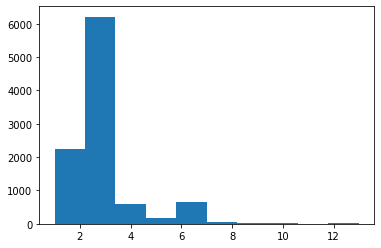

In [134]:
#patternのヒストグラム出す
li = []
for i in pattern.values():
    li.append(i)
import matplotlib.pyplot as plt
plt.hist(li[:10000])

In [130]:
# corはケース同士を対応づけた辞書
cor

[2,
 4,
 7,
 3,
 1,
 4,
 4,
 4,
 3,
 3,
 3,
 6,
 3,
 3,
 3,
 2,
 4,
 6,
 3,
 3,
 3,
 3,
 3,
 5,
 3,
 3,
 6,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 6,
 3,
 5,
 3,
 6,
 5,
 3,
 5,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 6,
 3,
 3,
 3,
 3,
 3,
 5,
 3,
 3,
 6,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 6,
 3,
 5,
 3,
 6,
 5,
 3,
 5,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 8,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 2,
 3,
 2,
 3,
 4,
 4,
 3,
 5,
 3,
 3,
 6,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 6,
 3,
 6,
 3,
 6,
 5,
 3,
 5,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 3,
 3,
 3,
 8,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 5,
 3,
 3,
 5,
 3,
 6,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 6,
 3,
 4,
 3,
 4,
 3,
 3,
 6,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 6,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 2,
 4,
 3,
 3,
 6,
 3,
 4,
 6,
 2,
 6,
 4,
 2,
 1,
 3,
 3,
 4,
 3,
 3,
 3,
 4,
 4,
 3,
 3,
 2,
 2,
 3,
 3,
 2,
 3,
 3,
 6,
 3,
 6,
 1,
 6,
 3,
 3,
 3,
 6,
 5,


In [74]:
### 実行しなくてよし
tmp = [0]
for i in for_sort:
    if tmp[0] == i[0]:
        print(tmp,i)
    tmp = i

['Application_1000158214_A', 'Application_1000158214_O', 4] ['Application_1000158214_A', 'Application_1334455775_O', 3]
['Application_1000158214_A', 'Application_1334455775_O', 3] ['Application_1000158214_A', 'Application_604716066_O', 3]
['Application_1000339879_A', 'Application_1000339879_O', 4] ['Application_1000339879_A', 'Application_276563463_O', 6]
['Application_1000339879_A', 'Application_276563463_O', 6] ['Application_1000339879_A', 'Application_381035418_O', 3]
['Application_1000604502_A', 'Application_1000604502_O', 3] ['Application_1000604502_A', 'Application_1571452825_O', 3]
['Application_1000647090_A', 'Application_1000647090_O', 3] ['Application_1000647090_A', 'Application_2036405027_O', 3]
['Application_1000691650_A', 'Application_1000691650_O', 6] ['Application_1000691650_A', 'Application_1268984213_O', 4]
['Application_1000956993_A', 'Application_1000956993_O', 4] ['Application_1000956993_A', 'Application_889580394_O', 3]
['Application_1001114274_A', 'Application_100

['Application_1009921342_A', 'Application_526635436_O', 3] ['Application_1009921342_A', 'Application_532424186_O', 6]
['Application_1009921342_A', 'Application_532424186_O', 6] ['Application_1009921342_A', 'Application_543297758_O', 3]
['Application_1009921342_A', 'Application_543297758_O', 3] ['Application_1009921342_A', 'Application_54960489_O', 3]
['Application_1009921342_A', 'Application_54960489_O', 3] ['Application_1009921342_A', 'Application_563874950_O', 3]
['Application_1009921342_A', 'Application_563874950_O', 3] ['Application_1009921342_A', 'Application_605937832_O', 6]
['Application_1009921342_A', 'Application_605937832_O', 6] ['Application_1009921342_A', 'Application_631741672_O', 3]
['Application_1009921342_A', 'Application_631741672_O', 3] ['Application_1009921342_A', 'Application_634640665_O', 3]
['Application_1009921342_A', 'Application_634640665_O', 3] ['Application_1009921342_A', 'Application_663134091_O', 3]
['Application_1009921342_A', 'Application_663134091_O', 3]

['Application_1016463575_A', 'Application_1440900290_O', 5] ['Application_1016463575_A', 'Application_1538401678_O', 3]
['Application_1016463575_A', 'Application_1538401678_O', 3] ['Application_1016463575_A', 'Application_1549194898_O', 3]
['Application_1016463575_A', 'Application_1549194898_O', 3] ['Application_1016463575_A', 'Application_1597209923_O', 3]
['Application_1016463575_A', 'Application_1597209923_O', 3] ['Application_1016463575_A', 'Application_1618887749_O', 3]
['Application_1016463575_A', 'Application_1618887749_O', 3] ['Application_1016463575_A', 'Application_1690716209_O', 3]
['Application_1016463575_A', 'Application_1690716209_O', 3] ['Application_1016463575_A', 'Application_1716665384_O', 3]
['Application_1016463575_A', 'Application_1716665384_O', 3] ['Application_1016463575_A', 'Application_1716915618_O', 3]
['Application_1016463575_A', 'Application_1716915618_O', 3] ['Application_1016463575_A', 'Application_17219016_O', 3]
['Application_1016463575_A', 'Application_

['Application_103255320_A', 'Application_1652151741_O', 3] ['Application_103255320_A', 'Application_1953905594_O', 3]
['Application_103255320_A', 'Application_1953905594_O', 3] ['Application_103255320_A', 'Application_501431890_O', 3]
['Application_1032596836_A', 'Application_1025650501_O', 3] ['Application_1032596836_A', 'Application_1032596836_O', 4]
['Application_1032596836_A', 'Application_1032596836_O', 4] ['Application_1032596836_A', 'Application_1166366844_O', 4]
['Application_1032596836_A', 'Application_1166366844_O', 4] ['Application_1032596836_A', 'Application_1886188565_O', 3]
['Application_1032596836_A', 'Application_1886188565_O', 3] ['Application_1032596836_A', 'Application_338118312_O', 3]
['Application_1032596836_A', 'Application_338118312_O', 3] ['Application_1032596836_A', 'Application_750982530_O', 6]
['Application_1032596836_A', 'Application_750982530_O', 6] ['Application_1032596836_A', 'Application_915073564_O', 6]
['Application_1032645340_A', 'Application_10326453

['Application_1043132250_A', 'Application_730906988_O', 3] ['Application_1043132250_A', 'Application_731892406_O', 3]
['Application_1043132250_A', 'Application_731892406_O', 3] ['Application_1043132250_A', 'Application_745736596_O', 3]
['Application_1043132250_A', 'Application_745736596_O', 3] ['Application_1043132250_A', 'Application_762931020_O', 6]
['Application_1043132250_A', 'Application_762931020_O', 6] ['Application_1043132250_A', 'Application_772991462_O', 5]
['Application_1043132250_A', 'Application_772991462_O', 5] ['Application_1043132250_A', 'Application_77416026_O', 6]
['Application_1043132250_A', 'Application_77416026_O', 6] ['Application_1043132250_A', 'Application_807856777_O', 3]
['Application_1043132250_A', 'Application_807856777_O', 3] ['Application_1043132250_A', 'Application_828621995_O', 3]
['Application_1043132250_A', 'Application_828621995_O', 3] ['Application_1043132250_A', 'Application_836609181_O', 6]
['Application_1043132250_A', 'Application_836609181_O', 6]

['Application_1054883456_A', 'Application_1054644292_O', 3] ['Application_1054883456_A', 'Application_1076959874_O', 3]
['Application_1054883456_A', 'Application_1076959874_O', 3] ['Application_1054883456_A', 'Application_1109017383_O', 3]
['Application_1054883456_A', 'Application_1109017383_O', 3] ['Application_1054883456_A', 'Application_1197889328_O', 3]
['Application_1054883456_A', 'Application_1197889328_O', 3] ['Application_1054883456_A', 'Application_120450797_O', 3]
['Application_1054883456_A', 'Application_120450797_O', 3] ['Application_1054883456_A', 'Application_1222103386_O', 3]
['Application_1054883456_A', 'Application_1222103386_O', 3] ['Application_1054883456_A', 'Application_1231464056_O', 3]
['Application_1054883456_A', 'Application_1231464056_O', 3] ['Application_1054883456_A', 'Application_1256502858_O', 3]
['Application_1054883456_A', 'Application_1256502858_O', 3] ['Application_1054883456_A', 'Application_1265413720_O', 3]
['Application_1054883456_A', 'Application_

['Application_1070602542_A', 'Application_1202414486_O', 3] ['Application_1070602542_A', 'Application_1220630254_O', 4]
['Application_1070602542_A', 'Application_1220630254_O', 4] ['Application_1070602542_A', 'Application_1242485588_O', 6]
['Application_1070602542_A', 'Application_1242485588_O', 6] ['Application_1070602542_A', 'Application_1255605399_O', 3]
['Application_1070602542_A', 'Application_1255605399_O', 3] ['Application_1070602542_A', 'Application_1259023048_O', 3]
['Application_1070602542_A', 'Application_1259023048_O', 3] ['Application_1070602542_A', 'Application_1313695020_O', 3]
['Application_1070602542_A', 'Application_1313695020_O', 3] ['Application_1070602542_A', 'Application_1387448614_O', 3]
['Application_1070602542_A', 'Application_1387448614_O', 3] ['Application_1070602542_A', 'Application_1440542670_O', 3]
['Application_1070602542_A', 'Application_1440542670_O', 3] ['Application_1070602542_A', 'Application_1443028801_O', 3]
['Application_1070602542_A', 'Applicatio

['Application_1085885640_A', 'Application_1882088228_O', 6] ['Application_1085885640_A', 'Application_19465348_O', 3]
['Application_1085885640_A', 'Application_19465348_O', 3] ['Application_1085885640_A', 'Application_2023992550_O', 3]
['Application_1085885640_A', 'Application_2023992550_O', 3] ['Application_1085885640_A', 'Application_2025784058_O', 6]
['Application_1085885640_A', 'Application_2025784058_O', 6] ['Application_1085885640_A', 'Application_215118209_O', 3]
['Application_1085885640_A', 'Application_215118209_O', 3] ['Application_1085885640_A', 'Application_223762502_O', 3]
['Application_1085885640_A', 'Application_223762502_O', 3] ['Application_1085885640_A', 'Application_325568439_O', 3]
['Application_1085885640_A', 'Application_325568439_O', 3] ['Application_1085885640_A', 'Application_360341371_O', 3]
['Application_1085885640_A', 'Application_360341371_O', 3] ['Application_1085885640_A', 'Application_398572337_O', 3]
['Application_1085885640_A', 'Application_398572337_O

['Application_1097183316_A', 'Application_1353821060_O', 3] ['Application_1097183316_A', 'Application_1386986736_O', 5]
['Application_1097183316_A', 'Application_1386986736_O', 5] ['Application_1097183316_A', 'Application_1447758920_O', 6]
['Application_1097183316_A', 'Application_1447758920_O', 6] ['Application_1097183316_A', 'Application_1472696186_O', 3]
['Application_1097183316_A', 'Application_1472696186_O', 3] ['Application_1097183316_A', 'Application_1478847316_O', 3]
['Application_1097183316_A', 'Application_1478847316_O', 3] ['Application_1097183316_A', 'Application_1502074864_O', 3]
['Application_1097183316_A', 'Application_1502074864_O', 3] ['Application_1097183316_A', 'Application_1585386179_O', 3]
['Application_1097183316_A', 'Application_1585386179_O', 3] ['Application_1097183316_A', 'Application_158781349_O', 6]
['Application_1097183316_A', 'Application_158781349_O', 6] ['Application_1097183316_A', 'Application_1589800058_O', 3]
['Application_1097183316_A', 'Application_

['Application_1111235083_A', 'Application_657716944_O', 3] ['Application_1111235083_A', 'Application_675032963_O', 3]
['Application_1111235083_A', 'Application_675032963_O', 3] ['Application_1111235083_A', 'Application_681692432_O', 3]
['Application_1111235083_A', 'Application_681692432_O', 3] ['Application_1111235083_A', 'Application_714861923_O', 3]
['Application_1111235083_A', 'Application_714861923_O', 3] ['Application_1111235083_A', 'Application_716501244_O', 3]
['Application_1111235083_A', 'Application_716501244_O', 3] ['Application_1111235083_A', 'Application_735555779_O', 3]
['Application_1111235083_A', 'Application_735555779_O', 3] ['Application_1111235083_A', 'Application_737251826_O', 4]
['Application_1111235083_A', 'Application_737251826_O', 4] ['Application_1111235083_A', 'Application_759582319_O', 12]
['Application_1111235083_A', 'Application_759582319_O', 12] ['Application_1111235083_A', 'Application_766537064_O', 3]
['Application_1111235083_A', 'Application_766537064_O'

['Application_1122983853_A', 'Application_1423390020_O', 3] ['Application_1122983853_A', 'Application_1474257175_O', 3]
['Application_1122983853_A', 'Application_1474257175_O', 3] ['Application_1122983853_A', 'Application_1525081371_O', 3]
['Application_1122983853_A', 'Application_1525081371_O', 3] ['Application_1122983853_A', 'Application_1555229754_O', 3]
['Application_1122983853_A', 'Application_1555229754_O', 3] ['Application_1122983853_A', 'Application_1572099344_O', 3]
['Application_1122983853_A', 'Application_1572099344_O', 3] ['Application_1122983853_A', 'Application_1596977845_O', 3]
['Application_1122983853_A', 'Application_1596977845_O', 3] ['Application_1122983853_A', 'Application_1628209692_O', 3]
['Application_1122983853_A', 'Application_1628209692_O', 3] ['Application_1122983853_A', 'Application_1649253979_O', 8]
['Application_1122983853_A', 'Application_1649253979_O', 8] ['Application_1122983853_A', 'Application_1742003314_O', 3]
['Application_1122983853_A', 'Applicatio

['Application_1146390793_A', 'Application_757113787_O', 3] ['Application_1146390793_A', 'Application_75877971_O', 3]
['Application_1146390793_A', 'Application_75877971_O', 3] ['Application_1146390793_A', 'Application_763847627_O', 3]
['Application_1146390793_A', 'Application_763847627_O', 3] ['Application_1146390793_A', 'Application_778555928_O', 3]
['Application_1146390793_A', 'Application_778555928_O', 3] ['Application_1146390793_A', 'Application_781529602_O', 3]
['Application_1146390793_A', 'Application_781529602_O', 3] ['Application_1146390793_A', 'Application_793038001_O', 3]
['Application_1146390793_A', 'Application_793038001_O', 3] ['Application_1146390793_A', 'Application_80286962_O', 3]
['Application_1146390793_A', 'Application_80286962_O', 3] ['Application_1146390793_A', 'Application_810901066_O', 3]
['Application_1146390793_A', 'Application_810901066_O', 3] ['Application_1146390793_A', 'Application_811679621_O', 3]
['Application_1146390793_A', 'Application_811679621_O', 3] [

['Application_1165106560_A', 'Application_382572595_O', 3] ['Application_1165106560_A', 'Application_639957545_O', 3]
['Application_1165106560_A', 'Application_639957545_O', 3] ['Application_1165106560_A', 'Application_670720408_O', 3]
['Application_1165106560_A', 'Application_670720408_O', 3] ['Application_1165106560_A', 'Application_818146137_O', 3]
['Application_1165106560_A', 'Application_818146137_O', 3] ['Application_1165106560_A', 'Application_828403356_O', 9]
['Application_1165106560_A', 'Application_828403356_O', 9] ['Application_1165106560_A', 'Application_85984770_O', 3]
['Application_1165438159_A', 'Application_1079252932_O', 3] ['Application_1165438159_A', 'Application_1165438159_O', 3]
['Application_1165590028_A', 'Application_1165590028_O', 3] ['Application_1165590028_A', 'Application_1330702613_O', 3]
['Application_1165741868_A', 'Application_1017828639_O', 3] ['Application_1165741868_A', 'Application_1023449033_O', 3]
['Application_1165741868_A', 'Application_102344903

['Application_1176871328_A', 'Application_71751395_O', 6] ['Application_1176871328_A', 'Application_731239222_O', 3]
['Application_1176871328_A', 'Application_731239222_O', 3] ['Application_1176871328_A', 'Application_739151315_O', 3]
['Application_1176871328_A', 'Application_739151315_O', 3] ['Application_1176871328_A', 'Application_762424366_O', 3]
['Application_1176871328_A', 'Application_762424366_O', 3] ['Application_1176871328_A', 'Application_858043864_O', 3]
['Application_1176871328_A', 'Application_858043864_O', 3] ['Application_1176871328_A', 'Application_865530320_O', 3]
['Application_1176871328_A', 'Application_865530320_O', 3] ['Application_1176871328_A', 'Application_932317770_O', 3]
['Application_1176871328_A', 'Application_932317770_O', 3] ['Application_1176871328_A', 'Application_935646988_O', 3]
['Application_1176871328_A', 'Application_935646988_O', 3] ['Application_1176871328_A', 'Application_940043354_O', 8]
['Application_1176871328_A', 'Application_940043354_O', 8

['Application_1190669233_A', 'Application_1552793568_O', 3] ['Application_1190669233_A', 'Application_1593164638_O', 3]
['Application_1190669233_A', 'Application_1593164638_O', 3] ['Application_1190669233_A', 'Application_1606677659_O', 3]
['Application_1190669233_A', 'Application_1606677659_O', 3] ['Application_1190669233_A', 'Application_1609962521_O', 3]
['Application_1190669233_A', 'Application_1609962521_O', 3] ['Application_1190669233_A', 'Application_1700302939_O', 3]
['Application_1190669233_A', 'Application_1700302939_O', 3] ['Application_1190669233_A', 'Application_1701335858_O', 3]
['Application_1190669233_A', 'Application_1701335858_O', 3] ['Application_1190669233_A', 'Application_1722688700_O', 3]
['Application_1190669233_A', 'Application_1722688700_O', 3] ['Application_1190669233_A', 'Application_1723979616_O', 3]
['Application_1190669233_A', 'Application_1723979616_O', 3] ['Application_1190669233_A', 'Application_1768638676_O', 3]
['Application_1190669233_A', 'Applicatio

['Application_120596088_A', 'Application_448030736_O', 3] ['Application_120596088_A', 'Application_791607258_O', 3]
['Application_120630886_A', 'Application_100433898_O', 3] ['Application_120630886_A', 'Application_1089072317_O', 3]
['Application_120630886_A', 'Application_1089072317_O', 3] ['Application_120630886_A', 'Application_120630886_O', 7]
['Application_120630886_A', 'Application_120630886_O', 7] ['Application_120630886_A', 'Application_1463161446_O', 3]
['Application_120630886_A', 'Application_1463161446_O', 3] ['Application_120630886_A', 'Application_352518540_O', 3]
['Application_1206316951_A', 'Application_1206316951_O', 4] ['Application_1206316951_A', 'Application_137644224_O', 3]
['Application_1206551699_A', 'Application_1206551699_O', 3] ['Application_1206551699_A', 'Application_1538131961_O', 3]
['Application_1206558139_A', 'Application_1206558139_O', 3] ['Application_1206558139_A', 'Application_396895217_O', 3]
['Application_1206648420_A', 'Application_1024176807_O', 3

['Application_1219744215_A', 'Application_1659153236_O', 3] ['Application_1219744215_A', 'Application_1744369256_O', 3]
['Application_1219744215_A', 'Application_1744369256_O', 3] ['Application_1219744215_A', 'Application_1768888685_O', 3]
['Application_1219744215_A', 'Application_1768888685_O', 3] ['Application_1219744215_A', 'Application_1775192574_O', 3]
['Application_1219744215_A', 'Application_1775192574_O', 3] ['Application_1219744215_A', 'Application_1803060707_O', 3]
['Application_1219744215_A', 'Application_1803060707_O', 3] ['Application_1219744215_A', 'Application_1841570712_O', 3]
['Application_1219744215_A', 'Application_1841570712_O', 3] ['Application_1219744215_A', 'Application_1972226928_O', 3]
['Application_1219744215_A', 'Application_1972226928_O', 3] ['Application_1219744215_A', 'Application_1974607780_O', 3]
['Application_1219744215_A', 'Application_1974607780_O', 3] ['Application_1219744215_A', 'Application_200538025_O', 3]
['Application_1219744215_A', 'Application

['Application_1231383244_A', 'Application_1115559180_O', 3] ['Application_1231383244_A', 'Application_1134274536_O', 6]
['Application_1231383244_A', 'Application_1134274536_O', 6] ['Application_1231383244_A', 'Application_1185248307_O', 3]
['Application_1231383244_A', 'Application_1185248307_O', 3] ['Application_1231383244_A', 'Application_1221068482_O', 3]
['Application_1231383244_A', 'Application_1221068482_O', 3] ['Application_1231383244_A', 'Application_1231383244_O', 3]
['Application_1231383244_A', 'Application_1231383244_O', 3] ['Application_1231383244_A', 'Application_1250493532_O', 3]
['Application_1231383244_A', 'Application_1250493532_O', 3] ['Application_1231383244_A', 'Application_1257947863_O', 3]
['Application_1231383244_A', 'Application_1257947863_O', 3] ['Application_1231383244_A', 'Application_1260340497_O', 6]
['Application_1231383244_A', 'Application_1260340497_O', 6] ['Application_1231383244_A', 'Application_1279706099_O', 3]
['Application_1231383244_A', 'Applicatio

['Application_1239904274_A', 'Application_1239904274_O', 4] ['Application_1239904274_A', 'Application_1538131961_O', 3]
['Application_1240015230_A', 'Application_117455644_O', 3] ['Application_1240015230_A', 'Application_1240015230_O', 3]
['Application_1240103447_A', 'Application_1026420873_O', 3] ['Application_1240103447_A', 'Application_1035150389_O', 3]
['Application_1240103447_A', 'Application_1035150389_O', 3] ['Application_1240103447_A', 'Application_1079022040_O', 3]
['Application_1240103447_A', 'Application_1079022040_O', 3] ['Application_1240103447_A', 'Application_1097531553_O', 3]
['Application_1240103447_A', 'Application_1097531553_O', 3] ['Application_1240103447_A', 'Application_1114338247_O', 3]
['Application_1240103447_A', 'Application_1114338247_O', 3] ['Application_1240103447_A', 'Application_1132617949_O', 3]
['Application_1240103447_A', 'Application_1132617949_O', 3] ['Application_1240103447_A', 'Application_1134241893_O', 3]
['Application_1240103447_A', 'Application

['Application_1255015984_A', 'Application_168002011_O', 3] ['Application_1255015984_A', 'Application_169182073_O', 3]
['Application_1255015984_A', 'Application_169182073_O', 3] ['Application_1255015984_A', 'Application_1705704624_O', 3]
['Application_1255015984_A', 'Application_1705704624_O', 3] ['Application_1255015984_A', 'Application_1728696176_O', 6]
['Application_1255015984_A', 'Application_1728696176_O', 6] ['Application_1255015984_A', 'Application_1737200946_O', 3]
['Application_1255015984_A', 'Application_1737200946_O', 3] ['Application_1255015984_A', 'Application_1823581202_O', 3]
['Application_1255015984_A', 'Application_1823581202_O', 3] ['Application_1255015984_A', 'Application_1830575003_O', 3]
['Application_1255015984_A', 'Application_1830575003_O', 3] ['Application_1255015984_A', 'Application_1860535787_O', 3]
['Application_1255015984_A', 'Application_1860535787_O', 3] ['Application_1255015984_A', 'Application_1892114638_O', 6]
['Application_1255015984_A', 'Application_1

['Application_1268089645_A', 'Application_1158460069_O', 3] ['Application_1268089645_A', 'Application_1173167096_O', 3]
['Application_1268089645_A', 'Application_1173167096_O', 3] ['Application_1268089645_A', 'Application_1188619723_O', 3]
['Application_1268089645_A', 'Application_1188619723_O', 3] ['Application_1268089645_A', 'Application_1202495955_O', 3]
['Application_1268089645_A', 'Application_1202495955_O', 3] ['Application_1268089645_A', 'Application_1241409815_O', 3]
['Application_1268089645_A', 'Application_1241409815_O', 3] ['Application_1268089645_A', 'Application_1247100915_O', 3]
['Application_1268089645_A', 'Application_1247100915_O', 3] ['Application_1268089645_A', 'Application_128888129_O', 3]
['Application_1268089645_A', 'Application_128888129_O', 3] ['Application_1268089645_A', 'Application_1304816880_O', 3]
['Application_1268089645_A', 'Application_1304816880_O', 3] ['Application_1268089645_A', 'Application_1310163016_O', 3]
['Application_1268089645_A', 'Application_

['Application_1273479618_A', 'Application_1794932218_O', 3] ['Application_1273479618_A', 'Application_1824816815_O', 3]
['Application_1273479618_A', 'Application_1824816815_O', 3] ['Application_1273479618_A', 'Application_1828686543_O', 3]
['Application_1273479618_A', 'Application_1828686543_O', 3] ['Application_1273479618_A', 'Application_1855034859_O', 6]
['Application_1273479618_A', 'Application_1855034859_O', 6] ['Application_1273479618_A', 'Application_1864371228_O', 6]
['Application_1273479618_A', 'Application_1864371228_O', 6] ['Application_1273479618_A', 'Application_1932873467_O', 3]
['Application_1273479618_A', 'Application_1932873467_O', 3] ['Application_1273479618_A', 'Application_194538082_O', 3]
['Application_1273479618_A', 'Application_194538082_O', 3] ['Application_1273479618_A', 'Application_1961238104_O', 3]
['Application_1273479618_A', 'Application_1961238104_O', 3] ['Application_1273479618_A', 'Application_1963573946_O', 3]
['Application_1273479618_A', 'Application_

['Application_1282499670_A', 'Application_1012566167_O', 6] ['Application_1282499670_A', 'Application_102863482_O', 3]
['Application_1282499670_A', 'Application_102863482_O', 3] ['Application_1282499670_A', 'Application_113556419_O', 3]
['Application_1282499670_A', 'Application_113556419_O', 3] ['Application_1282499670_A', 'Application_1174564131_O', 3]
['Application_1282499670_A', 'Application_1174564131_O', 3] ['Application_1282499670_A', 'Application_1195207998_O', 3]
['Application_1282499670_A', 'Application_1195207998_O', 3] ['Application_1282499670_A', 'Application_1195434598_O', 3]
['Application_1282499670_A', 'Application_1195434598_O', 3] ['Application_1282499670_A', 'Application_1238063902_O', 3]
['Application_1282499670_A', 'Application_1238063902_O', 3] ['Application_1282499670_A', 'Application_1282499670_O', 4]
['Application_1282499670_A', 'Application_1282499670_O', 4] ['Application_1282499670_A', 'Application_1302622905_O', 5]
['Application_1282499670_A', 'Application_13

['Application_1291877105_A', 'Application_876335402_O', 3] ['Application_1291877105_A', 'Application_878093890_O', 3]
['Application_1291877105_A', 'Application_878093890_O', 3] ['Application_1291877105_A', 'Application_878119155_O', 3]
['Application_1291877105_A', 'Application_878119155_O', 3] ['Application_1291877105_A', 'Application_901439262_O', 3]
['Application_1291877105_A', 'Application_901439262_O', 3] ['Application_1291877105_A', 'Application_923612441_O', 3]
['Application_1291877105_A', 'Application_923612441_O', 3] ['Application_1291877105_A', 'Application_926969528_O', 3]
['Application_1291877105_A', 'Application_926969528_O', 3] ['Application_1291877105_A', 'Application_932969568_O', 6]
['Application_1291877105_A', 'Application_932969568_O', 6] ['Application_1291877105_A', 'Application_936483069_O', 3]
['Application_1291877105_A', 'Application_936483069_O', 3] ['Application_1291877105_A', 'Application_939043540_O', 3]
['Application_1291877105_A', 'Application_939043540_O', 

['Application_1302954680_A', 'Application_71278269_O', 3] ['Application_1302954680_A', 'Application_712906549_O', 3]
['Application_1302954680_A', 'Application_712906549_O', 3] ['Application_1302954680_A', 'Application_735953270_O', 3]
['Application_1302954680_A', 'Application_735953270_O', 3] ['Application_1302954680_A', 'Application_814620974_O', 3]
['Application_1302954680_A', 'Application_814620974_O', 3] ['Application_1302954680_A', 'Application_81591081_O', 3]
['Application_1302954680_A', 'Application_81591081_O', 3] ['Application_1302954680_A', 'Application_820105256_O', 6]
['Application_1302954680_A', 'Application_820105256_O', 6] ['Application_1302954680_A', 'Application_852019949_O', 3]
['Application_1302954680_A', 'Application_852019949_O', 3] ['Application_1302954680_A', 'Application_871511729_O', 3]
['Application_1302954680_A', 'Application_871511729_O', 3] ['Application_1302954680_A', 'Application_872366334_O', 3]
['Application_1302954680_A', 'Application_872366334_O', 3] 

['Application_1306223577_A', 'Application_1327867314_O', 6] ['Application_1306223577_A', 'Application_1353481915_O', 3]
['Application_1306223577_A', 'Application_1353481915_O', 3] ['Application_1306223577_A', 'Application_1462366860_O', 3]
['Application_1306223577_A', 'Application_1462366860_O', 3] ['Application_1306223577_A', 'Application_1500356125_O', 3]
['Application_1306223577_A', 'Application_1500356125_O', 3] ['Application_1306223577_A', 'Application_1528598069_O', 3]
['Application_1306223577_A', 'Application_1528598069_O', 3] ['Application_1306223577_A', 'Application_1710790959_O', 3]
['Application_1306223577_A', 'Application_1710790959_O', 3] ['Application_1306223577_A', 'Application_1931200333_O', 3]
['Application_1306223577_A', 'Application_1931200333_O', 3] ['Application_1306223577_A', 'Application_2011065017_O', 6]
['Application_1306223577_A', 'Application_2011065017_O', 6] ['Application_1306223577_A', 'Application_2027023851_O', 3]
['Application_1306223577_A', 'Applicatio

['Application_1315354494_A', 'Application_899985996_O', 3] ['Application_1315354494_A', 'Application_971975107_O', 5]
['Application_1315354494_A', 'Application_971975107_O', 5] ['Application_1315354494_A', 'Application_975055026_O', 6]
['Application_1315409537_A', 'Application_1118266723_O', 3] ['Application_1315409537_A', 'Application_1315409537_O', 4]
['Application_1315409537_A', 'Application_1315409537_O', 4] ['Application_1315409537_A', 'Application_183143916_O', 3]
['Application_1315608886_A', 'Application_1128910355_O', 3] ['Application_1315608886_A', 'Application_1251541081_O', 3]
['Application_1315608886_A', 'Application_1251541081_O', 3] ['Application_1315608886_A', 'Application_130460765_O', 3]
['Application_1315608886_A', 'Application_130460765_O', 3] ['Application_1315608886_A', 'Application_1315608886_O', 4]
['Application_1315608886_A', 'Application_1315608886_O', 4] ['Application_1315608886_A', 'Application_1448214642_O', 3]
['Application_1315608886_A', 'Application_14482

['Application_1319673694_A', 'Application_73210566_O', 6] ['Application_1319673694_A', 'Application_744561939_O', 3]
['Application_1319673694_A', 'Application_744561939_O', 3] ['Application_1319673694_A', 'Application_788421650_O', 3]
['Application_1319673694_A', 'Application_788421650_O', 3] ['Application_1319673694_A', 'Application_8606801_O', 3]
['Application_1319673694_A', 'Application_8606801_O', 3] ['Application_1319673694_A', 'Application_878691785_O', 3]
['Application_1319673694_A', 'Application_878691785_O', 3] ['Application_1319673694_A', 'Application_902693704_O', 3]
['Application_1319673694_A', 'Application_902693704_O', 3] ['Application_1319673694_A', 'Application_954463239_O', 6]
['Application_1319673694_A', 'Application_954463239_O', 6] ['Application_1319673694_A', 'Application_977257239_O', 3]
['Application_1319673694_A', 'Application_977257239_O', 3] ['Application_1319673694_A', 'Application_986145091_O', 3]
['Application_1319714111_A', 'Application_1319714111_O', 9] [

['Application_1323807979_A', 'Application_2118332983_O', 3] ['Application_1323807979_A', 'Application_2122082068_O', 3]
['Application_1323807979_A', 'Application_2122082068_O', 3] ['Application_1323807979_A', 'Application_2144796153_O', 3]
['Application_1323807979_A', 'Application_2144796153_O', 3] ['Application_1323807979_A', 'Application_21585776_O', 3]
['Application_1323807979_A', 'Application_21585776_O', 3] ['Application_1323807979_A', 'Application_230399183_O', 3]
['Application_1323807979_A', 'Application_230399183_O', 3] ['Application_1323807979_A', 'Application_300939668_O', 6]
['Application_1323807979_A', 'Application_300939668_O', 6] ['Application_1323807979_A', 'Application_315416169_O', 3]
['Application_1323807979_A', 'Application_315416169_O', 3] ['Application_1323807979_A', 'Application_351536838_O', 3]
['Application_1323807979_A', 'Application_351536838_O', 3] ['Application_1323807979_A', 'Application_402211027_O', 3]
['Application_1323807979_A', 'Application_402211027_O

['Application_1331923786_A', 'Application_1549050622_O', 3] ['Application_1331923786_A', 'Application_1582910332_O', 5]
['Application_1331923786_A', 'Application_1582910332_O', 5] ['Application_1331923786_A', 'Application_1622777346_O', 3]
['Application_1331923786_A', 'Application_1622777346_O', 3] ['Application_1331923786_A', 'Application_1626364649_O', 3]
['Application_1331923786_A', 'Application_1626364649_O', 3] ['Application_1331923786_A', 'Application_1639521268_O', 3]
['Application_1331923786_A', 'Application_1639521268_O', 3] ['Application_1331923786_A', 'Application_1744092101_O', 3]
['Application_1331923786_A', 'Application_1744092101_O', 3] ['Application_1331923786_A', 'Application_175062798_O', 3]
['Application_1331923786_A', 'Application_175062798_O', 3] ['Application_1331923786_A', 'Application_1751849824_O', 6]
['Application_1331923786_A', 'Application_1751849824_O', 6] ['Application_1331923786_A', 'Application_1779124169_O', 3]
['Application_1331923786_A', 'Application_

['Application_134558163_A', 'Application_557305484_O', 4] ['Application_134558163_A', 'Application_593579163_O', 3]
['Application_134558163_A', 'Application_593579163_O', 3] ['Application_134558163_A', 'Application_651698168_O', 3]
['Application_134558163_A', 'Application_651698168_O', 3] ['Application_134558163_A', 'Application_666087690_O', 3]
['Application_134558163_A', 'Application_666087690_O', 3] ['Application_134558163_A', 'Application_836009953_O', 3]
['Application_134558163_A', 'Application_836009953_O', 3] ['Application_134558163_A', 'Application_864964198_O', 3]
['Application_1345660235_A', 'Application_1094185064_O', 3] ['Application_1345660235_A', 'Application_118930492_O', 3]
['Application_1345660235_A', 'Application_118930492_O', 3] ['Application_1345660235_A', 'Application_1194942496_O', 3]
['Application_1345660235_A', 'Application_1194942496_O', 3] ['Application_1345660235_A', 'Application_1211626865_O', 3]
['Application_1345660235_A', 'Application_1211626865_O', 3] ['

['Application_1354066062_A', 'Application_962221093_O', 3] ['Application_1354066062_A', 'Application_965268021_O', 5]
['Application_1354066062_A', 'Application_965268021_O', 5] ['Application_1354066062_A', 'Application_983760603_O', 3]
['Application_1354241960_A', 'Application_1342079196_O', 3] ['Application_1354241960_A', 'Application_1354241960_O', 4]
['Application_1354319745_A', 'Application_1046181469_O', 3] ['Application_1354319745_A', 'Application_1053715175_O', 3]
['Application_1354319745_A', 'Application_1053715175_O', 3] ['Application_1354319745_A', 'Application_1081528891_O', 3]
['Application_1354319745_A', 'Application_1081528891_O', 3] ['Application_1354319745_A', 'Application_1086606722_O', 3]
['Application_1354319745_A', 'Application_1086606722_O', 3] ['Application_1354319745_A', 'Application_1117214768_O', 3]
['Application_1354319745_A', 'Application_1117214768_O', 3] ['Application_1354319745_A', 'Application_1153080286_O', 3]
['Application_1354319745_A', 'Application_11

['Application_1364243564_A', 'Application_1857098025_O', 3] ['Application_1364243564_A', 'Application_1857619478_O', 3]
['Application_1364243564_A', 'Application_1857619478_O', 3] ['Application_1364243564_A', 'Application_1875888758_O', 5]
['Application_1364243564_A', 'Application_1875888758_O', 5] ['Application_1364243564_A', 'Application_1877676656_O', 3]
['Application_1364243564_A', 'Application_1877676656_O', 3] ['Application_1364243564_A', 'Application_1884834968_O', 6]
['Application_1364243564_A', 'Application_1884834968_O', 6] ['Application_1364243564_A', 'Application_188850562_O', 3]
['Application_1364243564_A', 'Application_188850562_O', 3] ['Application_1364243564_A', 'Application_1899428502_O', 3]
['Application_1364243564_A', 'Application_1899428502_O', 3] ['Application_1364243564_A', 'Application_1928302137_O', 3]
['Application_1364243564_A', 'Application_1928302137_O', 3] ['Application_1364243564_A', 'Application_1935597097_O', 3]
['Application_1364243564_A', 'Application_

KeyboardInterrupt: 

In [35]:
# あるケースが複数ケースと結びつく場合を排除する工程
nt = []
for i in range(len(t)):
    if t[i][3] not in cor:
        nt.append(t[i])

In [36]:
nt

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_

In [37]:
# 全ケース数
num = set()
for i in t:
    num.add(i[2])
a = len(num)
print(a)

# 対応づけられたケース数と誤って対応づけられたケース数
num = set()
miss = set()
for k, v in cor.items():
    if k[:-2] != v[:-2]:
        miss.add(v[:-2])
    else:
        num.add(v[:-2])
b = len(num)
print(b)
c = len(miss)
print(c)
# 対応づけられたケースの割合と，対応づけた中でのケースの正解率
print((b+c)/a,(b/(b+c)))

31509
4160
0
0.13202577041480212 1.0


In [56]:
cor

{'Application_1000339879_A': 'Application_276563463_O',
 'Application_276563463_O': 'Application_978882619_A',
 'Application_1000671285_A': 'Application_1000671285_O',
 'Application_1000671285_O': 'Application_1000671285_A',
 'Application_1000691650_A': 'Application_1000691650_O',
 'Application_1000691650_O': 'Application_208670900_A',
 'Application_1002051388_A': 'Application_1222481512_O',
 'Application_1222481512_O': 'Application_1222481512_A',
 'Application_1002485344_A': 'Application_1227771244_O',
 'Application_1227771244_O': 'Application_1720509792_A',
 'Application_1002664914_A': 'Application_1002664914_O',
 'Application_1002664914_O': 'Application_1002664914_A',
 'Application_1002961837_A': 'Application_1002961837_O',
 'Application_1002961837_O': 'Application_384806851_A',
 'Application_1003146166_A': 'Application_769670015_O',
 'Application_1001114274_O': 'Application_461492498_A',
 'Application_1399403690_O': 'Application_461492498_A',
 'Application_379321877_O': 'Applicatio

# 対応づけて得られた新しい情報から残りのcaseも対応づける(手順3)

### ケースIDを組み合わせたものからそのケースのタスク全体の流れを構築する。

In [480]:
# dicはケース名がkey，タスクの流れがvalueの辞書
dic = {}
for i in t:
    if i[3] in cor:
        # もしケース名がdicに入っていなかったら
        if i[3] not in dic:
            if cor[i[3]] not in dic:
                dic[i[3]] = [i[1]]
            else:
                dic[cor[i[3]]].append(i[1])
        else:
            dic[i[3]].append(i[1])

In [481]:
# dicはケース名がkey，タスクの流れがvalueの辞書
for i in dic.values():
    print(i)

['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Denied', 'O_Refused']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Denied', 'O_Refused']
['A_Create Application', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending', 'O_Cancelled']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accep

['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (online only)', 'A_Complete', 'O_Create Offer', 'O_Created', 'O_Sent (online only)', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Validating', 'O_Returned', 'A_Incomplete', 'O_Accepted', 'A_Pending', 'O_Cancelled', 'O_Cancelled']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'O_Create Offer', 'O_Created', 'O_Sent (online only)', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'A_Incomplete', 'O_Accepted', 'A_Pending', 'O_Cancelled']
['A_Create Application', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'O_Accepted', 'A_Pending']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_

['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending', 'O_Cancelled']
['A_Create Application', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'O_Accepted', 'A_Pending', 'O_Cancelled']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending', 'O_Cancelled']
['A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Cr

In [482]:
dic2 = {}
for i in dic.values():
    tmp = 0
    f = 0
    for j in range(len(i)):
        # 全て同じ組織のタスクだったら削除
        if i[j][0] == tmp or tmp == 0:
            tmp = i[j][0]
            continue
        else:
            f = 1
            tmp = i[j][0]
    if f == 1:
        i = tuple(i)
        if i in dic2:
            dic2[i] += 1
        else:
            dic2[i] = 1

In [35]:
dic2

{('A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'O_Create Offer',
  'O_Created',
  'O_Sent (mail and online)',
  'A_Complete',
  'O_Create Offer',
  'O_Created',
  'O_Sent (mail and online)',
  'A_Validating',
  'O_Returned',
  'A_Incomplete',
  'A_Validating',
  'A_Incomplete',
  'A_Validating',
  'O_Accepted',
  'A_Pending',
  'O_Cancelled'): 65,
 ('A_Create Application',
  'A_Submitted',
  'A_Concept',
  'A_Accepted',
  'O_Create Offer',
  'O_Created',
  'O_Create Offer',
  'O_Created',
  'O_Sent (mail and online)',
  'O_Sent (mail and online)',
  'A_Complete',
  'A_Validating',
  'O_Returned',
  'A_Incomplete',
  'O_Accepted',
  'A_Pending',
  'O_Cancelled'): 94,
 ('A_Create Application',
  'A_Concept',
  'A_Accepted',
  'O_Create Offer',
  'O_Created',
  'O_Create Offer',
  'O_Created',
  'O_Sent (mail and online)',
  'O_Sent (mail and online)',
  'A_Complete',
  'A_Validating',
  'O_Returned',
  'A_Incomplete',
  'A_Validating',
  'O_Accepted',
  'A_Pe

#### 今までに見つかっていない組織を跨ぐ形の順序関係を抽出する

In [483]:
ans = {}
for k, v in dic2.items():
    i = 0
    while i < len(k):
        if i == 0:
            org = k[i][0]
            i += 1
            continue
        # もし前項と異なるタスクが出てきたら
        if org != k[i][0]:
            j = 0
            tmp = []
            while  i + j < len(k) and org != k[i+j][0]:
                tmp.append([k[i-1],k[i+j]])
                j += 1
            
            if i+j < len(k):
                for each in tmp:
                    flow = tuple(each + [k[i+j]])
                    if flow not in ans:
                        ans[flow] = v
                    else:
                        ans[flow] += v
            org = k[i][0]
            i += j
        else:
            i += 1

[1.0000e+00 1.0000e+00 7.5000e+00 3.7000e+01 5.7000e+01 8.7450e+02
 4.2075e+03 5.7220e+03]


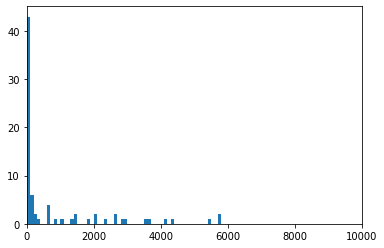

In [44]:
import matplotlib.pyplot as plt
m = 10000
li = [i for i in ans.values()]
plt.xlim(0,m)
plt.hist(li, bins=100,range=(0,m))
c_array = np.percentile(li, q=[0, 5, 25,40, 50, 75, 95, 100])
print(c_array)

('A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Complete', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending', 'O_Cancelled') 65
('A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'O_Accepted', 'A_Pending', 'O_Cancelled') 94
('A_Create Application', 'A_Concept', 'A_Accepted', 'O_Create Offer', 'O_Created', 'O_Create Offer', 'O_Created', 'O_Sent (mail and online)', 'O_Sent (mail and online)', 'A_Complete', 'A_Validating', 'O_Returned', 'A_Incomplete', 'A_Validating', 'O_Accepted', 'A_Pending', 'O_Cancelled') 46
('A_Create Application', 'A_Submitted', 'A_Concept', 'A_Accepted', 'O_Create Offe

### 上の情報を用いて残りのケースIDをくっつける。
##### 今まで見つかっていない二項間のタスクの繋がりを抽出する

In [37]:
from_workflow = set()
for i in common:
    pre = i[0]
    for j in range(1,len(i)):
        if pre[0] != i[j][0]:
            from_workflow.add((pre,i[j]))
        pre = i[j]

In [39]:
from_workflow

{('A_Accepted', 'O_Create Offer'),
 ('A_Complete', 'O_Cancelled'),
 ('A_Complete', 'O_Create Offer'),
 ('A_Complete', 'O_Sent (mail and online)'),
 ('A_Incomplete', 'O_Accepted'),
 ('A_Incomplete', 'O_Create Offer'),
 ('A_Incomplete', 'O_Returned'),
 ('A_Incomplete', 'O_Sent (online only)'),
 ('A_Pending', 'O_Cancelled'),
 ('A_Validating', 'O_Accepted'),
 ('A_Validating', 'O_Create Offer'),
 ('A_Validating', 'O_Returned'),
 ('O_Accepted', 'A_Pending'),
 ('O_Created', 'A_Incomplete'),
 ('O_Created', 'A_Validating'),
 ('O_Returned', 'A_Incomplete'),
 ('O_Returned', 'A_Validating'),
 ('O_Sent (mail and online)', 'A_Complete'),
 ('O_Sent (mail and online)', 'A_Incomplete'),
 ('O_Sent (mail and online)', 'A_Validating'),
 ('O_Sent (online only)', 'A_Validating')}

In [38]:
from_workflow - ans1

NameError: name 'ans1' is not defined

In [47]:
print(len(ans1 - from_workflow))
print(len(ans1), len(from_workflow), len(ans1& from_workflow))

43
54 14 11


## 組織間を跨ぐ移動をしている部分のタスクのペアと時間差を抽出し，それをまだケースが対応づけられていない部分に適用してみる

In [484]:
# dicはケース名がkey，（タスク,時刻)の流れがvalueの辞書
dic = {}
for i in t:
    if i[3] in cor:
        # もしケース名がdicに入っていなかったら
        if i[3] not in dic:
            if cor[i[3]] not in dic:
                dic[i[3]] = [(i[1],i[0])]
            else:
                dic[cor[i[3]]].append((i[1],i[0]))
        else:
            dic[i[3]].append((i[1],i[0]))

In [485]:
dic

{'Application_1878239836_A': [('A_Create Application',
   datetime.datetime(2016, 1, 1, 13, 35, 26, 422000)),
  ('A_Submitted', datetime.datetime(2016, 1, 1, 13, 35, 26, 463000)),
  ('A_Concept', datetime.datetime(2016, 1, 1, 13, 36, 31, 3000)),
  ('A_Accepted', datetime.datetime(2016, 1, 2, 13, 59, 27, 406000)),
  ('O_Create Offer', datetime.datetime(2016, 1, 2, 13, 59, 59, 998000)),
  ('O_Created', datetime.datetime(2016, 1, 2, 14, 0, 1, 362000)),
  ('O_Sent (mail and online)',
   datetime.datetime(2016, 1, 2, 14, 0, 19, 890000)),
  ('A_Complete', datetime.datetime(2016, 1, 2, 14, 0, 20, 11000)),
  ('A_Validating', datetime.datetime(2016, 1, 8, 10, 8, 50, 154000)),
  ('O_Returned', datetime.datetime(2016, 1, 8, 10, 9, 9, 540000)),
  ('A_Denied', datetime.datetime(2016, 1, 11, 9, 30, 52, 964000)),
  ('O_Refused', datetime.datetime(2016, 1, 11, 9, 30, 52, 996000))],
 'Application_180547487_A': [('A_Create Application',
   datetime.datetime(2016, 1, 1, 17, 4, 16, 739000)),
  ('A_Submitt

In [486]:
# interはタスクのペアをkey,時間差の配列をvalueとした辞書
inter = {}
for v in dic.values():
    pre = v[0]
    for i in range(1,len(v)):
        # もし異なる組織だったら
        if pre[0][0] != v[i][0][0]:
            if (pre[0],v[i][0]) not in inter:
                inter[(pre[0],v[i][0])] = [v[i][1] - pre[1]]
            else:
                inter[(pre[0],v[i][0])].append(v[i][1] - pre[1])
        pre = v[i]

In [26]:
# nをとってタスクのペアを絞って
inter

{('A_Accepted',
  'O_Create Offer'): [datetime.timedelta(seconds=32, microseconds=592000), datetime.timedelta(seconds=132, microseconds=414000), datetime.timedelta(seconds=199, microseconds=571000), datetime.timedelta(seconds=183, microseconds=173000), datetime.timedelta(seconds=113, microseconds=533000), datetime.timedelta(seconds=196, microseconds=185000), datetime.timedelta(seconds=359, microseconds=857000), datetime.timedelta(seconds=93, microseconds=182000), datetime.timedelta(seconds=170, microseconds=735000), datetime.timedelta(seconds=427, microseconds=980000), datetime.timedelta(seconds=85, microseconds=210000), datetime.timedelta(seconds=85, microseconds=923000), datetime.timedelta(seconds=98, microseconds=120000), datetime.timedelta(seconds=170, microseconds=595000), datetime.timedelta(seconds=34663, microseconds=775000), datetime.timedelta(seconds=118, microseconds=254000), datetime.timedelta(seconds=87, microseconds=55000), datetime.timedelta(seconds=309, microseconds=8780

('A_Denied', 'O_Refused')
282


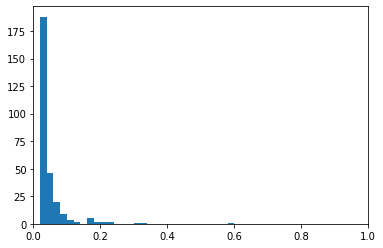

In [491]:
import matplotlib.pyplot as plt
# fig = plt.figure()
c = 0
for k, v in inter.items():
    if c == 4:
        print(k)
        # ax1 = fig.add_subplot(1, 18, c)
        li = [i.total_seconds() for i in v]
        print(len(li))
        m = 1
        plt.xlim(0,m)
        plt.hist(li,bins=50,range=(0,m))
    c += 1

In [133]:
import statistics
from scipy import stats
task_time = {}
c = 0
for k, v in inter.items():
    if len(v) > 4:
        li = [i.total_seconds() for i in v]
        c += 1
        # 分散によって閾値をかけます
        if statistics.variance(li) < 10**10:
        # if statistics.variance(li) < 10**50:
            print(k)
            print(statistics.mean(li))
            print(statistics.median(li))
            print(statistics.variance(li))
            t_dist = stats.t(loc=statistics.mean(li),scale=np.sqrt(statistics.variance(li)/10),df=len(li)-1)
            #alphaが求めたい区間に含まれる確率
            # 値を小さくすると条件が厳しくなる
            bottom, up = t_dist.interval(alpha=0.95)
            print(bottom,up)
            task_time[k] = [statistics.mean(li),statistics.median(li),bottom,up]
            # 幅が広すぎるときはandを取るか...？
print(c)

('A_Accepted', 'O_Create Offer')
5909.898055917089
155.402
5538534616.005319
-40229.5368246334 52049.332936467574
('O_Sent (mail and online)', 'A_Complete')
21.281512561576353
0.029
1807784.345153929
-812.3054696035819 854.8684947267346
('A_Validating', 'O_Returned')
3972.057954768271
12.3915
901084261.4354128
-14638.010001921019 22582.125911457562
('A_Denied', 'O_Refused')
0.04906028368794326
0.034
0.002867181406324929
0.015729138994594632 0.08239142838129189
('O_Accepted', 'A_Pending')
0.00893683932346723
0.004
0.0017895394936818154
-0.017290709731402863 0.035164388378337325
('A_Pending', 'O_Cancelled')
1118.1736888387823
0.014
2171523131.7787905
-27777.177621289655 30013.52499896722
('O_Sent (online only)', 'A_Complete')
0.04461538461538461
0.027
0.002230217094017094
0.014946563065793901 0.07428420616497533
('O_Created', 'A_Create Application')
19.98
13.822
320.41914949999995
6.926730236767437 33.03326976323257
('A_Submitted', 'O_Create Offer')
19.12088888888889
16.278
197.835797861

In [134]:
len(task_time)

14

In [135]:
import bisect
# bisectのために時間のみの配列を作る(始めてから何秒経ったか)
for_bisect = []
# 記録が取られ始めた時間
start = datetime.datetime(2016, 1, 1, 9, 51, 15)
for row in nt:
    for_bisect.append((row[0]-start).total_seconds())

count = {}

# ntの長さはO(10^5)くらい
for i in range(len(nt)):
    # task_timeの長さはO(10^2)くらい
    if i % 10000 == 0:
        print(i)
    for tasks, time in task_time.items():
        if nt[i][1] == tasks[0]:
            # time[2](時間差の中央値)後にtasks[1]が存在するかを調べる．計算量的にO(100)くらいの探索しかできない(全てでO(10^10~10^11)となる．)
            # (現在の時間+時間差)にあたる時間が何行目になるかを検索しなくてはならない．二分探索をするとO(log100000) = O(17)
            # 統計的に決定する．
            #margin = 10
            #index = bisect.bisect_left(for_bisect,(for_bisect[i]+time[1]-margin))
            index = bisect.bisect_left(for_bisect,(for_bisect[i]+max(0,time[2])))
            j = 1
            while index+j < len(for_bisect) and for_bisect[index+j] < for_bisect[i]+time[3]:
                if nt[i][3] == nt[index+j][3]:
                    break
                if tasks[1] == nt[index+j][1]:
                    #if nt[i][3] == 'Application_519991665_A' or nt[index+j][3] == 'Application_519991665_A':
                    #    print(tasks)
                    if (nt[i][3],nt[index+j][3]) not in count:
                        if (nt[index+j][3],nt[i][3]) not in count:
                            count[(nt[i][3],nt[index+j][3])] = 1
                        else:
                            count[(nt[index+j][3],nt[i][3])] += 1
                    else:
                        count[(nt[i][3],nt[index+j][3])] += 1
                    break
                j += 1

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000


In [136]:
c = 0
c_all = 0
for k, v in count.items():
    if v > 3:
        c_all += 1
        print(k,v)
        if k[0][:-2] == k[1][:-2]:
            c += 1
print(c/c_all,c_all,c_all/31509)

('Application_1120819670_A', 'Application_1120819670_O') 4
('Application_428409768_A', 'Application_428409768_O') 4
('Application_493034835_A', 'Application_493034835_O') 4
('Application_1294530310_A', 'Application_1294530310_O') 4
('Application_2082119944_A', 'Application_2082119944_O') 4
('Application_1446096185_A', 'Application_1446096185_O') 4
('Application_1018615109_A', 'Application_1018615109_O') 4
('Application_1300843234_A', 'Application_1300843234_O') 4
('Application_1999238509_A', 'Application_1999238509_O') 4
('Application_2035768049_A', 'Application_2035768049_O') 4
('Application_1374020543_A', 'Application_1374020543_O') 4
('Application_821425679_A', 'Application_821425679_O') 4
('Application_2108937169_A', 'Application_2108937169_O') 4
('Application_1474017032_O', 'Application_1474017032_A') 4
('Application_505474597_A', 'Application_505474597_O') 4
('Application_1765204099_A', 'Application_1765204099_O') 5
('Application_1825972191_A', 'Application_1825972191_O') 5
('App

('Application_1198737809_O', 'Application_1198737809_A') 5
('Application_967284572_A', 'Application_967284572_O') 4
('Application_1986688373_A', 'Application_1986688373_O') 4
('Application_1456077197_A', 'Application_1456077197_O') 4
('Application_1422939976_A', 'Application_1422939976_O') 4
('Application_1214943230_A', 'Application_1214943230_O') 4
('Application_1934066886_A', 'Application_1934066886_O') 5
('Application_1531042124_A', 'Application_1531042124_O') 5
('Application_2023183746_A', 'Application_2023183746_O') 4
('Application_1658763257_A', 'Application_1658763257_O') 4
('Application_557764012_A', 'Application_557764012_O') 4
('Application_966459722_O', 'Application_966459722_A') 4
('Application_290944033_A', 'Application_290944033_O') 4
('Application_1815489928_A', 'Application_1815489928_O') 4
('Application_415617411_A', 'Application_415617411_O') 4
('Application_652776625_A', 'Application_652776625_O') 4
('Application_1062938548_A', 'Application_1062938548_O') 4
('Applica

('Application_1314989058_A', 'Application_1314989058_O') 4
('Application_1670832368_A', 'Application_1670832368_O') 4
('Application_1305966715_A', 'Application_1305966715_O') 4
('Application_1451160092_A', 'Application_1451160092_O') 5
('Application_1384586671_O', 'Application_1384586671_A') 4
('Application_1318169061_A', 'Application_1318169061_O') 4
('Application_2062710817_A', 'Application_2062710817_O') 4
('Application_410001353_A', 'Application_410001353_O') 4
('Application_1203503451_A', 'Application_1203503451_O') 4
('Application_1219922468_A', 'Application_1219922468_O') 4
('Application_1540056890_O', 'Application_1540056890_A') 4
('Application_792937603_A', 'Application_792937603_O') 4
('Application_1519996684_A', 'Application_1519996684_O') 4
('Application_437141322_A', 'Application_437141322_O') 4
('Application_379899798_A', 'Application_379899798_O') 4
('Application_1192098372_A', 'Application_1192098372_O') 4
('Application_444033179_A', 'Application_444033179_O') 4
('Appli

('Application_437054932_A', 'Application_437054932_O') 4
('Application_1768359513_A', 'Application_1768359513_O') 4
('Application_1756651694_A', 'Application_1756651694_O') 5
('Application_623358051_A', 'Application_623358051_O') 5
('Application_145150851_A', 'Application_145150851_O') 4
('Application_1132520641_A', 'Application_1132520641_O') 4
('Application_543558947_A', 'Application_543558947_O') 4
('Application_1582627846_A', 'Application_1582627846_O') 4
('Application_519742675_A', 'Application_519742675_O') 4
('Application_1879326807_A', 'Application_1879326807_O') 4
('Application_2083462775_A', 'Application_2083462775_O') 4
('Application_1273370214_A', 'Application_1273370214_O') 4
('Application_1695086162_A', 'Application_1695086162_O') 5
('Application_275320147_A', 'Application_275320147_O') 4
('Application_1499090661_A', 'Application_1499090661_O') 5
('Application_337687736_A', 'Application_337687736_O') 4
('Application_191788242_A', 'Application_191788242_O') 5
('Application

('Application_25154984_A', 'Application_25154984_O') 4
('Application_2009787869_A', 'Application_2009787869_O') 4
('Application_1635805190_A', 'Application_1635805190_O') 5
('Application_33661599_A', 'Application_33661599_O') 4
('Application_112913308_A', 'Application_112913308_O') 4
('Application_732000832_O', 'Application_732000832_A') 4
('Application_1392535568_A', 'Application_1392535568_O') 4
('Application_138837472_A', 'Application_138837472_O') 4
('Application_1711825789_O', 'Application_1711825789_A') 4
('Application_2055348620_A', 'Application_2055348620_O') 4
('Application_2101312869_A', 'Application_2101312869_O') 4
('Application_781431798_O', 'Application_781431798_A') 4
('Application_1593090463_A', 'Application_1593090463_O') 4
('Application_1702324166_A', 'Application_1702324166_O') 4
('Application_271490883_A', 'Application_271490883_O') 4
('Application_1755596535_A', 'Application_1755596535_O') 4
('Application_396803514_A', 'Application_396803514_O') 4
('Application_913

('Application_237359086_A', 'Application_237359086_O') 4
('Application_546939502_A', 'Application_546939502_O') 4
('Application_573007376_A', 'Application_573007376_O') 4
('Application_373274571_O', 'Application_373274571_A') 4
('Application_716799928_A', 'Application_716799928_O') 4
('Application_86413773_A', 'Application_86413773_O') 4
('Application_1370196485_A', 'Application_1370196485_O') 4
('Application_55192217_A', 'Application_55192217_O') 4
('Application_1552077093_A', 'Application_1552077093_O') 4
('Application_1988514168_A', 'Application_1988514168_O') 4
('Application_79383594_A', 'Application_79383594_O') 4
('Application_1225916510_A', 'Application_1225916510_O') 4
('Application_1038561200_O', 'Application_1038561200_A') 4
('Application_2124547388_A', 'Application_2124547388_O') 4
('Application_1489308693_O', 'Application_1489308693_A') 4
('Application_1560578035_A', 'Application_1560578035_O') 4
('Application_985017248_A', 'Application_985017248_O') 5
('Application_1453597

('Application_1606123452_A', 'Application_1606123452_O') 4
('Application_1694106848_A', 'Application_1694106848_O') 4
('Application_1506967944_A', 'Application_1506967944_O') 4
('Application_592605828_A', 'Application_592605828_O') 4
('Application_893807170_A', 'Application_893807170_O') 4
('Application_454300514_A', 'Application_454300514_O') 4
('Application_815840382_A', 'Application_815840382_O') 4
('Application_312947543_O', 'Application_312947543_A') 4
('Application_1774939620_A', 'Application_1774939620_O') 4
('Application_1818695540_A', 'Application_1818695540_O') 4
('Application_1880797595_A', 'Application_1880797595_O') 4
('Application_142712048_A', 'Application_142712048_O') 4
('Application_2003208027_A', 'Application_2003208027_O') 4
('Application_97275566_A', 'Application_97275566_O') 4
('Application_2037909772_A', 'Application_2037909772_O') 4
('Application_121345362_A', 'Application_121345362_O') 4
('Application_1768215254_A', 'Application_1768215254_O') 4
('Application_1

('Application_432545630_O', 'Application_432545630_A') 4
('Application_1427125327_A', 'Application_1427125327_O') 4
('Application_1571228698_A', 'Application_1571228698_O') 4
('Application_389299871_A', 'Application_389299871_O') 4
('Application_1727040001_A', 'Application_1727040001_O') 4
('Application_418638674_O', 'Application_418638674_A') 4
('Application_592450149_A', 'Application_592450149_O') 4
('Application_1157629544_A', 'Application_1157629544_O') 4
('Application_333758826_A', 'Application_333758826_O') 4
('Application_1207241892_A', 'Application_1207241892_O') 4
('Application_288379803_A', 'Application_288379803_O') 4
('Application_1622141165_A', 'Application_1622141165_O') 4
('Application_1270199280_A', 'Application_1270199280_O') 4
('Application_1231420166_A', 'Application_1231420166_O') 4
('Application_538667985_O', 'Application_538667985_A') 4
('Application_1276950247_O', 'Application_1276950247_A') 4
('Application_1834669009_A', 'Application_1834669009_O') 4
('Applicati

In [121]:
for i in nt:
    if i[3] == 'Application_519991665_A' or i[3] == 'Application_1879532332_O':
        print(i)

[datetime.datetime(2016, 8, 16, 11, 52, 25, 103000), 'A_Create Application', 'Application_519991665', 'Application_519991665_A']
[datetime.datetime(2016, 8, 16, 11, 52, 25, 159000), 'A_Submitted', 'Application_519991665', 'Application_519991665_A']
[datetime.datetime(2016, 8, 16, 11, 54, 0, 22000), 'A_Concept', 'Application_519991665', 'Application_519991665_A']
[datetime.datetime(2016, 8, 18, 10, 44, 19, 185000), 'A_Accepted', 'Application_519991665', 'Application_519991665_A']
[datetime.datetime(2016, 8, 18, 10, 49, 51, 504000), 'O_Create Offer', 'Application_1879532332', 'Application_1879532332_O']
[datetime.datetime(2016, 8, 18, 10, 49, 52, 204000), 'O_Created', 'Application_1879532332', 'Application_1879532332_O']
[datetime.datetime(2016, 8, 18, 10, 50, 8, 759000), 'O_Create Offer', 'Application_1879532332', 'Application_1879532332_O']
[datetime.datetime(2016, 8, 18, 10, 50, 9, 476000), 'O_Created', 'Application_1879532332', 'Application_1879532332_O']
[datetime.datetime(2016, 8, 

In [86]:
nt

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_

In [48]:
ans1

{('A_Accepted', 'O_Accepted'),
 ('A_Accepted', 'O_Create Offer'),
 ('A_Accepted', 'O_Created'),
 ('A_Accepted', 'O_Returned'),
 ('A_Accepted', 'O_Sent (mail and online)'),
 ('A_Cancelled', 'O_Cancelled'),
 ('A_Complete', 'O_Accepted'),
 ('A_Complete', 'O_Create Offer'),
 ('A_Complete', 'O_Created'),
 ('A_Complete', 'O_Returned'),
 ('A_Complete', 'O_Sent (mail and online)'),
 ('A_Concept', 'O_Accepted'),
 ('A_Concept', 'O_Create Offer'),
 ('A_Concept', 'O_Created'),
 ('A_Concept', 'O_Returned'),
 ('A_Concept', 'O_Sent (mail and online)'),
 ('A_Denied', 'O_Refused'),
 ('A_Incomplete', 'O_Accepted'),
 ('A_Incomplete', 'O_Create Offer'),
 ('A_Incomplete', 'O_Created'),
 ('A_Incomplete', 'O_Returned'),
 ('A_Incomplete', 'O_Sent (mail and online)'),
 ('A_Pending', 'O_Accepted'),
 ('A_Pending', 'O_Cancelled'),
 ('A_Pending', 'O_Create Offer'),
 ('A_Pending', 'O_Created'),
 ('A_Pending', 'O_Returned'),
 ('A_Submitted', 'O_Create Offer'),
 ('A_Submitted', 'O_Created'),
 ('A_Submitted', 'O_Sent 

### 残り物だけで繰り返しやってみる．

In [9]:
T = dt.timedelta(days=0, seconds=1, microseconds=0, milliseconds=0, minutes=0, hours=0, weeks=0)
# 結合パターン
pattern = {}
ans1 = set()

t1 =t[0][0]
l = len(t)
for i in range(1,l):
    t2 = t[i][0]
    #print(t1,t2)
    if t2 - t1 < T:
        if t2 < t1:
            print("miss")
        # 辞書のキーにリストは使えないがタプルは使えるらしい
        # 組織横断だけのペアの統計もとるべき
        # 全体のケース(タスク)数も出してパーセンテージで表示する
        # 出せる値はできるだけ出しておく
        if (t[i-1][1],t[i][1]) in pattern:
            pattern [(t[i-1][1],t[i][1])] += 1
            if (pattern [(t[i-1][1],t[i][1])] > 30):
                ans1.add((t[i-1][1],t[i][1]))
        else:
            pattern [(t[i-1][1],t[i][1])] = 1
    t1 = t2

In [10]:
# timestampとタスクの繋がりの情報からケースを対応づけている
# 指標1を用いるのであればtimestampの情報いらなくないか？
# ということでtimestampを用いていないver．
import datetime
case1 = nt[0][3]
task1 = nt[0][1]
l = len(nt)
pattern = {}
for i in range(1,l):
    case2 = nt[i][3]
    task2 = nt[i][1]
    # もしcase名が異なっていたら，かつ，組織も違っており，かつ，もしそのタスクの組み合わせがあり得るものだったら
    # if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in pair:
    if case1 != case2 and case1[-1] != case2[-1] and (task1,task2) in ans1:
        if (case1,case2) not in pattern:
            if (case2,case1) not in pattern:
                pattern[(case1,case2)] = 1
            else:
                pattern[(case2,case1)] += 1
        else:
            pattern[(case1,case2)] += 1
    case1 = case2
    task1 = task2

NameError: name 'nt' is not defined

In [54]:
# 正解率をみる
s = 0
c = 0
correct = set()
not_correct = set()
for k, v in pattern.items():
    if v > 3:
        s += 1
        if k[0][:-2] == k[1][:-2]:
            c += 1
            correct.add(k[1])
        else:
            not_correct.add(k[0])
            not_correct.add(k[1])
print(c, s, c/s)

62 63 0.9841269841269841


In [55]:
# もしあるケースが複数のケースと結びつく可能性があった場合 → カウントが多い方と結びつくようにする
# つまり3回以上同じかも判定されたものの中で，
# 同じかも判定された数の多い順に対応づけする．
# corは[ケース，ケース]という対応づけられたケース名のペアが要素の配列
import copy
for_sort = []
for k, v in pattern.items():
    if v > 2:
        # A -> Oの順番にする
        if k[0][-1] == 'O':
            for_sort.append([k[1],k[0],v])
        else:
            for_sort.append([k[0],k[1],v])
for_sort.sort()
cor = []
for i in range(len(for_sort)):
    j = 1
    tmp = [[for_sort[i][0],for_sort[i][1]],for_sort[i][2]]
    while 1:
        if i + j == len(for_sort) or for_sort[i][0] != for_sort[i+j][0]:
            cor.append(tmp[0])
            break
        else:
            if tmp[1] < for_sort[i+j][2]:
                tmp = [[for_sort[i+j][0],for_sort[i+j][1]], for_sort[i+j][2]]
            j += 1
original = copy.deepcopy(cor)
cor = {}
for i in original:
    cor[i[0]] = i[1]
    cor[i[1]] = i[0]

In [56]:
# firstは対応づけられるまえのケース(組織内でのケースID)をkeyとし，
# それに対応づけられたケース(組織横断的なケースID)をvalueとする辞書．
nnt = []
for i in range(len(nt)):
    if nt[i][3] not in cor:
        nnt.append(t[i])

In [57]:
import copy
nt = copy.copy(nnt)

In [58]:
# 全ケース数
num = set()
for i in t:
    num.add(i[2])
a = len(num)
print(a)

# 対応づけられたケース数と誤って対応づけられたケース数
num = set()
miss = set()
for k, v in cor.items():
    if k[:-2] != v[:-2]:
        miss.add(v[:-2])
    else:
        num.add(v[:-2])
b = len(num)
print(b)
c = len(miss)
print(c)
# 対応づけられたケースの割合と，対応づけた中でのケースの正解率
print(b/a,(b-c)/b)

31509
299
47
0.009489352248563902 0.842809364548495


In [21]:
cor

{'Application_1000339879_A': 'Application_1000339879_O',
 'Application_1000339879_O': 'Application_1000339879_A',
 'Application_1000386745_A': 'Application_1000386745_O',
 'Application_1000386745_O': 'Application_1000386745_A',
 'Application_1000557783_A': 'Application_1000557783_O',
 'Application_1000557783_O': 'Application_1000557783_A',
 'Application_1000610355_A': 'Application_1000610355_O',
 'Application_1000610355_O': 'Application_1000610355_A',
 'Application_1000671285_A': 'Application_1000671285_O',
 'Application_1000671285_O': 'Application_1000671285_A',
 'Application_1000806256_A': 'Application_1000806256_O',
 'Application_1000806256_O': 'Application_1000806256_A',
 'Application_1000856802_A': 'Application_1000856802_O',
 'Application_1000856802_O': 'Application_1000856802_A',
 'Application_1000867366_A': 'Application_1000867366_O',
 'Application_1000867366_O': 'Application_1000867366_A',
 'Application_1001114274_A': 'Application_1001114274_O',
 'Application_1001114274_O': 'A

In [40]:
t

[[datetime.datetime(2016, 1, 1, 9, 51, 15, 304000),
  'A_Create Application',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 51, 15, 352000),
  'A_Submitted',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 9, 52, 36, 413000),
  'A_Concept',
  'Application_652823628',
  'Application_652823628_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 500000),
  'A_Create Application',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 16, 11, 549000),
  'A_Submitted',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 10, 17, 31, 594000),
  'A_Concept',
  'Application_1691306052',
  'Application_1691306052_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 177000),
  'A_Create Application',
  'Application_428409768',
  'Application_428409768_A'],
 [datetime.datetime(2016, 1, 1, 11, 19, 38, 235000),
  'A_Submitted',
  'Application_